<center><h1>TP: Manual backprop</h1></center>

# Warning :
# "File -> Save a copy in Drive" before starting to modify the notebook, otherwise changes won't be saved.


In [ ]:
!wget https://remysun.github.io/AIEDA301/TPBackprop.zip
!unzip -j TPBackprop.zip
!wget https://remysun.github.io/AIEDA301/L3/utils-data.py

--2023-10-10 06:14:54--  https://remysun.github.io/AIEDA301/TPBackprop.zip
Resolving remysun.github.io (remysun.github.io)... 185.199.109.153, 185.199.108.153, 185.199.111.153, ...
Connecting to remysun.github.io (remysun.github.io)|185.199.109.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13423382 (13M) [application/zip]
Saving to: ‘TPBackprop.zip’

TPBackprop.zip      100%[===================>]  12.80M  --.-KB/s    in 0.1s    

2023-10-10 06:14:54 (94.9 MB/s) - ‘TPBackprop.zip’ saved [13423382/13423382]

Archive:  TPBackprop.zip
  inflating: ._TP3-4                 
  inflating: circles.mat             
  inflating: ._circles.mat           
  inflating: mnist.mat               
  inflating: ._mnist.mat             
--2023-10-10 06:14:54--  https://remysun.github.io/AIEDA301/L3/utils-data.py
Resolving remysun.github.io (remysun.github.io)... 185.199.109.153, 185.199.108.153, 185.199.111.153, ...
Connecting to remysun.github.io (remysun.github.io)|185.19

In [ ]:
import math
import torch
from torch.autograd import Variable
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%run 'utils-data.py'

# Part 1 : Forward et Backward

Complete the function init_params to initialize the weights and store them in a dictionary. All weights should be initialized following a normal law with mean 0 and standard deviation 0.3.
Hint: Use torch.randn and torch.zeros

In [ ]:
def init_params(nx, nh, ny):
    """
    nx, nh, ny: integers
    out params: dictionnary
    """
    params = {}

    #####################
    ## Votre code ici  ##
    #####################
    # remplir avec les paramètres Wh, Wy, bh, by

    params["Wh"] = torch.randn((nh, nx))*0.3
    params["Wy"] = torch.randn((ny, nh))*0.3
    params["bh"] = torch.zeros((nh,1))
    params["by"] = torch.zeros((ny,1))

    ####################
    ##      FIN        #
    ####################
    return params

Complete the function forward to compute all the intermediary activations and the final output of the network given a batch of inputs X along with network weights params. The function should return a dictionary of intermediate steps and the output Y of the network.
Hint: torch.mm implements matricial multiplication and torch.tanh, torch.exp, and torch.sum give useful functions.

In [ ]:
def forward(params, X):
    """
    params: dictionnary
    X: (n_batch, dimension)
    """
    bsize = X.size(0)
    nh = params['Wh'].size(0)
    ny = params['Wy'].size(0)
    outputs = {}

    #####################
    ## Votre code ici  ##
    #####################
    # remplir avec les paramètres X, htilde, h, ytilde, yhat

    outputs["X"] = X
    outputs["htilde"] = torch.mm(X, params["Wh"].T) + params["bh"].T
    outputs["h"] = torch.tanh(outputs["htilde"])
    outputs["ytilde"] = torch.mm(outputs["h"], params["Wy"].T) + params["by"].T
    outputs["yhat"] = torch.exp(outputs["ytilde"])
    outputs["yhat"] = outputs["yhat"] / outputs["yhat"].sum(dim=-1, keepdim=True)

    ####################
    ##      FIN        #
    ####################

    return outputs['yhat'], outputs

Complete loss_accuracy to compute the cost function and the accuracy of the model from a matrix Yhat of outputs with respect to a ground truth matrix Y, and return the loss and accuracy.
Note: You should use the function _, indsY = torch.max(Y,1) to get the index of the predicted class for each sample.
Hint: You might want to use torch.mean, torch.max, torch.log and torch.sum.

In [ ]:
def loss_accuracy(Yhat, Y):

    #####################
    ## Votre code ici  ##
    #####################

    L = - torch.mean((Y * torch.log(Yhat)).sum(dim=1)) # mean for the batch

    _, indYhat = torch.max(Yhat, 1)
    _, indY = torch.max(Y, 1)

    acc = torch.sum(indY == indYhat) * 100. / indY.size(0);

    ####################
    ##      FIN        #
    ####################

    return L, acc

Complete the backward function to compute the loss gradients with respect to the parameters, and store these gradients into the output dictionary.

In [ ]:
def backward(params, outputs, Y):
    bsize = Y.shape[0]
    grads = {}

    #####################
    ## Votre code ici  ##
    #####################
    # remplir avec les paramètres Wy, Wh, by, bh

    Y_tilde_grad = outputs["yhat"] - Y
    h_tilde_grad = torch.mm(Y_tilde_grad, params['Wy']) * (1 - torch.pow(outputs['h'], 2))

    grads["Wy"] = torch.mm(Y_tilde_grad.T, outputs["h"])
    grads["Wh"] = torch.mm(h_tilde_grad.T, outputs['X'])
    grads["by"] = Y_tilde_grad.sum(dim=0,keepdim=True).T
    grads["bh"] = h_tilde_grad.sum(0, keepdim=True).T

    grads['Wy'] /= bsize
    grads['by'] /= bsize
    grads['Wh'] /= bsize
    grads['bh'] /= bsize

    ####################
    ##      FIN        #
    ####################
    return grads

Now apply the SGD steps in the sgd function to update the parameters given the computed gradients.

In [ ]:
def sgd(params, grads, eta):

    #####################
    ## Votre code ici  ##
    #####################
    # mettre à jour le contenu de params

    params['Wy'] -= eta * grads['Wy']
    params['Wh'] -= eta * grads['Wh']
    params['by'] -= eta * grads['by']
    params['bh'] -= eta * grads['bh']

    ####################
    ##      FIN        #
    ####################
    return params

## Algorithme global d'apprentissage (manuel)

Fill in the forward, backward and SGD update calls in the training loop.
Hint: The running batches Xtrain and Ytrain are already prepared for you in the code!

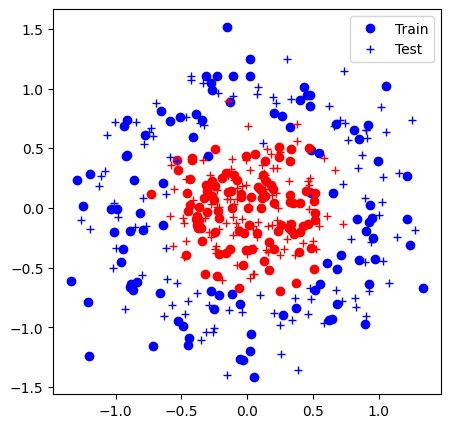

Iter 0: Acc train 53.0% (0.70), acc test 51.5% (0.70)


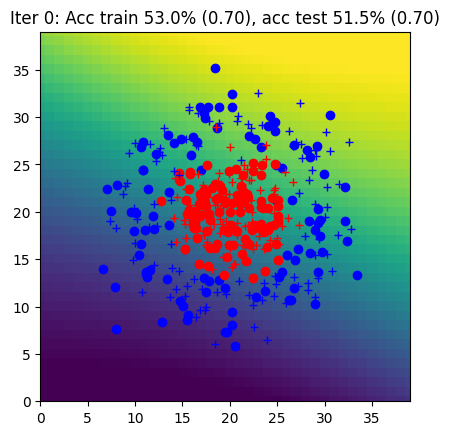

Iter 1: Acc train 54.5% (0.70), acc test 51.5% (0.70)


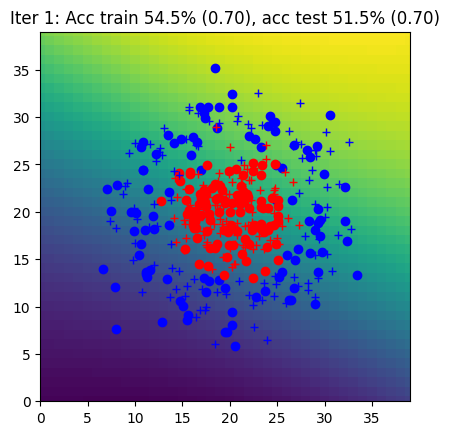

Iter 2: Acc train 54.5% (0.70), acc test 53.0% (0.70)


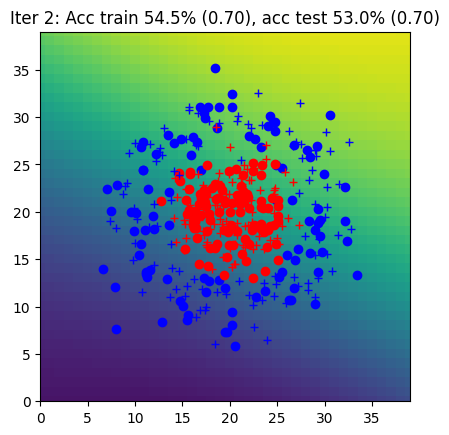

Iter 3: Acc train 54.5% (0.70), acc test 53.5% (0.70)


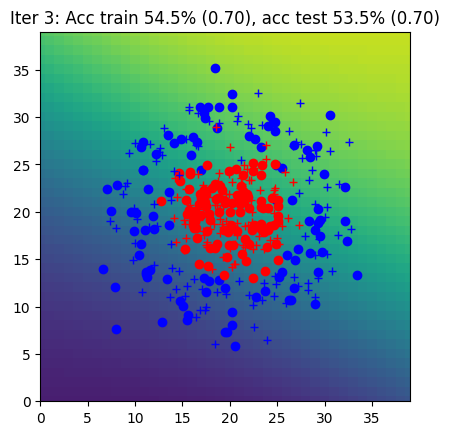

Iter 4: Acc train 54.0% (0.70), acc test 53.5% (0.69)


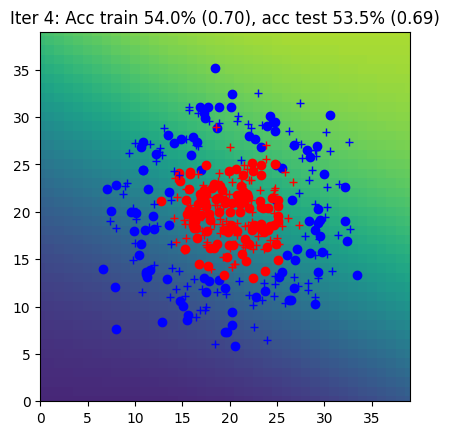

Iter 5: Acc train 55.0% (0.69), acc test 54.0% (0.69)


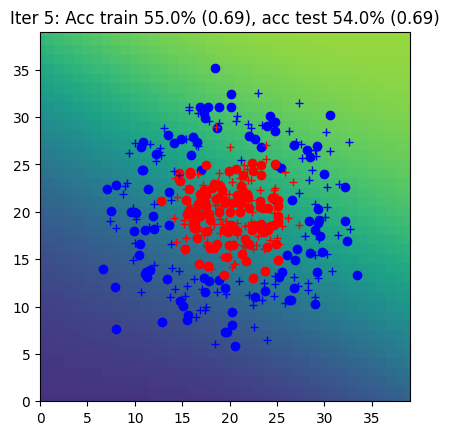

Iter 6: Acc train 56.0% (0.69), acc test 57.5% (0.69)


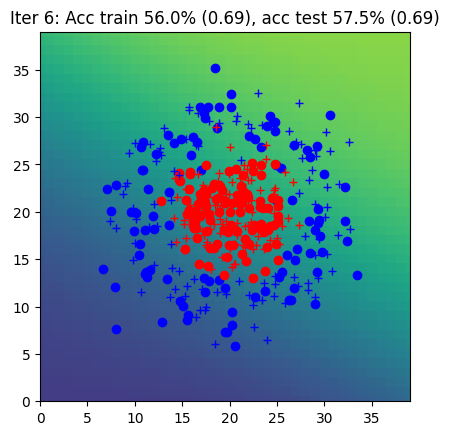

Iter 7: Acc train 55.0% (0.69), acc test 57.0% (0.69)


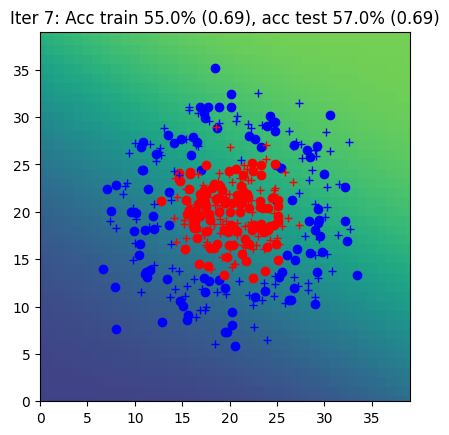

Iter 8: Acc train 56.0% (0.69), acc test 58.0% (0.69)


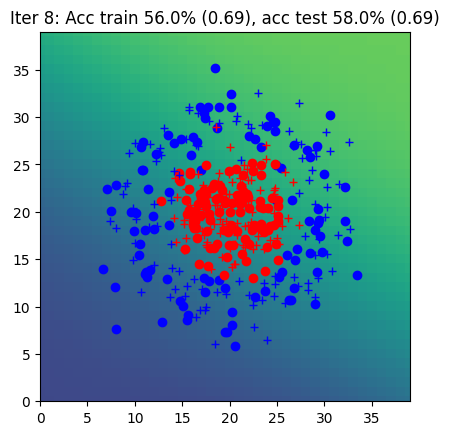

Iter 9: Acc train 58.0% (0.69), acc test 59.0% (0.69)


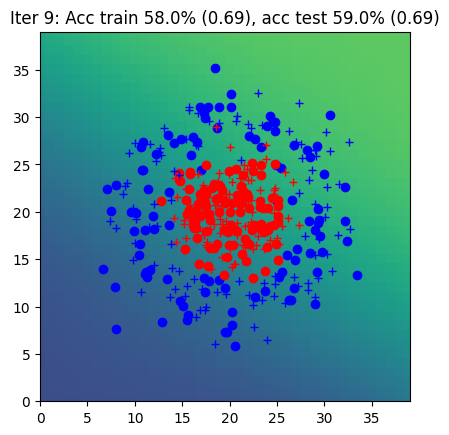

Iter 10: Acc train 59.5% (0.69), acc test 60.5% (0.69)


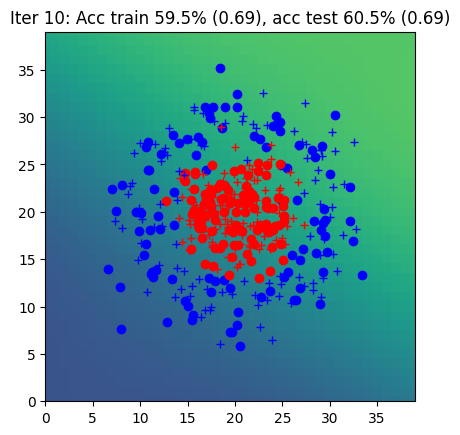

Iter 11: Acc train 59.5% (0.69), acc test 60.5% (0.69)


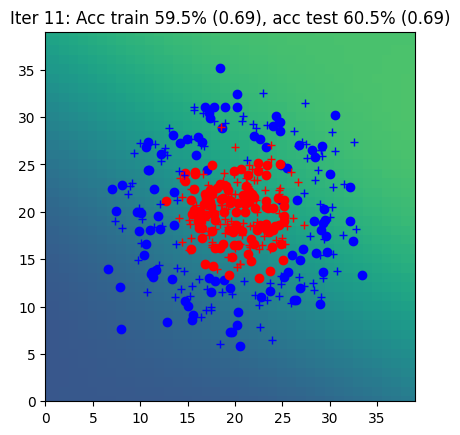

Iter 12: Acc train 58.0% (0.69), acc test 59.0% (0.69)


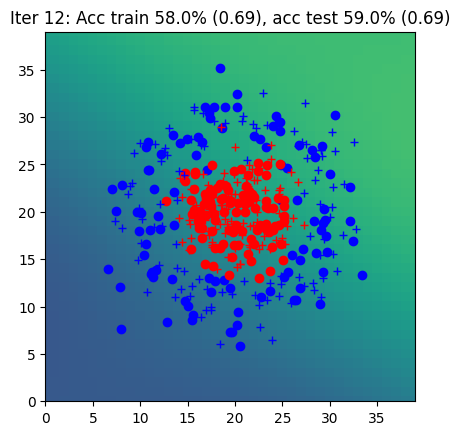

Iter 13: Acc train 56.5% (0.69), acc test 58.0% (0.69)


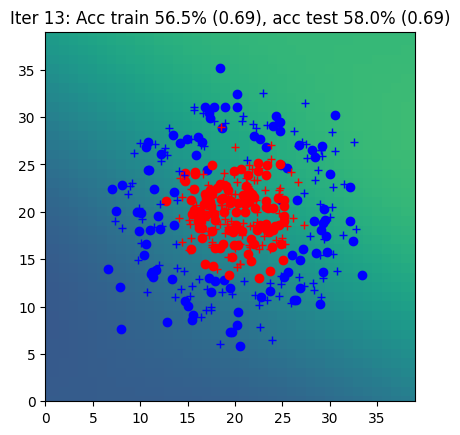

Iter 14: Acc train 58.0% (0.69), acc test 59.5% (0.69)


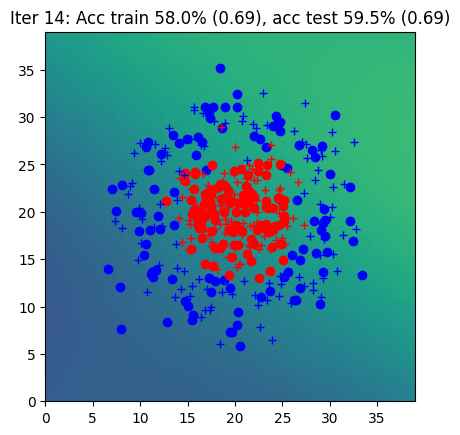

Iter 15: Acc train 57.0% (0.69), acc test 57.5% (0.69)


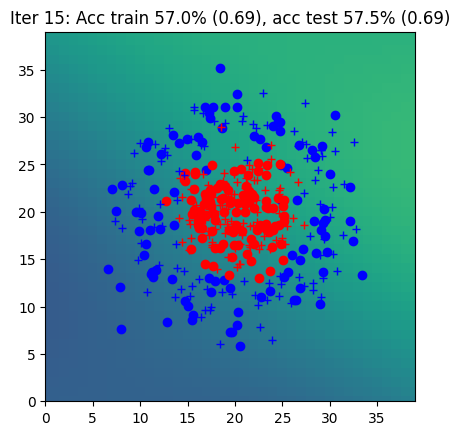

Iter 16: Acc train 57.5% (0.69), acc test 58.0% (0.69)


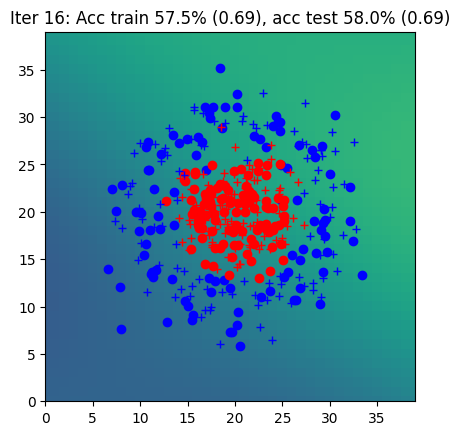

Iter 17: Acc train 59.0% (0.69), acc test 60.0% (0.69)


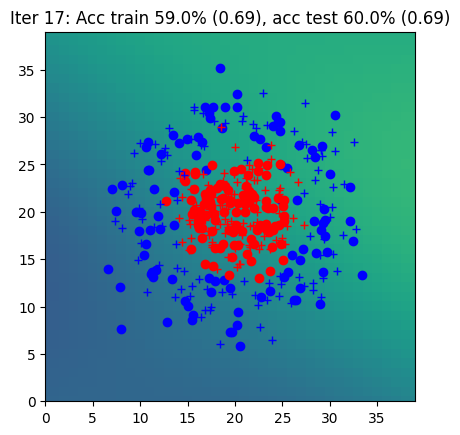

Iter 18: Acc train 61.0% (0.69), acc test 61.0% (0.69)


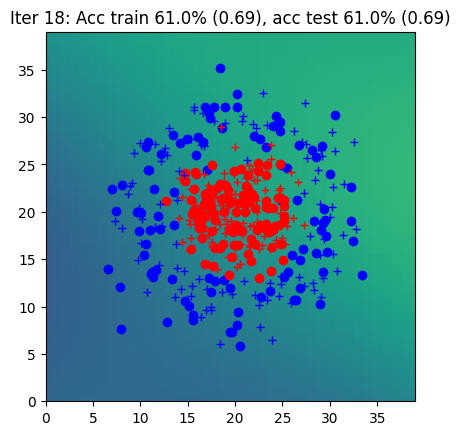

Iter 19: Acc train 61.0% (0.69), acc test 61.0% (0.69)


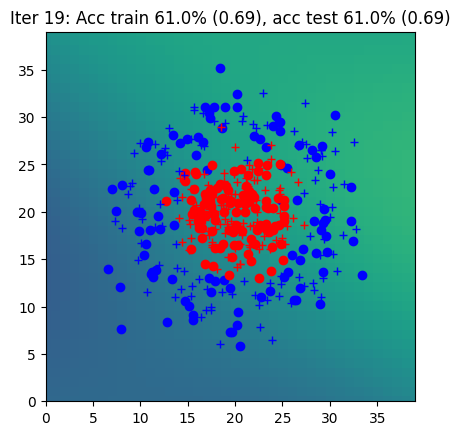

Iter 20: Acc train 60.5% (0.69), acc test 61.5% (0.69)


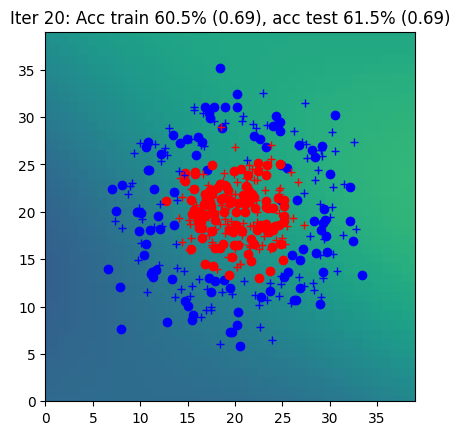

Iter 21: Acc train 62.0% (0.69), acc test 61.5% (0.69)


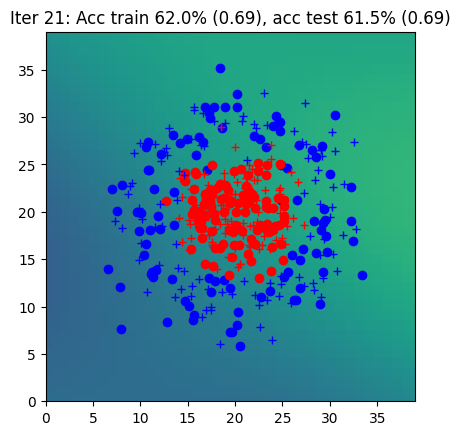

Iter 22: Acc train 61.5% (0.69), acc test 61.5% (0.69)


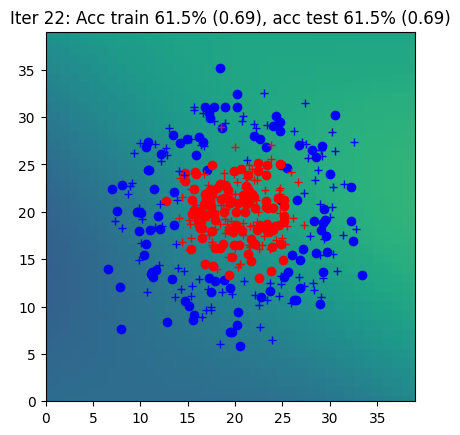

Iter 23: Acc train 61.5% (0.69), acc test 61.5% (0.69)


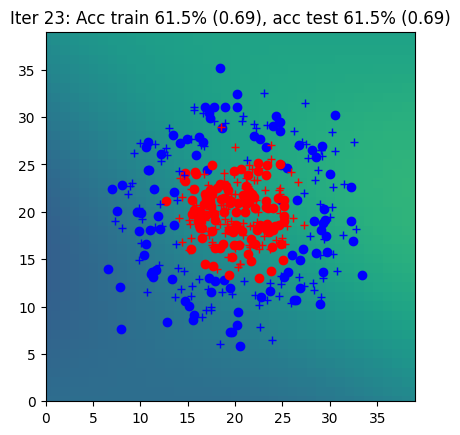

Iter 24: Acc train 61.5% (0.69), acc test 60.5% (0.69)


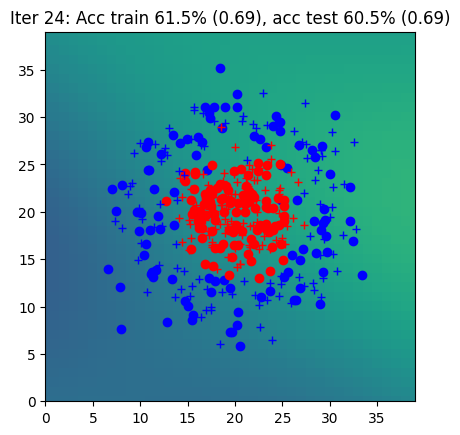

Iter 25: Acc train 61.0% (0.69), acc test 63.0% (0.69)


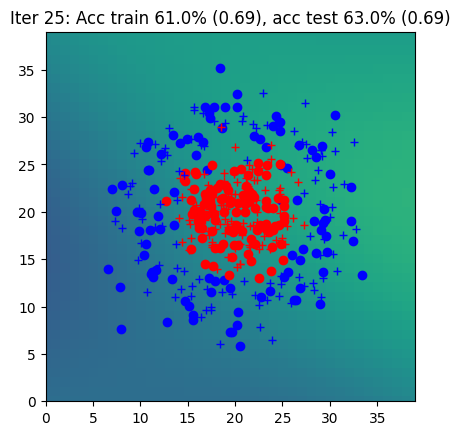

Iter 26: Acc train 63.0% (0.69), acc test 63.0% (0.69)


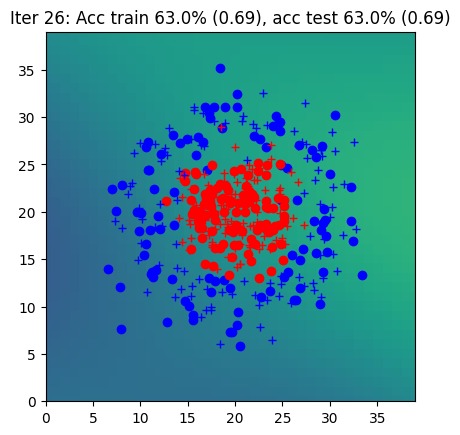

Iter 27: Acc train 63.0% (0.69), acc test 63.5% (0.69)


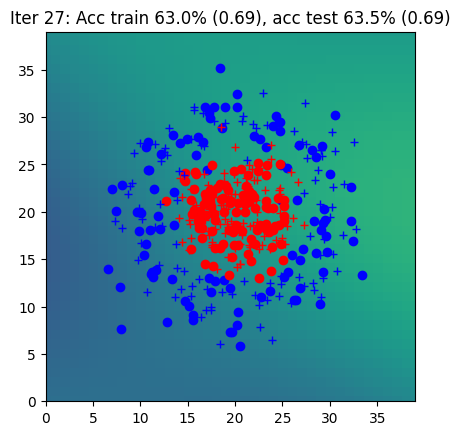

Iter 28: Acc train 61.0% (0.68), acc test 63.0% (0.69)


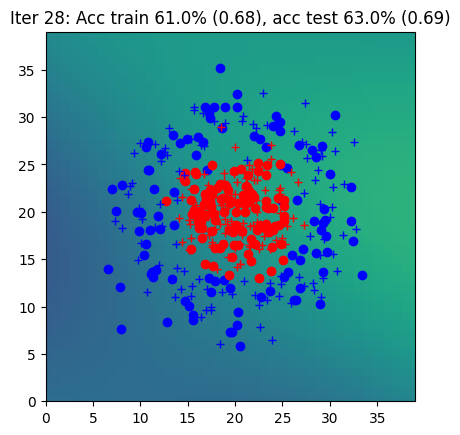

Iter 29: Acc train 63.0% (0.68), acc test 63.5% (0.69)


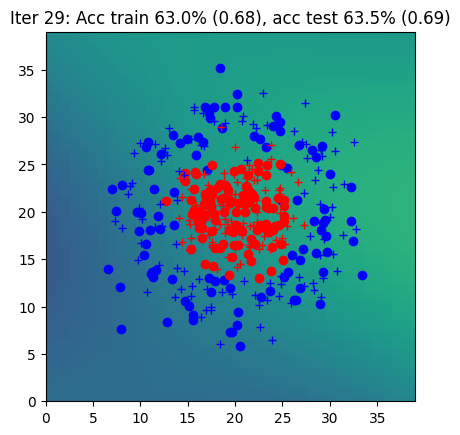

Iter 30: Acc train 67.5% (0.68), acc test 65.5% (0.69)


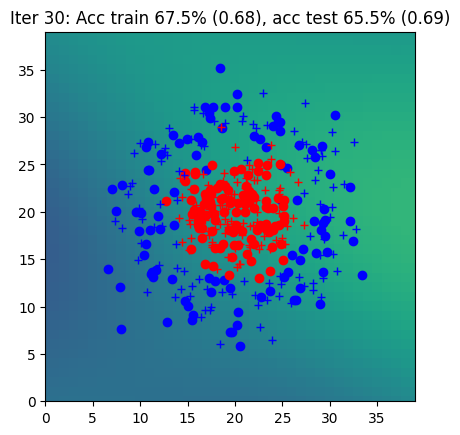

Iter 31: Acc train 64.0% (0.68), acc test 65.5% (0.68)


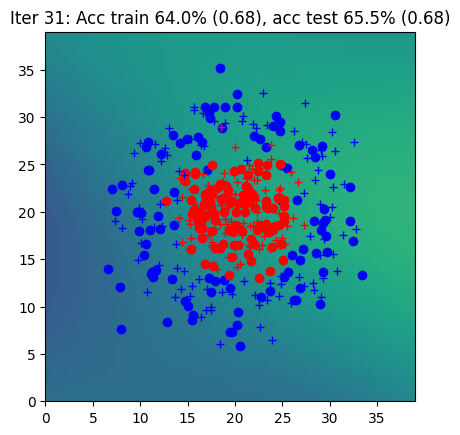

Iter 32: Acc train 60.0% (0.68), acc test 63.5% (0.68)


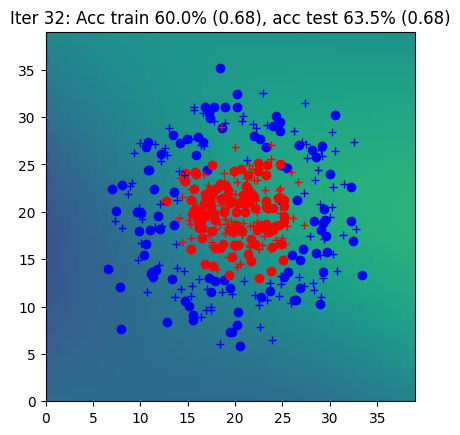

Iter 33: Acc train 62.0% (0.68), acc test 63.5% (0.68)


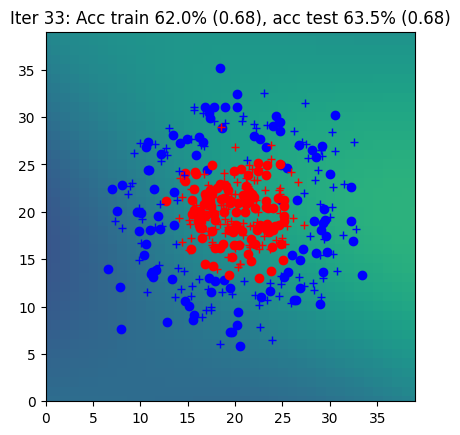

Iter 34: Acc train 60.0% (0.68), acc test 63.0% (0.68)


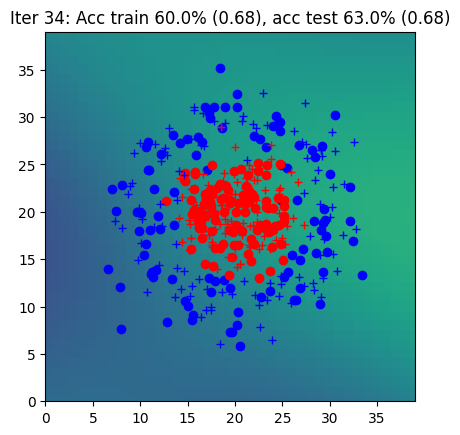

Iter 35: Acc train 62.5% (0.68), acc test 64.0% (0.68)


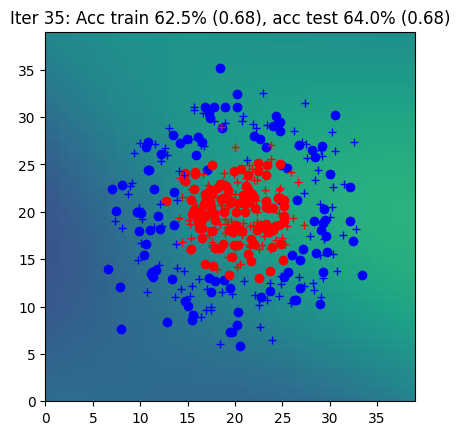

Iter 36: Acc train 62.5% (0.68), acc test 64.0% (0.68)


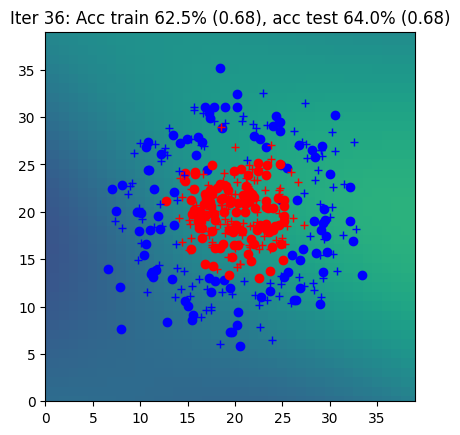

Iter 37: Acc train 60.5% (0.68), acc test 64.0% (0.68)


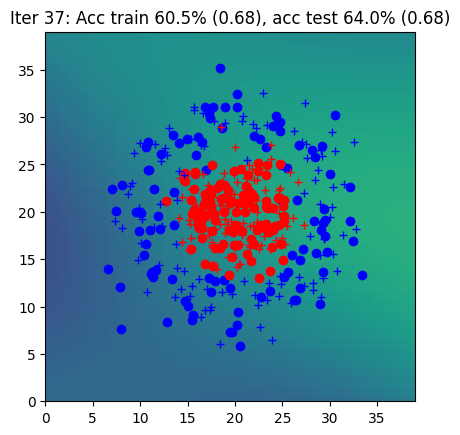

Iter 38: Acc train 64.0% (0.68), acc test 66.0% (0.68)


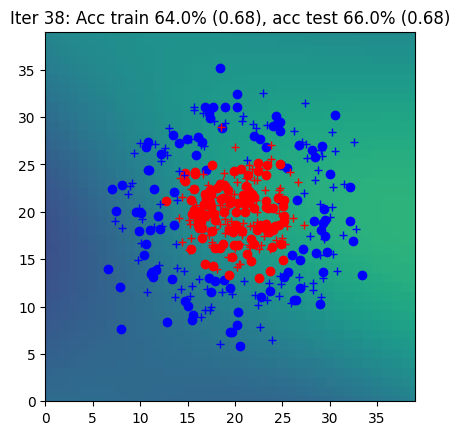

Iter 39: Acc train 66.0% (0.68), acc test 67.0% (0.68)


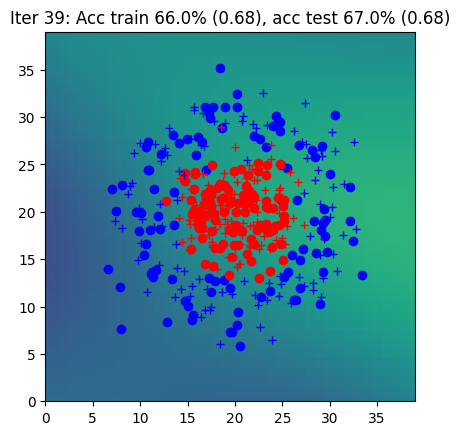

Iter 40: Acc train 67.0% (0.68), acc test 67.0% (0.68)


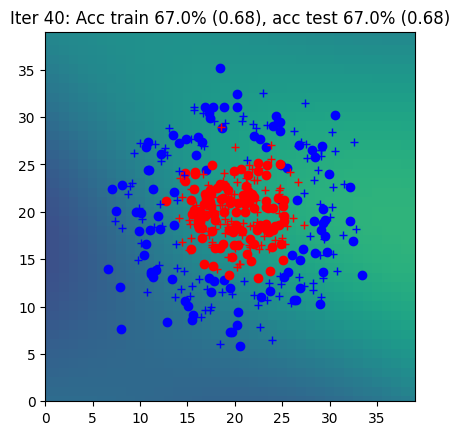

Iter 41: Acc train 64.0% (0.68), acc test 66.5% (0.68)


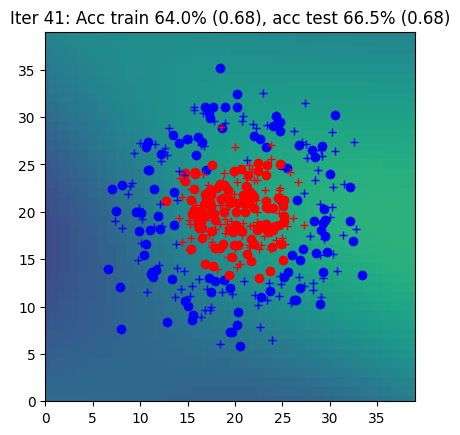

Iter 42: Acc train 67.0% (0.68), acc test 67.0% (0.68)


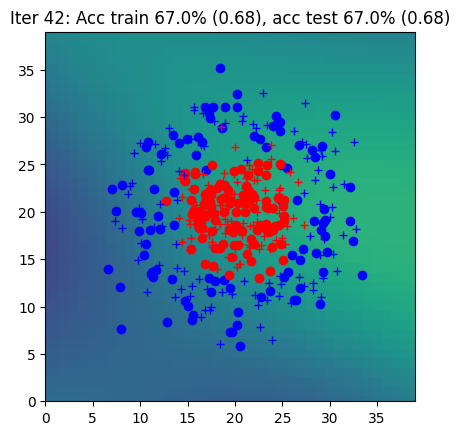

Iter 43: Acc train 67.0% (0.68), acc test 67.0% (0.68)


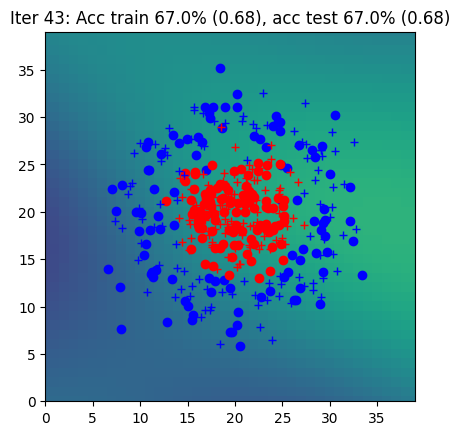

Iter 44: Acc train 67.0% (0.67), acc test 67.5% (0.68)


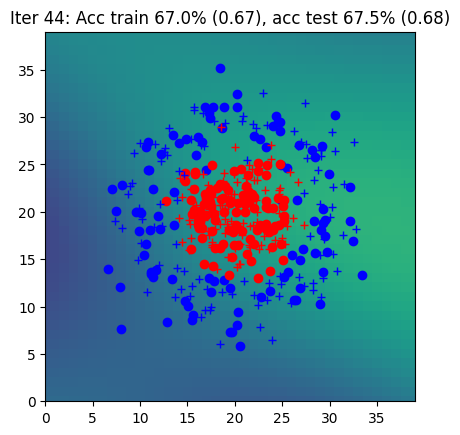

Iter 45: Acc train 66.0% (0.67), acc test 67.0% (0.68)


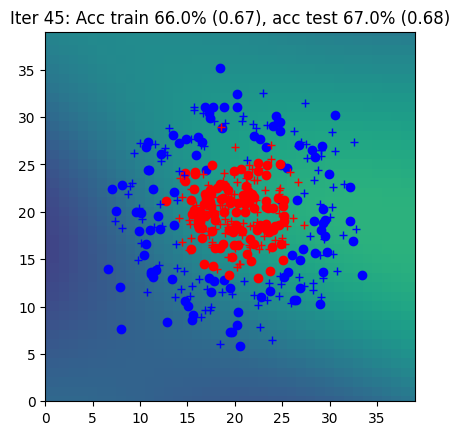

Iter 46: Acc train 68.5% (0.67), acc test 68.0% (0.67)


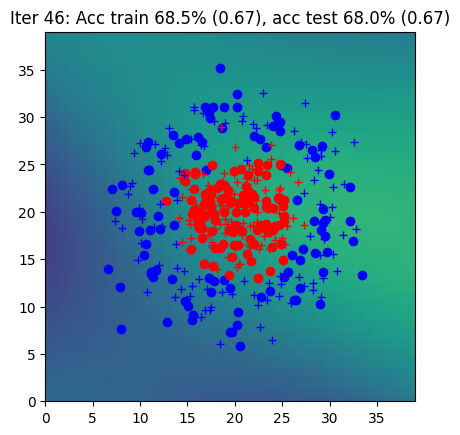

Iter 47: Acc train 69.0% (0.67), acc test 68.5% (0.67)


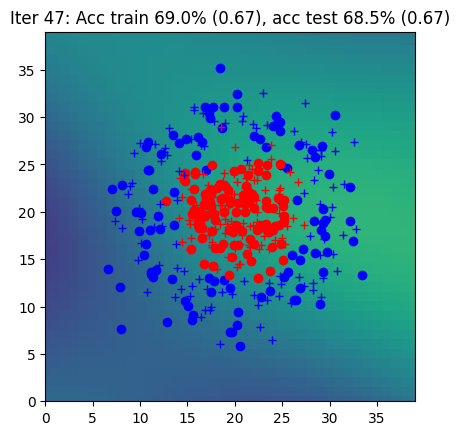

Iter 48: Acc train 69.0% (0.67), acc test 67.5% (0.67)


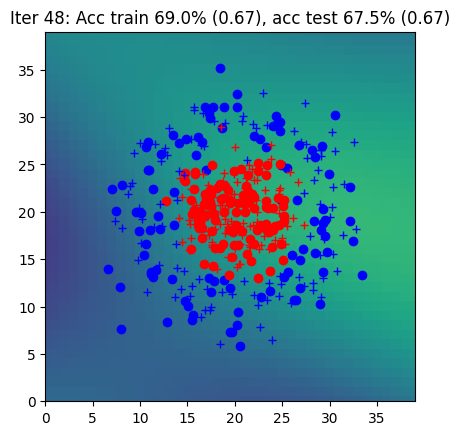

Iter 49: Acc train 69.5% (0.67), acc test 67.5% (0.67)


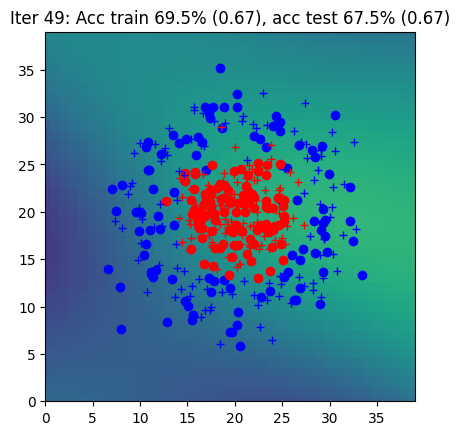

Iter 50: Acc train 69.0% (0.67), acc test 69.0% (0.67)


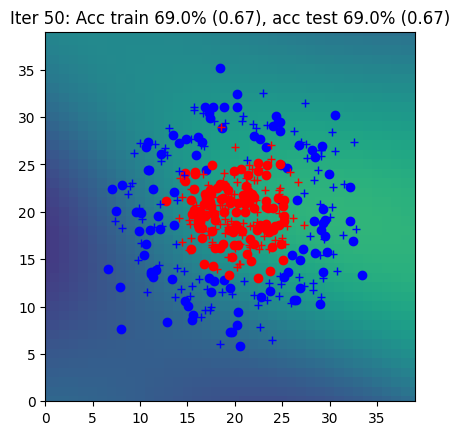

Iter 51: Acc train 69.5% (0.67), acc test 69.0% (0.67)


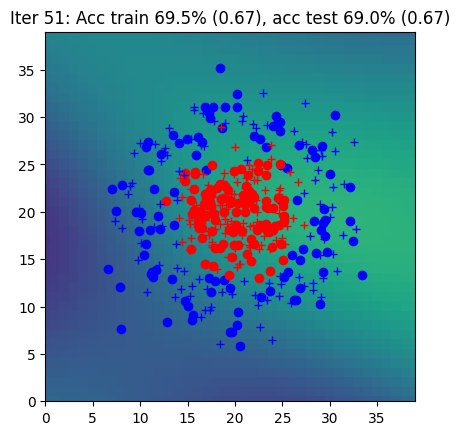

Iter 52: Acc train 70.0% (0.67), acc test 69.0% (0.67)


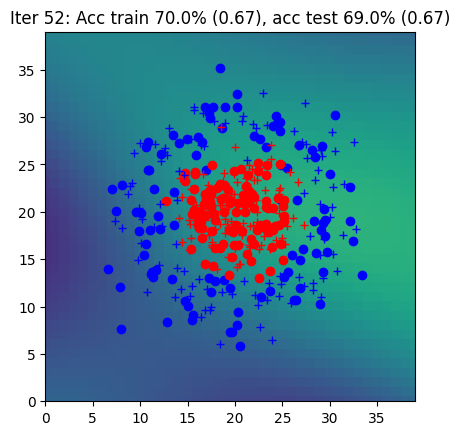

Iter 53: Acc train 70.5% (0.66), acc test 70.0% (0.67)


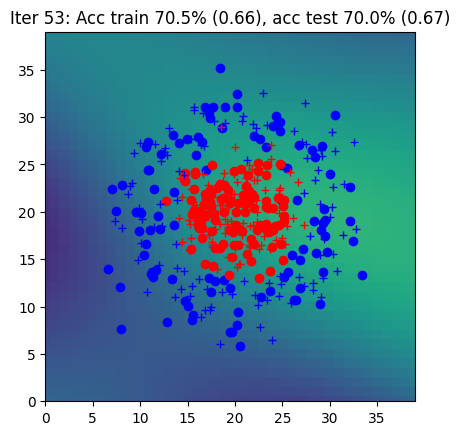

Iter 54: Acc train 70.5% (0.66), acc test 70.0% (0.66)


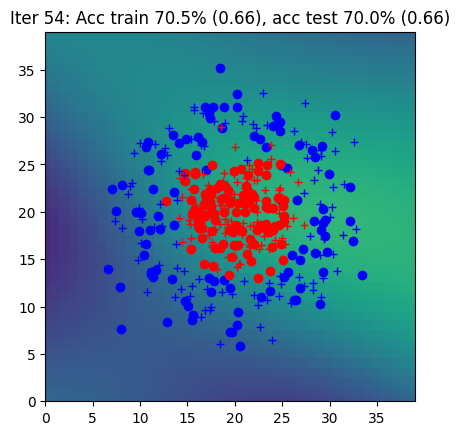

Iter 55: Acc train 70.5% (0.66), acc test 71.0% (0.66)


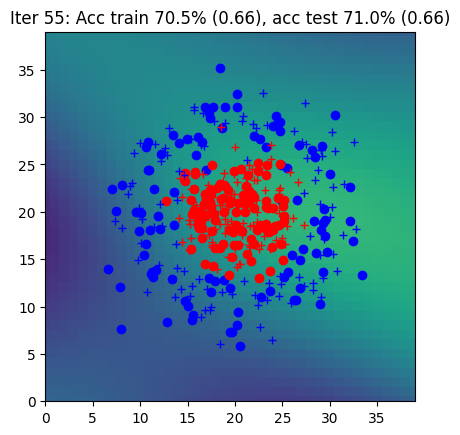

Iter 56: Acc train 69.5% (0.66), acc test 69.0% (0.66)


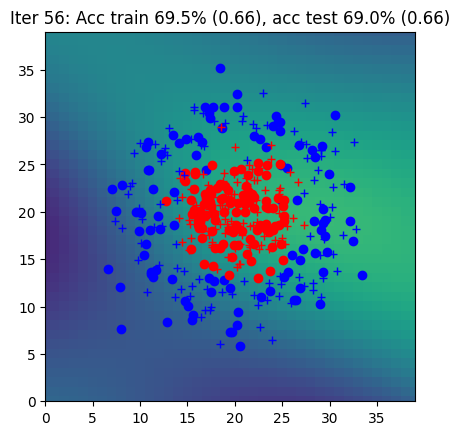

Iter 57: Acc train 71.0% (0.66), acc test 72.5% (0.66)


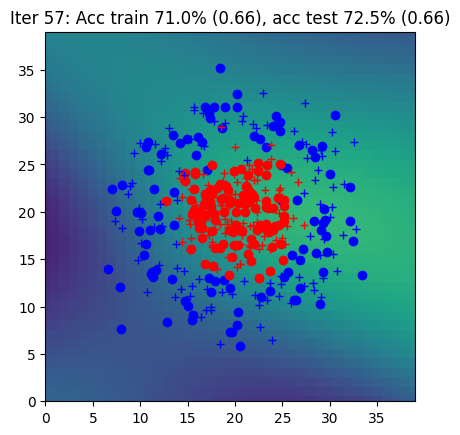

Iter 58: Acc train 70.0% (0.66), acc test 69.5% (0.66)


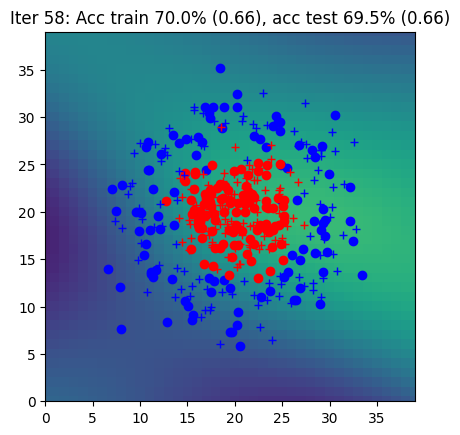

Iter 59: Acc train 72.5% (0.65), acc test 71.5% (0.66)


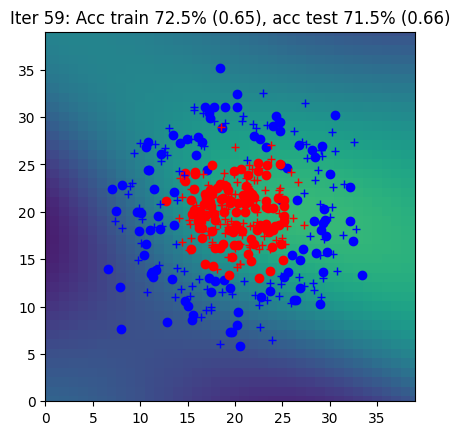

Iter 60: Acc train 73.5% (0.65), acc test 72.5% (0.65)


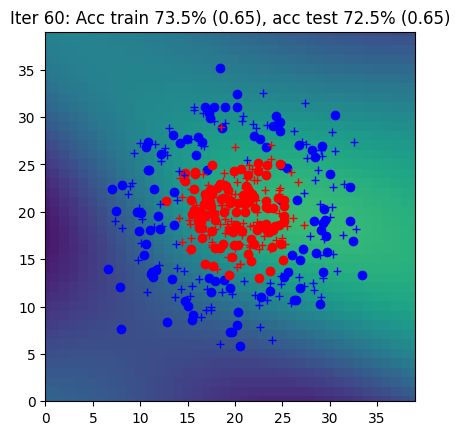

Iter 61: Acc train 75.0% (0.65), acc test 73.0% (0.65)


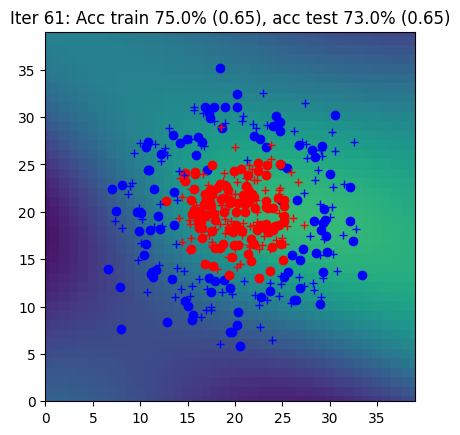

Iter 62: Acc train 76.0% (0.65), acc test 74.0% (0.65)


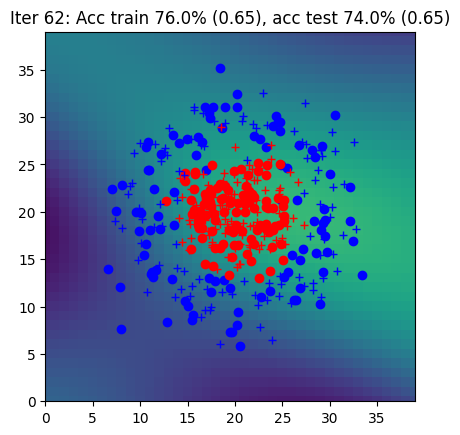

Iter 63: Acc train 76.5% (0.65), acc test 74.0% (0.65)


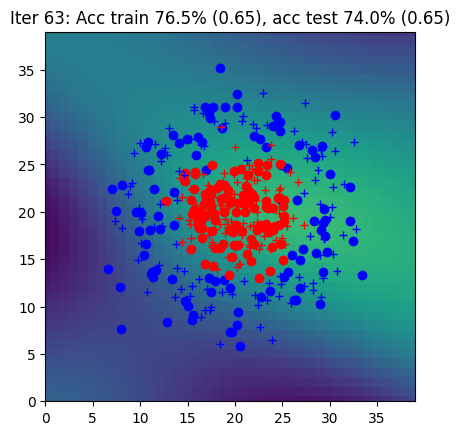

Iter 64: Acc train 77.0% (0.64), acc test 74.5% (0.65)


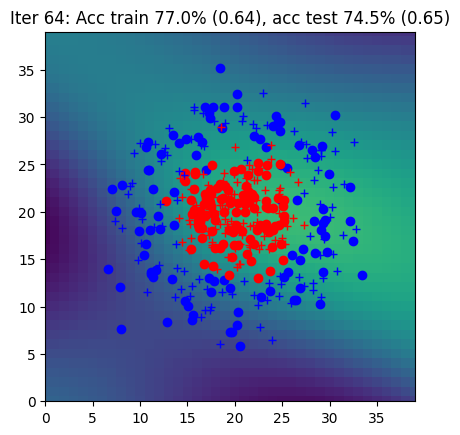

Iter 65: Acc train 75.0% (0.64), acc test 73.0% (0.64)


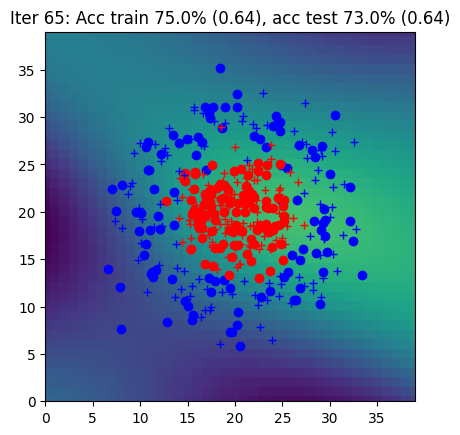

Iter 66: Acc train 77.5% (0.64), acc test 76.5% (0.64)


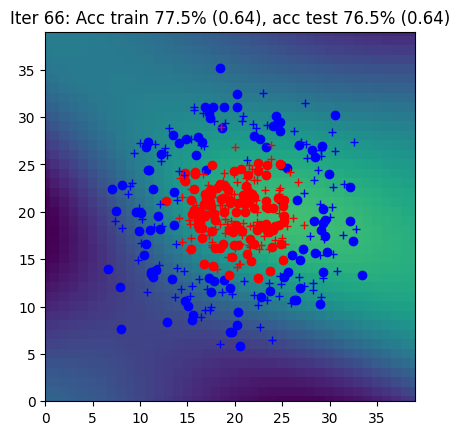

Iter 67: Acc train 78.0% (0.64), acc test 77.0% (0.64)


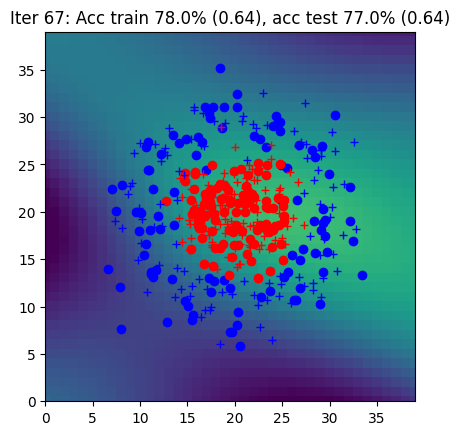

Iter 68: Acc train 78.5% (0.63), acc test 77.0% (0.64)


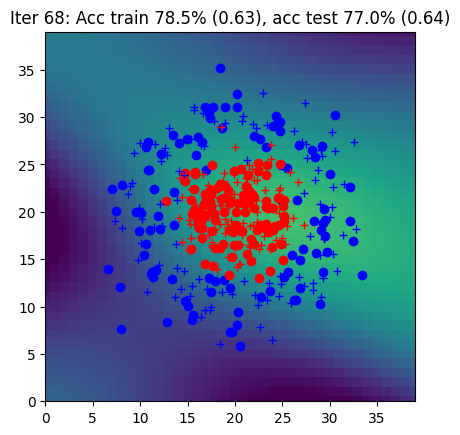

Iter 69: Acc train 80.0% (0.63), acc test 78.5% (0.63)


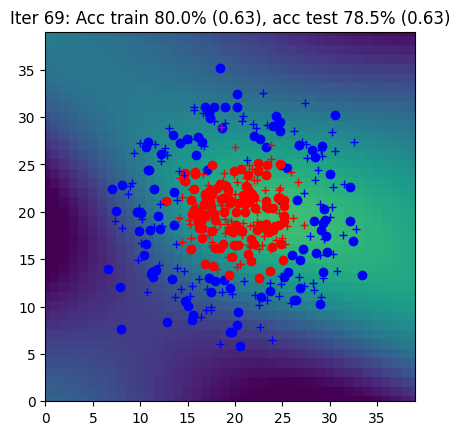

Iter 70: Acc train 78.5% (0.63), acc test 78.0% (0.63)


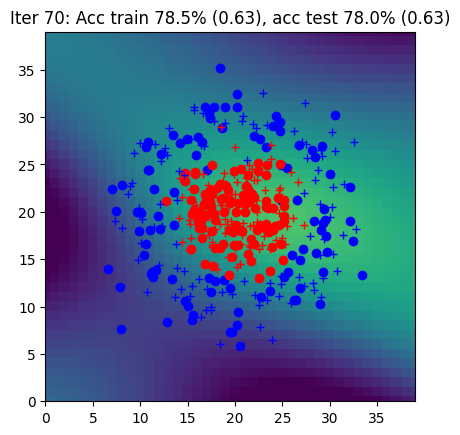

Iter 71: Acc train 78.5% (0.62), acc test 78.0% (0.63)


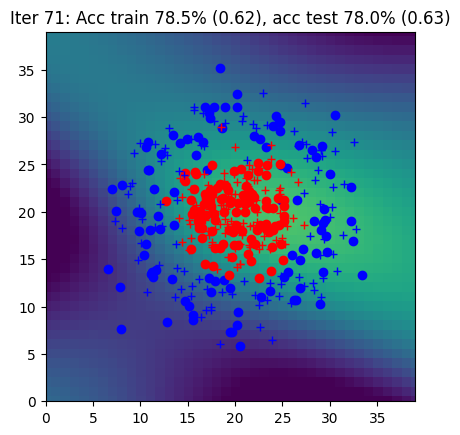

Iter 72: Acc train 78.5% (0.62), acc test 78.0% (0.62)


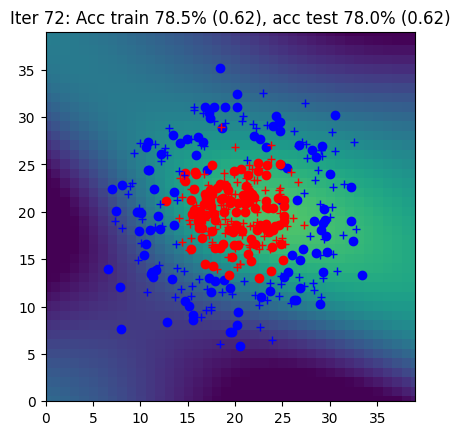

Iter 73: Acc train 80.0% (0.62), acc test 78.0% (0.62)


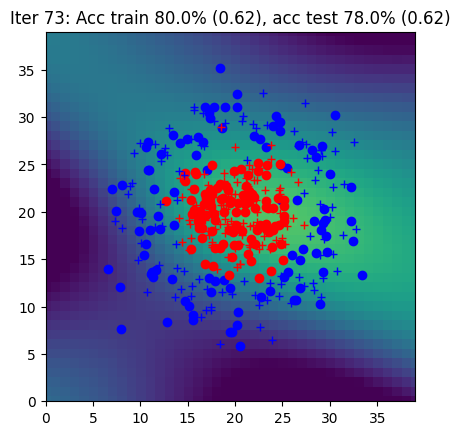

Iter 74: Acc train 81.0% (0.61), acc test 80.0% (0.62)


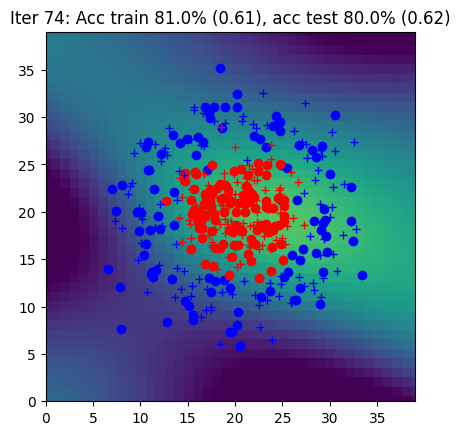

Iter 75: Acc train 81.5% (0.61), acc test 81.0% (0.61)


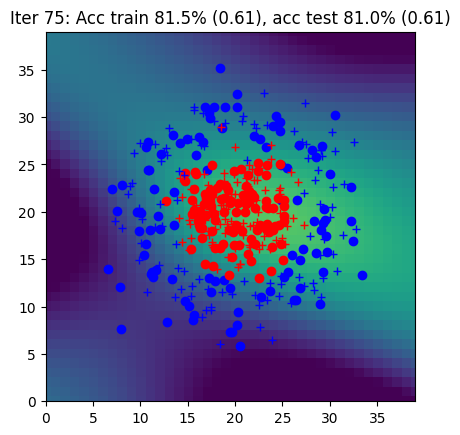

Iter 76: Acc train 82.0% (0.61), acc test 81.0% (0.61)


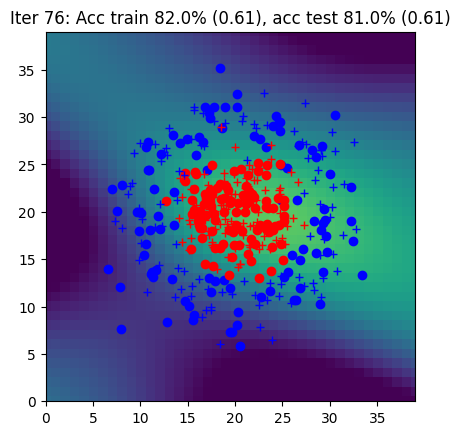

Iter 77: Acc train 82.5% (0.60), acc test 82.5% (0.61)


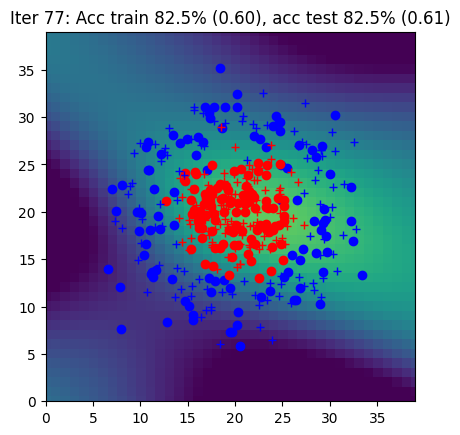

Iter 78: Acc train 82.0% (0.60), acc test 82.5% (0.60)


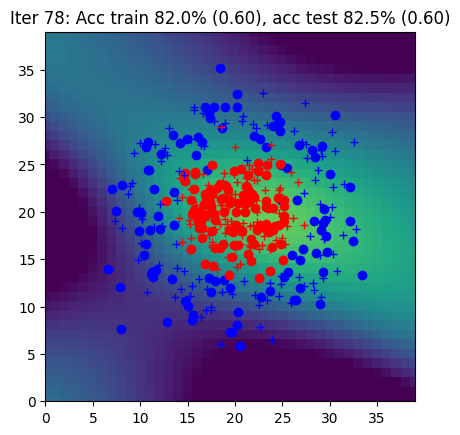

Iter 79: Acc train 82.0% (0.60), acc test 82.0% (0.60)


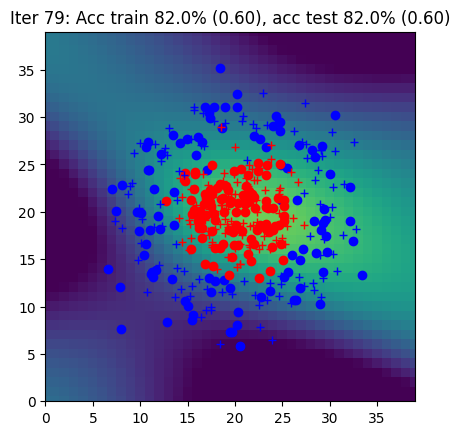

Iter 80: Acc train 84.0% (0.59), acc test 84.5% (0.60)


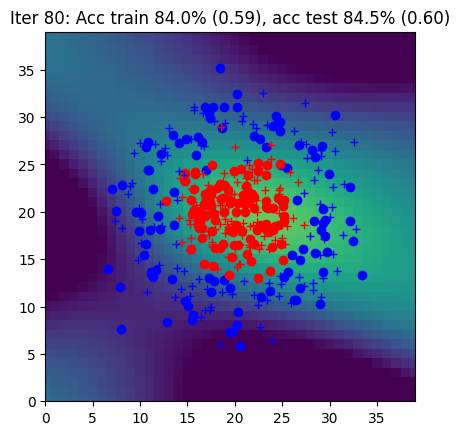

Iter 81: Acc train 83.5% (0.59), acc test 85.0% (0.59)


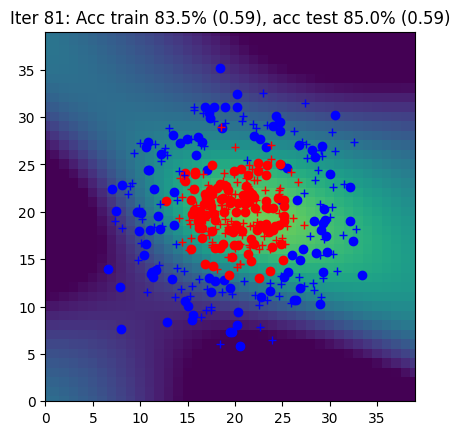

Iter 82: Acc train 83.5% (0.58), acc test 85.0% (0.59)


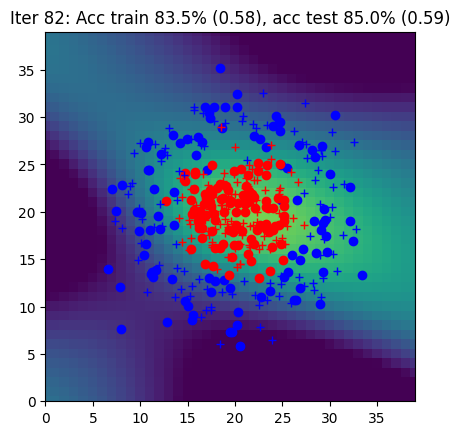

Iter 83: Acc train 84.0% (0.58), acc test 85.0% (0.58)


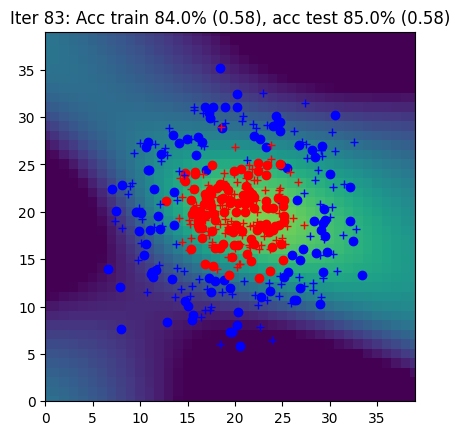

Iter 84: Acc train 84.0% (0.58), acc test 84.5% (0.58)


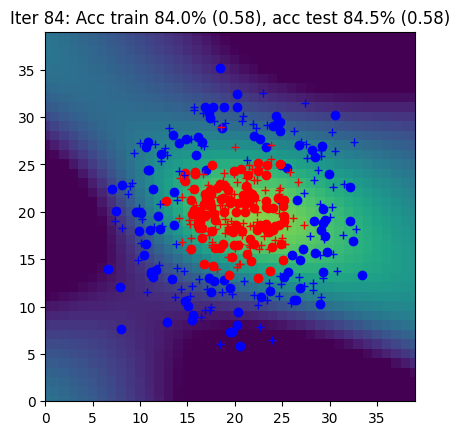

Iter 85: Acc train 84.5% (0.57), acc test 84.0% (0.57)


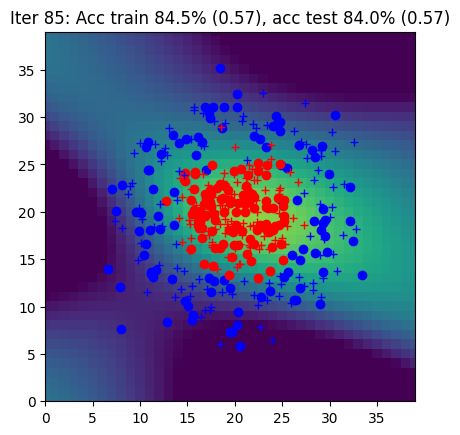

Iter 86: Acc train 84.0% (0.57), acc test 84.5% (0.57)


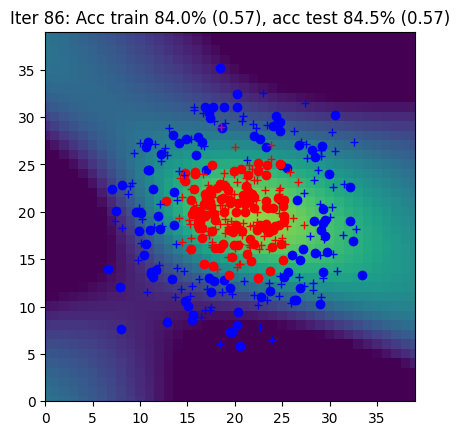

Iter 87: Acc train 84.5% (0.56), acc test 85.0% (0.57)


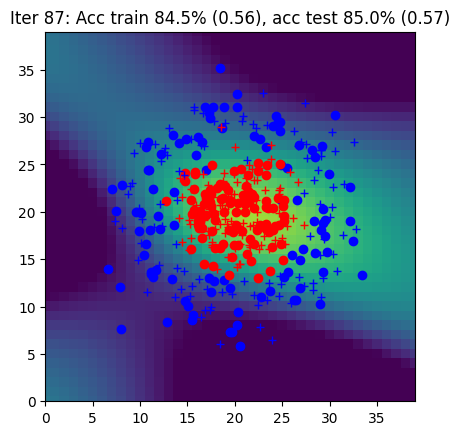

Iter 88: Acc train 84.5% (0.56), acc test 85.0% (0.56)


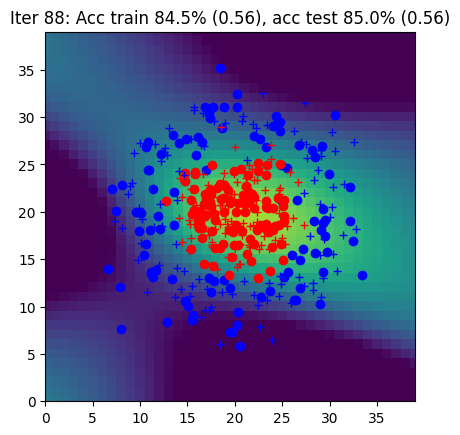

Iter 89: Acc train 84.5% (0.55), acc test 86.0% (0.56)


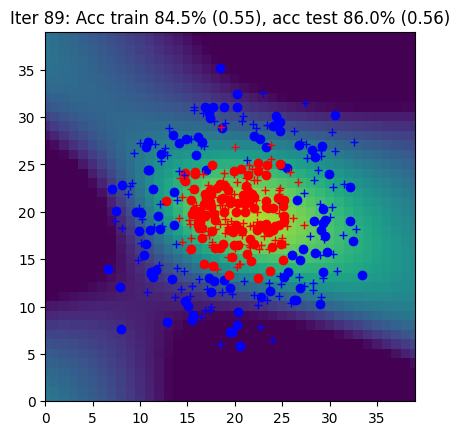

Iter 90: Acc train 84.5% (0.55), acc test 85.5% (0.55)


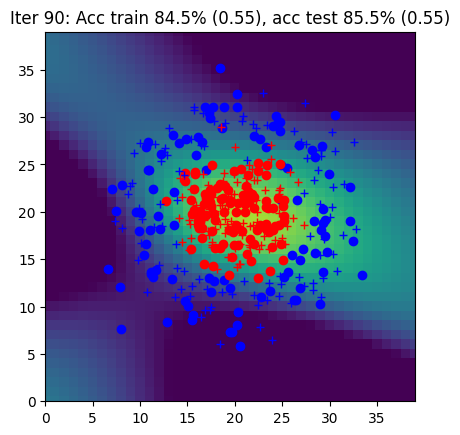

Iter 91: Acc train 84.5% (0.54), acc test 86.0% (0.55)


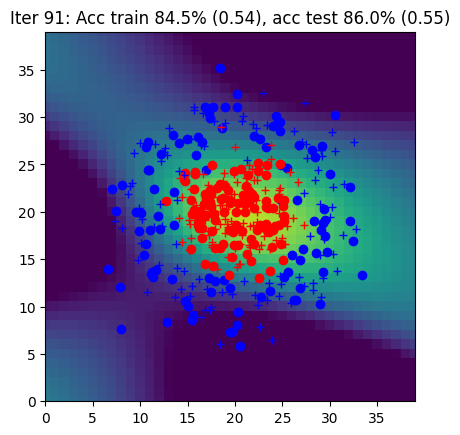

Iter 92: Acc train 84.5% (0.54), acc test 85.5% (0.54)


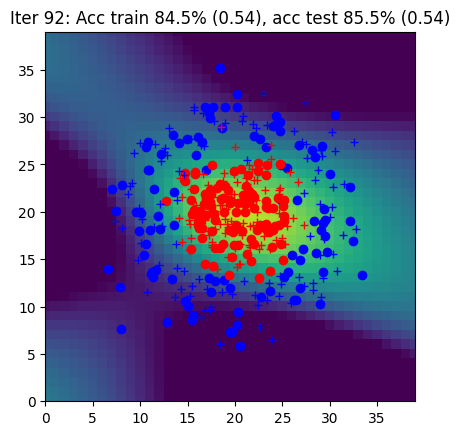

Iter 93: Acc train 84.5% (0.53), acc test 86.0% (0.54)


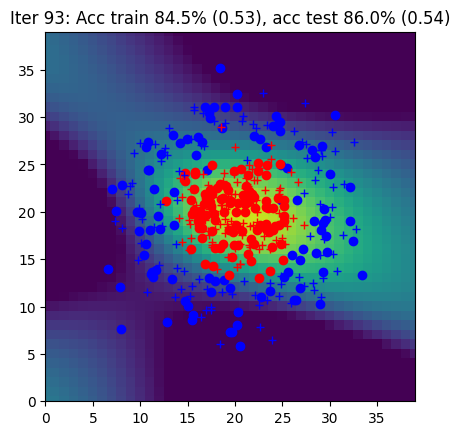

Iter 94: Acc train 84.5% (0.53), acc test 86.0% (0.53)


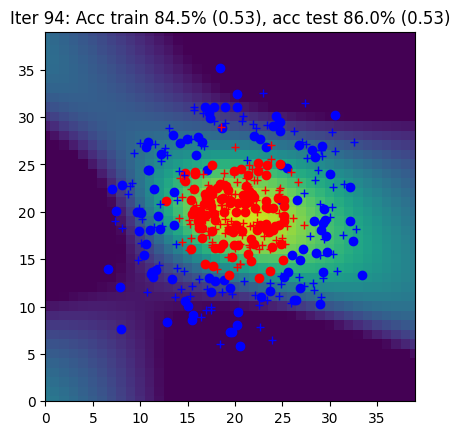

Iter 95: Acc train 85.0% (0.52), acc test 86.5% (0.53)


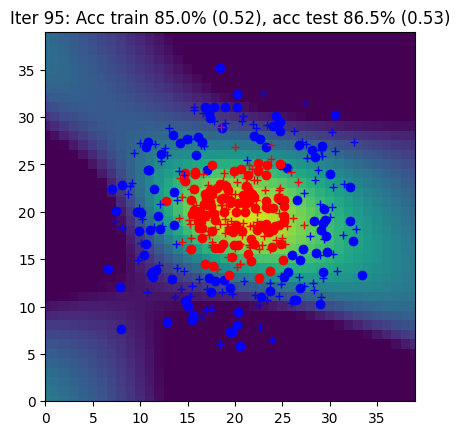

Iter 96: Acc train 85.0% (0.52), acc test 86.5% (0.52)


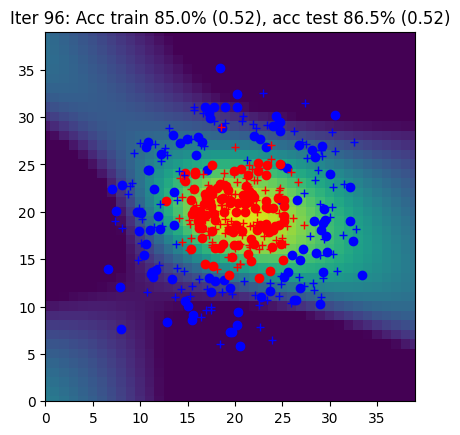

Iter 97: Acc train 86.5% (0.51), acc test 87.5% (0.52)


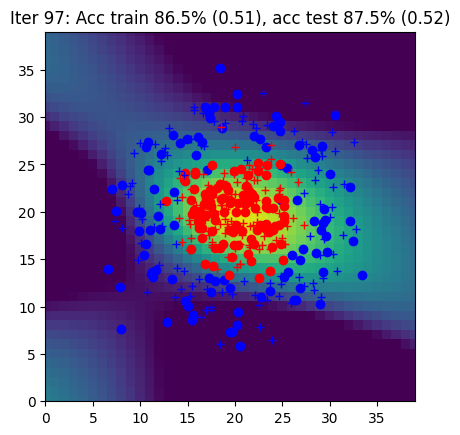

Iter 98: Acc train 86.5% (0.51), acc test 87.5% (0.51)


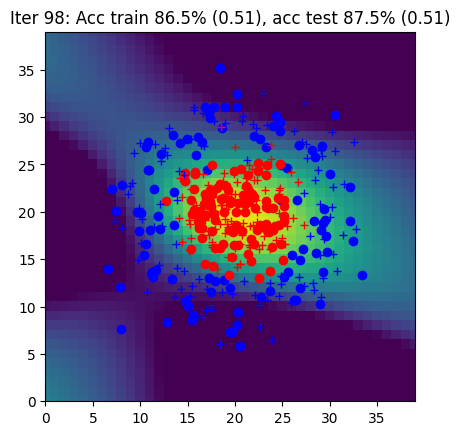

Iter 99: Acc train 86.0% (0.50), acc test 87.5% (0.51)


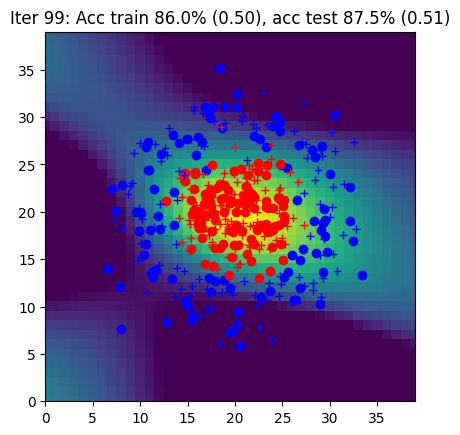

Iter 100: Acc train 86.0% (0.50), acc test 87.5% (0.50)


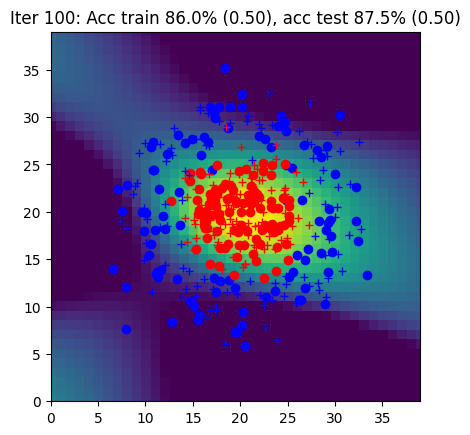

Iter 101: Acc train 86.5% (0.49), acc test 87.5% (0.50)


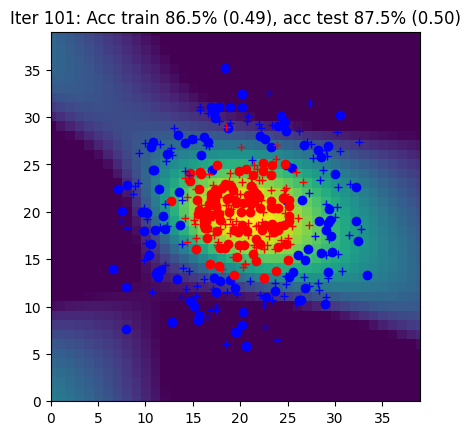

Iter 102: Acc train 85.0% (0.49), acc test 86.5% (0.49)


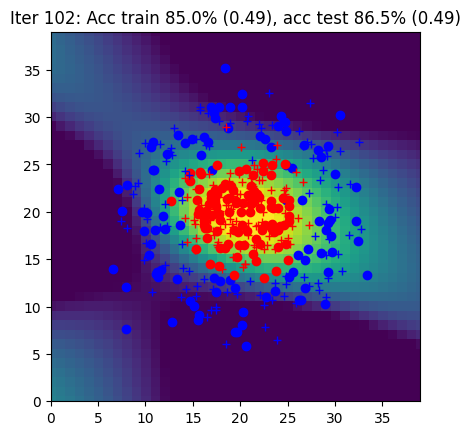

Iter 103: Acc train 85.5% (0.48), acc test 87.0% (0.48)


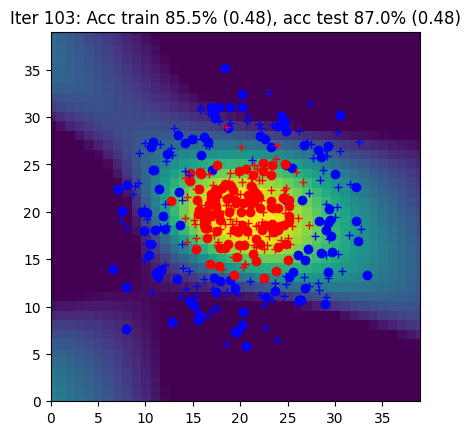

Iter 104: Acc train 86.5% (0.48), acc test 88.0% (0.48)


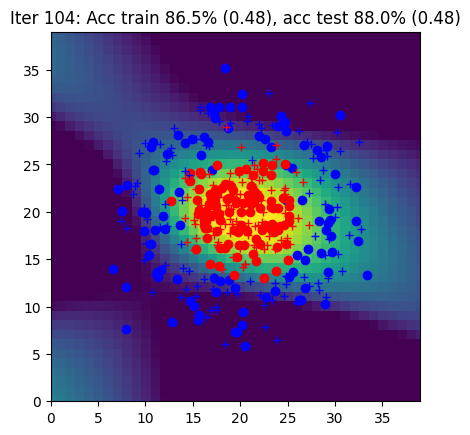

Iter 105: Acc train 88.0% (0.47), acc test 90.0% (0.47)


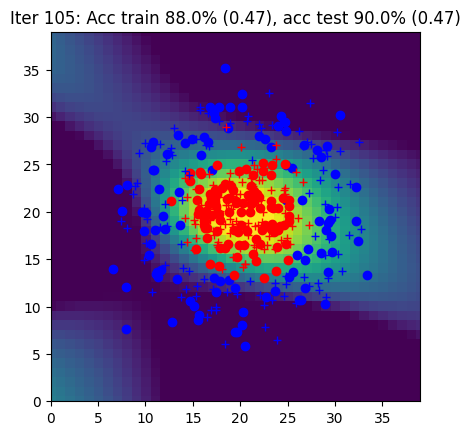

Iter 106: Acc train 88.0% (0.47), acc test 89.5% (0.47)


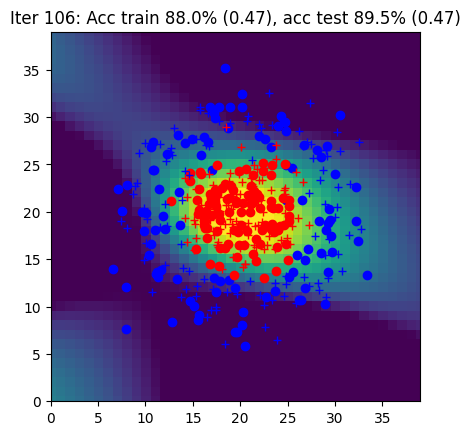

Iter 107: Acc train 88.5% (0.46), acc test 89.5% (0.46)


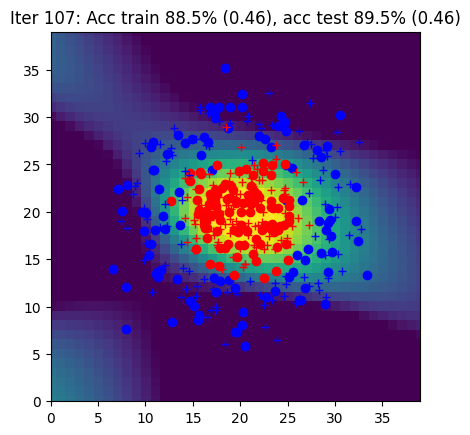

Iter 108: Acc train 88.5% (0.46), acc test 89.0% (0.46)


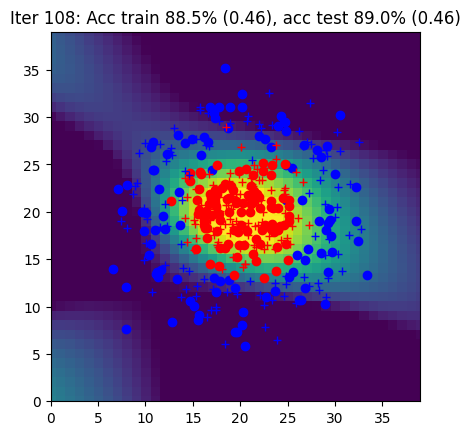

Iter 109: Acc train 88.5% (0.45), acc test 90.5% (0.45)


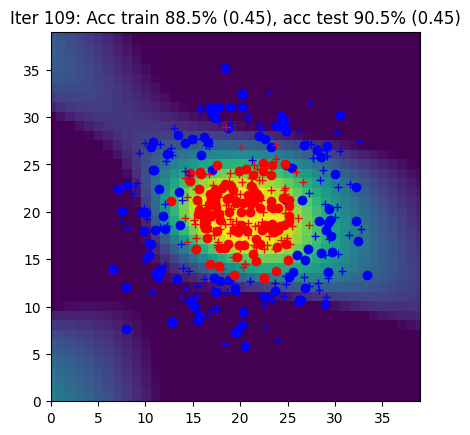

Iter 110: Acc train 88.5% (0.45), acc test 92.0% (0.45)


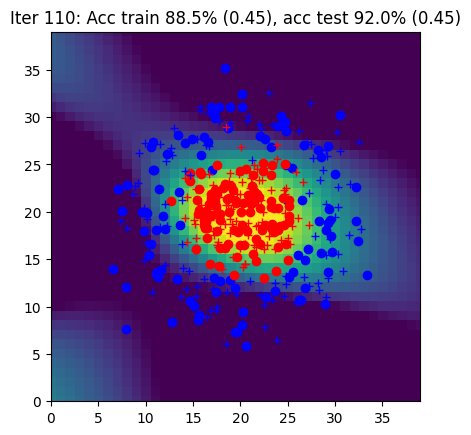

Iter 111: Acc train 88.5% (0.44), acc test 92.0% (0.44)


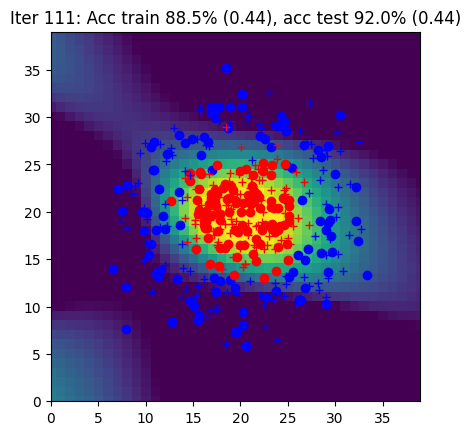

Iter 112: Acc train 88.5% (0.44), acc test 92.0% (0.44)


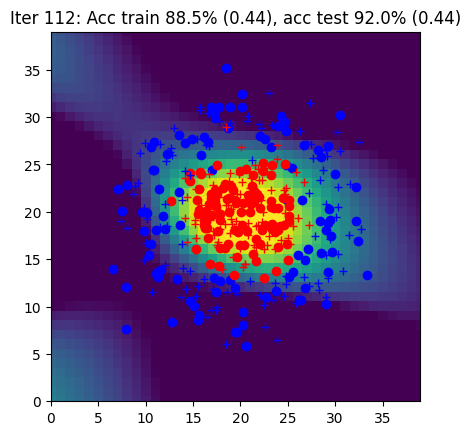

Iter 113: Acc train 88.5% (0.43), acc test 91.5% (0.43)


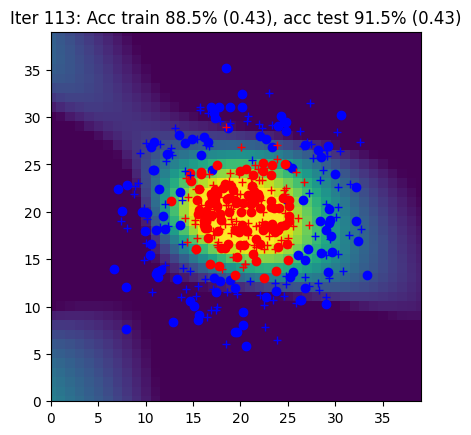

Iter 114: Acc train 89.0% (0.42), acc test 92.5% (0.43)


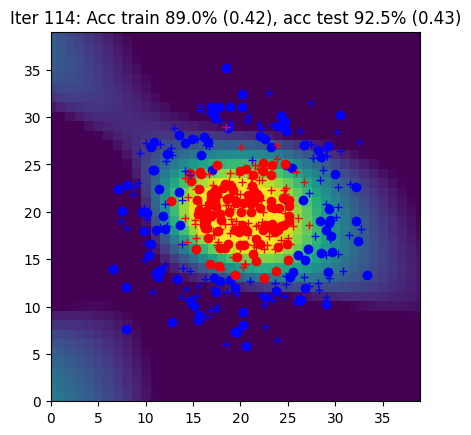

Iter 115: Acc train 89.5% (0.42), acc test 92.0% (0.42)


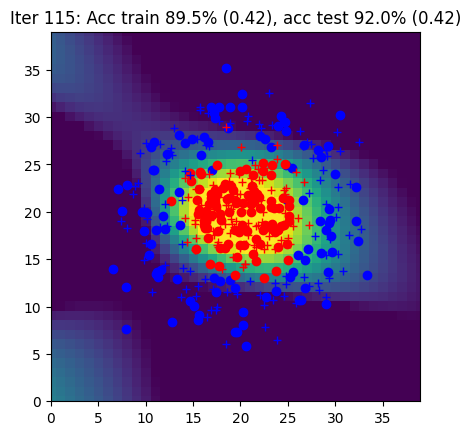

Iter 116: Acc train 89.5% (0.41), acc test 92.5% (0.42)


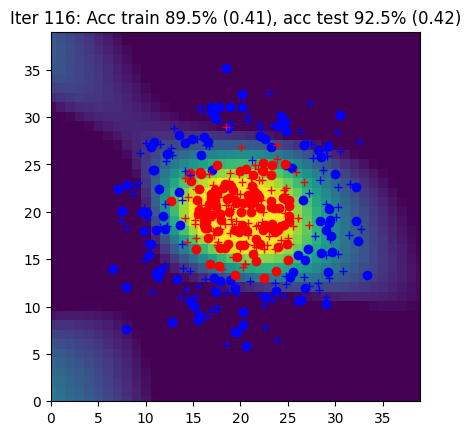

Iter 117: Acc train 90.5% (0.41), acc test 93.0% (0.41)


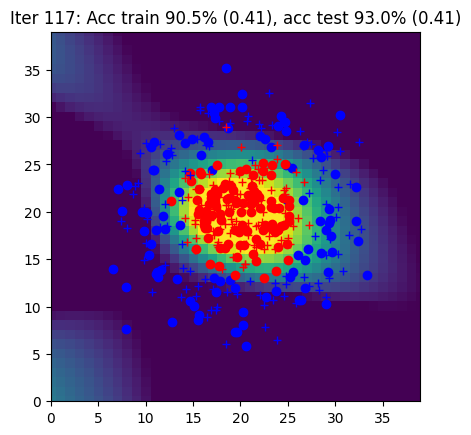

Iter 118: Acc train 91.5% (0.40), acc test 94.5% (0.41)


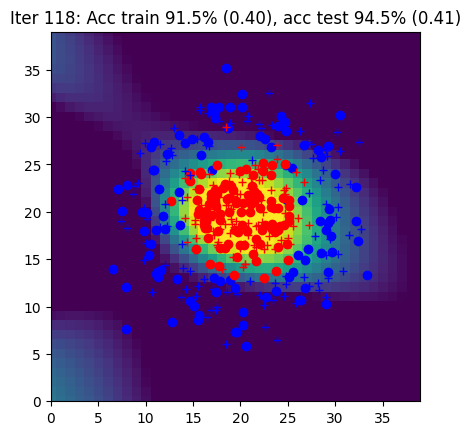

Iter 119: Acc train 91.0% (0.40), acc test 94.0% (0.40)


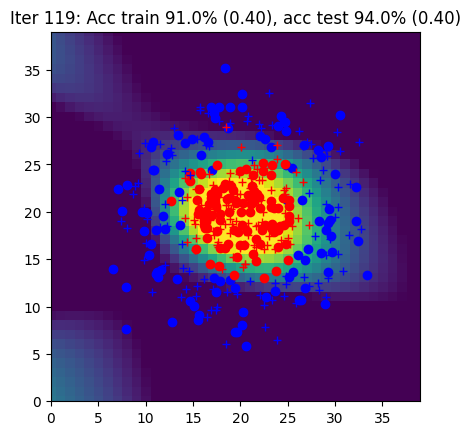

Iter 120: Acc train 91.5% (0.39), acc test 94.0% (0.39)


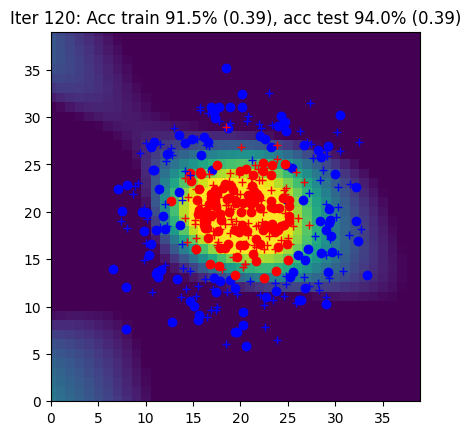

Iter 121: Acc train 92.0% (0.39), acc test 93.5% (0.39)


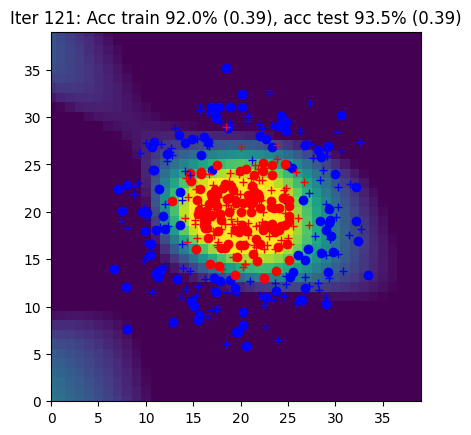

Iter 122: Acc train 92.5% (0.38), acc test 94.5% (0.38)


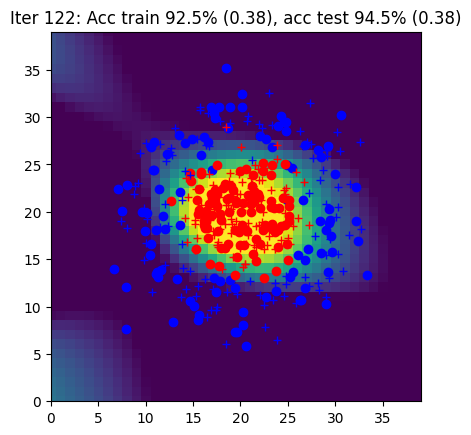

Iter 123: Acc train 92.5% (0.38), acc test 94.5% (0.38)


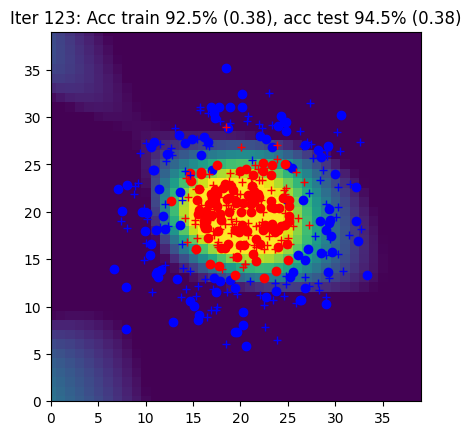

Iter 124: Acc train 92.5% (0.37), acc test 94.5% (0.38)


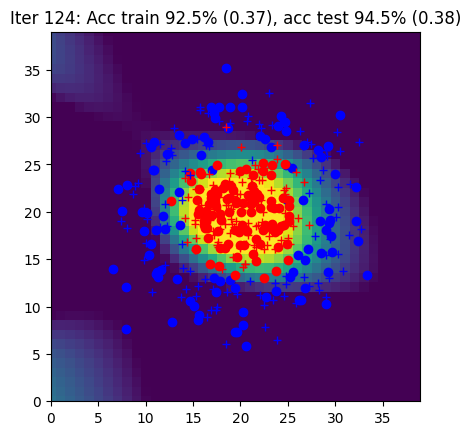

Iter 125: Acc train 92.5% (0.37), acc test 94.5% (0.37)


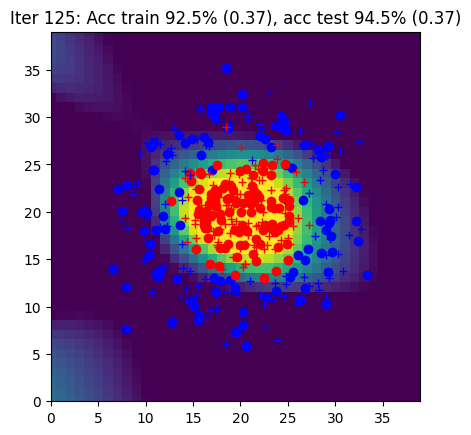

Iter 126: Acc train 93.0% (0.36), acc test 94.5% (0.37)


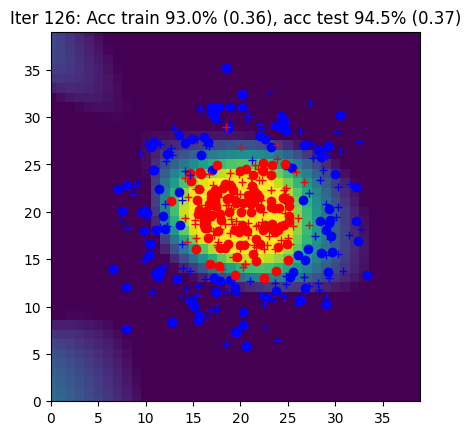

Iter 127: Acc train 93.5% (0.36), acc test 94.5% (0.36)


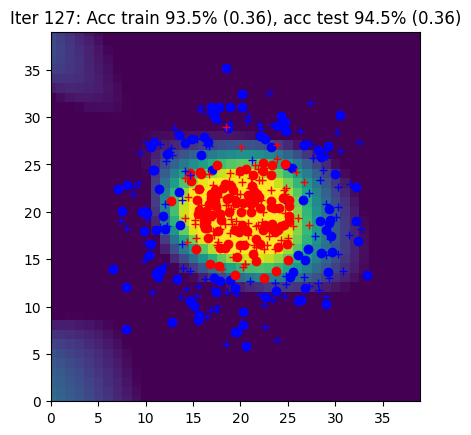

Iter 128: Acc train 93.0% (0.36), acc test 94.5% (0.36)


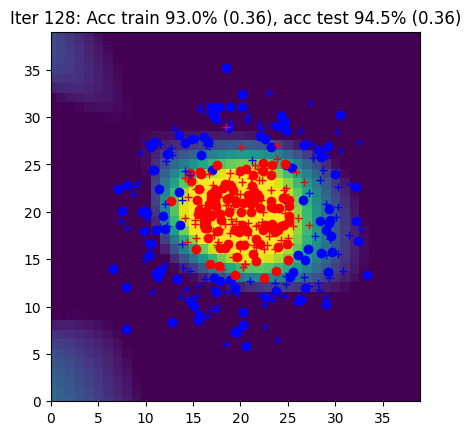

Iter 129: Acc train 93.5% (0.35), acc test 94.5% (0.35)


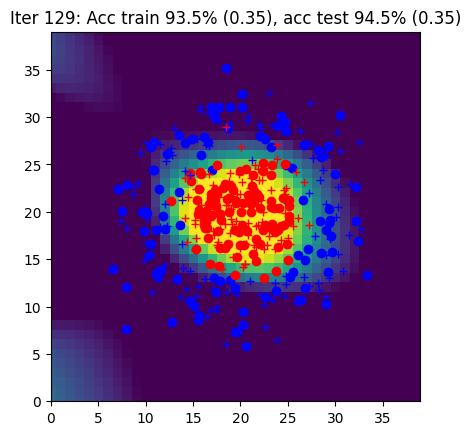

Iter 130: Acc train 93.5% (0.35), acc test 95.5% (0.35)


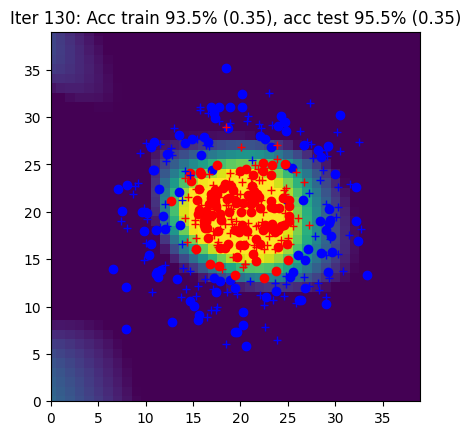

Iter 131: Acc train 94.5% (0.34), acc test 95.0% (0.34)


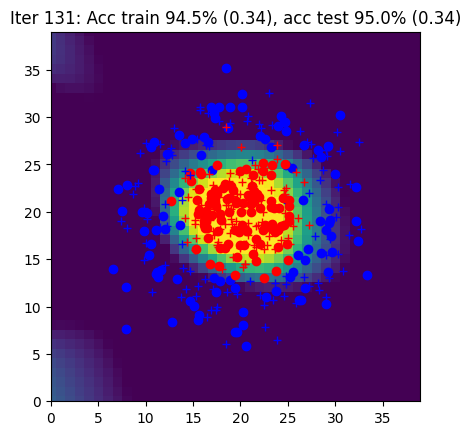

Iter 132: Acc train 94.5% (0.34), acc test 95.0% (0.34)


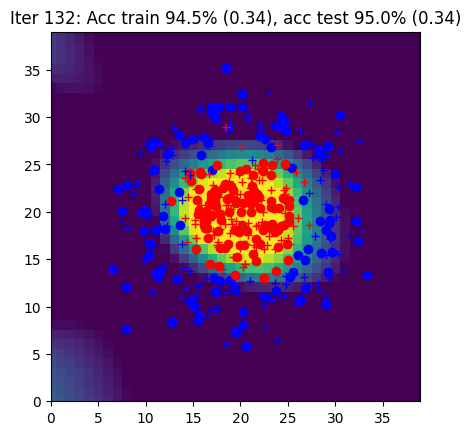

Iter 133: Acc train 94.5% (0.33), acc test 95.0% (0.34)


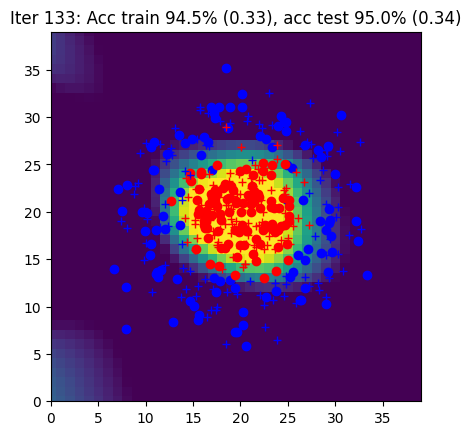

Iter 134: Acc train 95.0% (0.33), acc test 95.0% (0.33)


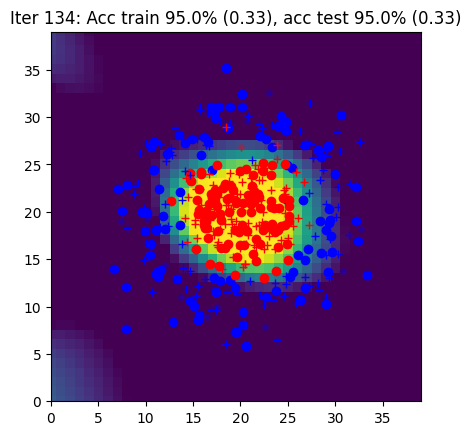

Iter 135: Acc train 95.0% (0.32), acc test 95.0% (0.33)


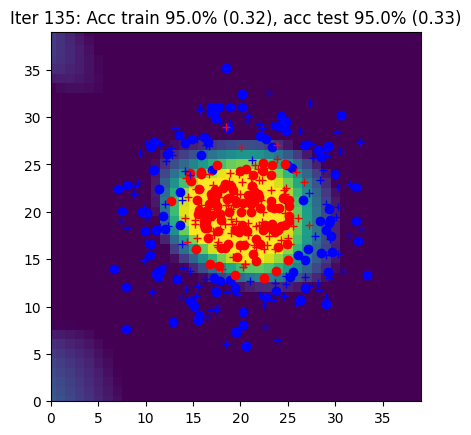

Iter 136: Acc train 95.0% (0.32), acc test 96.5% (0.32)


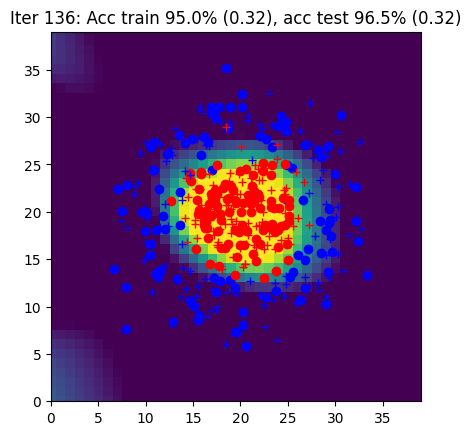

Iter 137: Acc train 95.0% (0.32), acc test 94.5% (0.32)


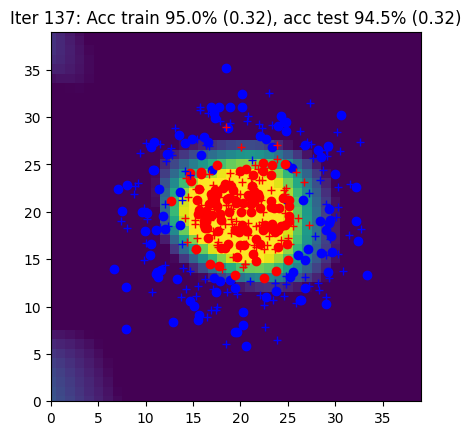

Iter 138: Acc train 95.5% (0.31), acc test 95.5% (0.31)


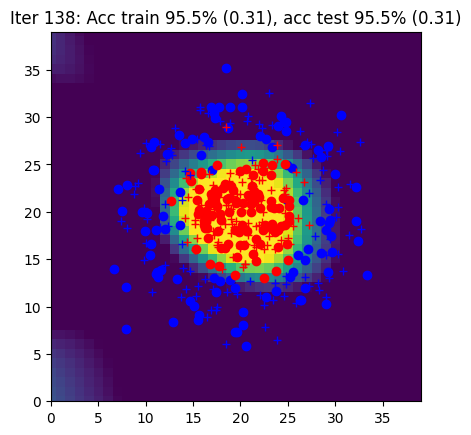

Iter 139: Acc train 95.0% (0.31), acc test 94.5% (0.31)


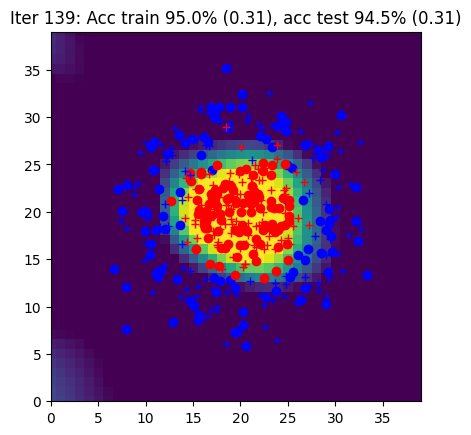

Iter 140: Acc train 94.5% (0.31), acc test 94.5% (0.31)


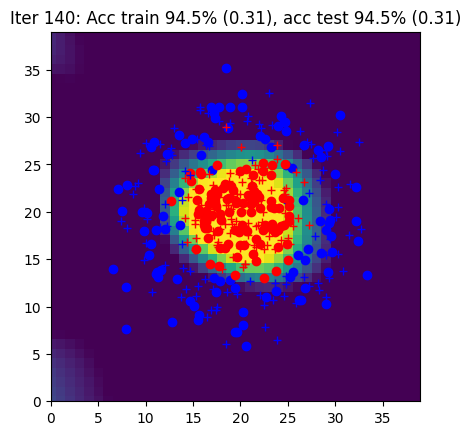

Iter 141: Acc train 95.0% (0.30), acc test 95.0% (0.30)


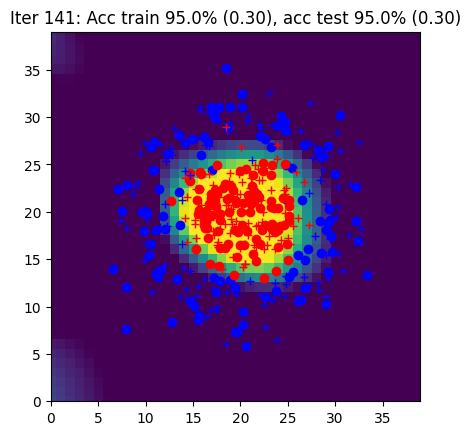

Iter 142: Acc train 95.0% (0.30), acc test 94.5% (0.30)


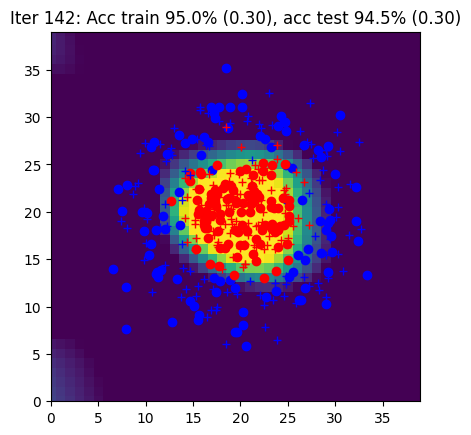

Iter 143: Acc train 95.5% (0.30), acc test 95.0% (0.30)


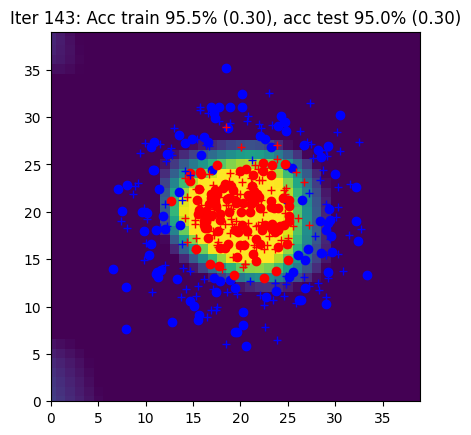

Iter 144: Acc train 95.5% (0.29), acc test 96.0% (0.29)


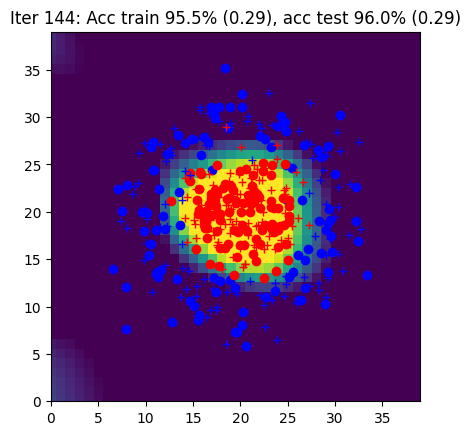

Iter 145: Acc train 95.0% (0.29), acc test 95.5% (0.29)


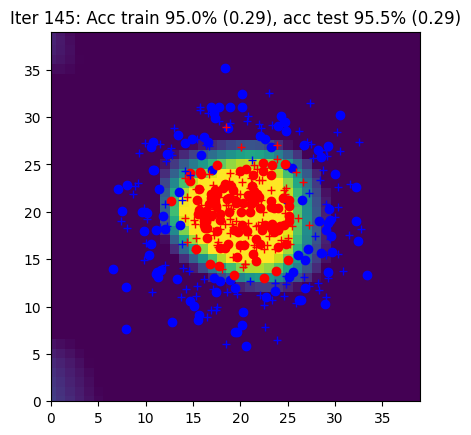

Iter 146: Acc train 95.5% (0.29), acc test 95.5% (0.29)


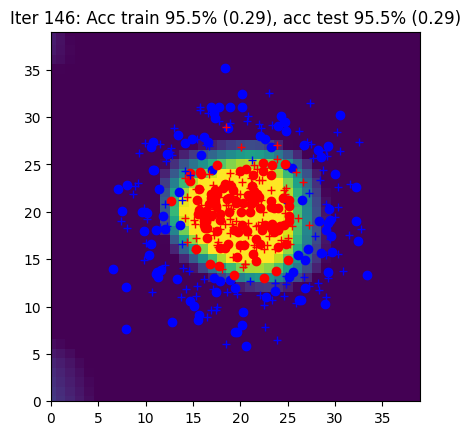

Iter 147: Acc train 95.5% (0.28), acc test 95.5% (0.28)


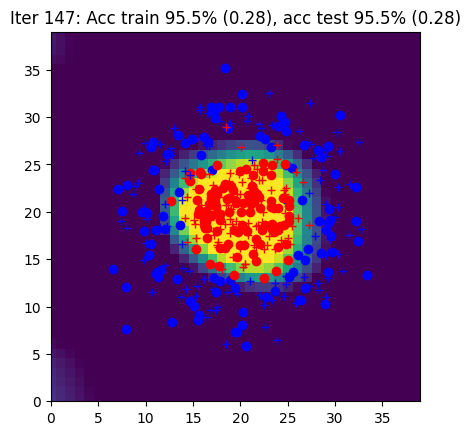

Iter 148: Acc train 95.5% (0.28), acc test 95.5% (0.28)


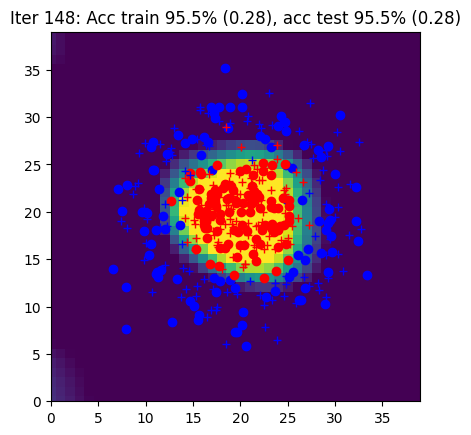

Iter 149: Acc train 95.5% (0.28), acc test 95.5% (0.28)


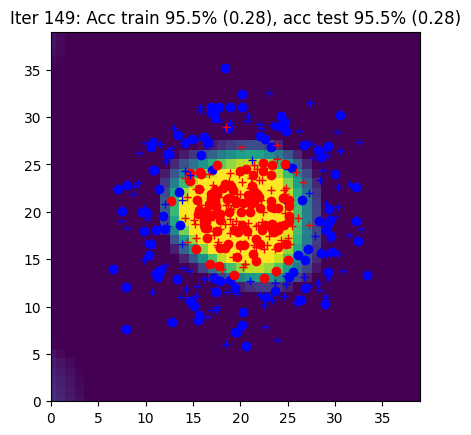

Iter 150: Acc train 95.5% (0.27), acc test 95.5% (0.28)


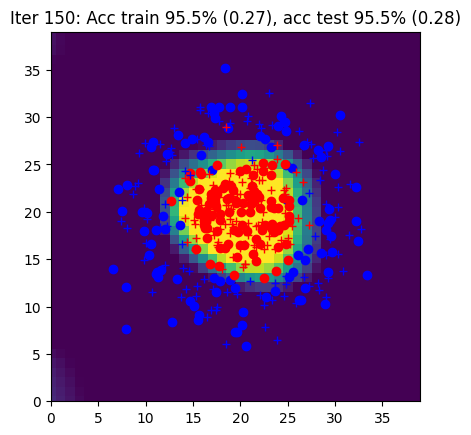

Iter 151: Acc train 96.0% (0.27), acc test 95.5% (0.27)


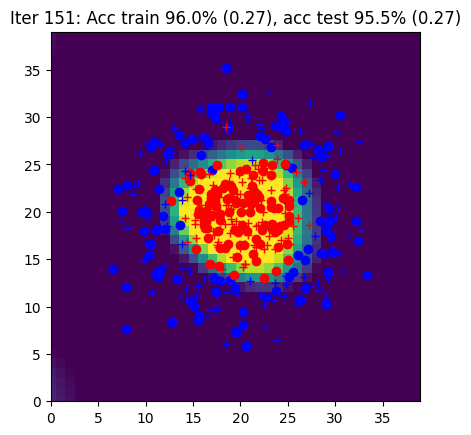

Iter 152: Acc train 96.0% (0.27), acc test 95.5% (0.27)


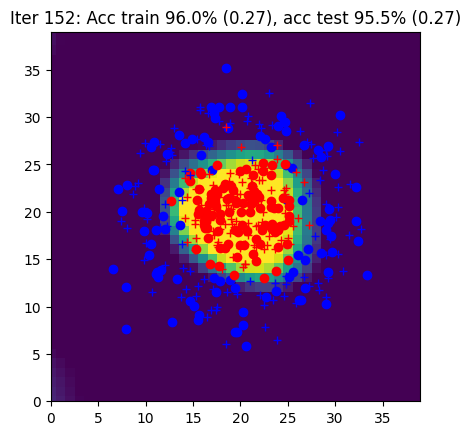

Iter 153: Acc train 95.5% (0.26), acc test 95.5% (0.27)


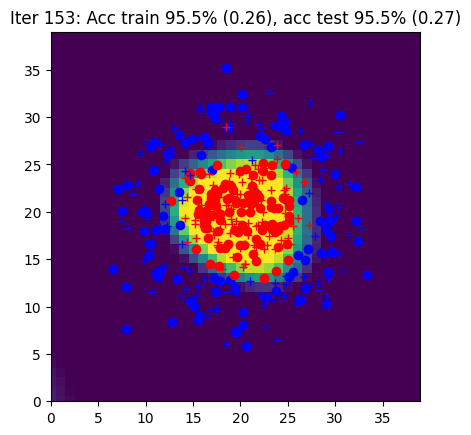

Iter 154: Acc train 96.0% (0.26), acc test 95.5% (0.27)


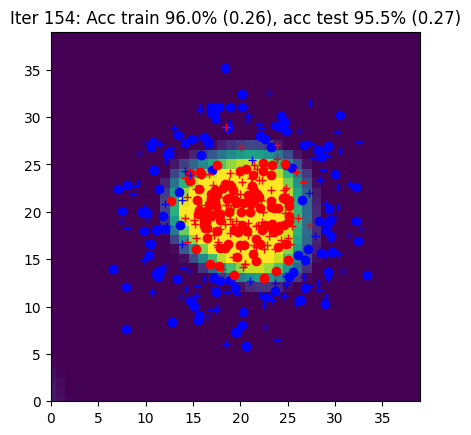

Iter 155: Acc train 96.5% (0.26), acc test 95.5% (0.26)


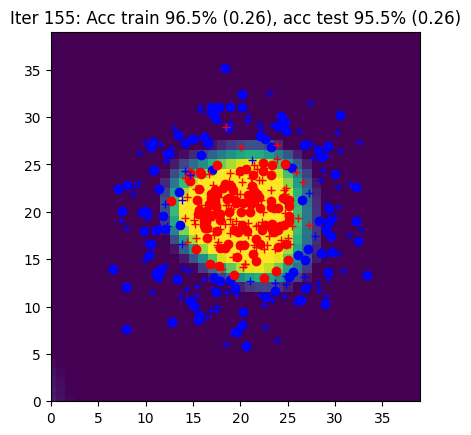

Iter 156: Acc train 96.5% (0.26), acc test 95.5% (0.26)


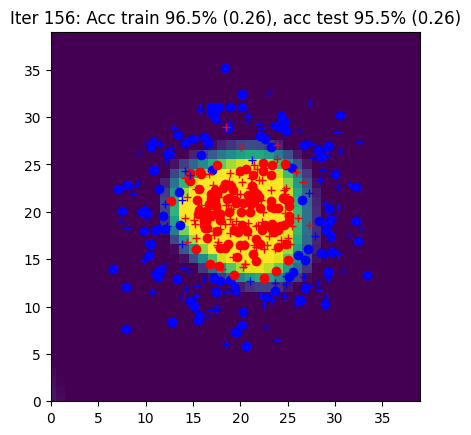

Iter 157: Acc train 97.0% (0.25), acc test 95.5% (0.26)


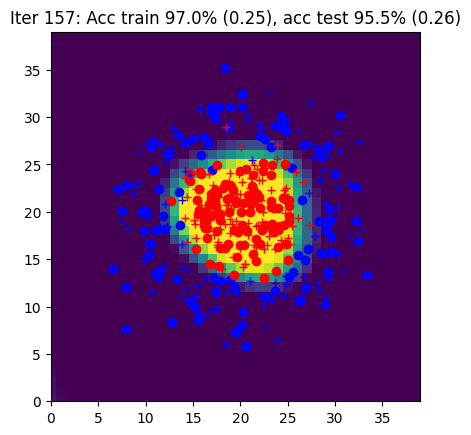

Iter 158: Acc train 97.0% (0.25), acc test 95.5% (0.26)


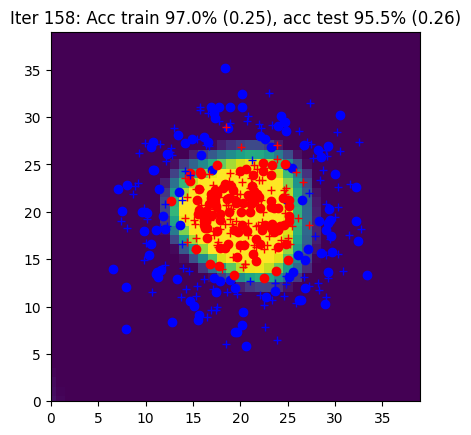

Iter 159: Acc train 97.0% (0.25), acc test 95.5% (0.25)


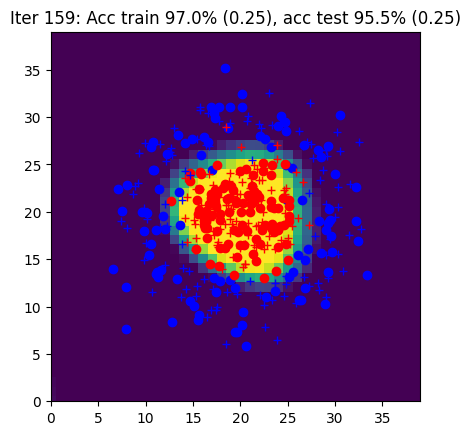

Iter 160: Acc train 96.5% (0.25), acc test 95.0% (0.25)


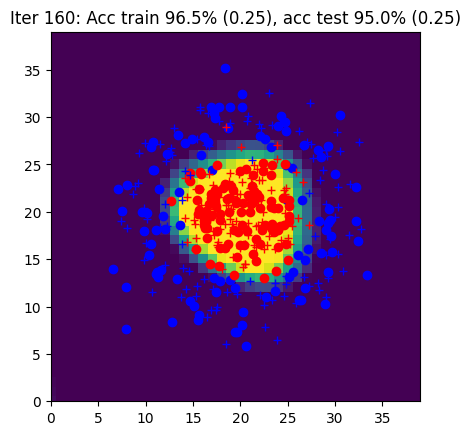

Iter 161: Acc train 96.5% (0.24), acc test 95.5% (0.25)


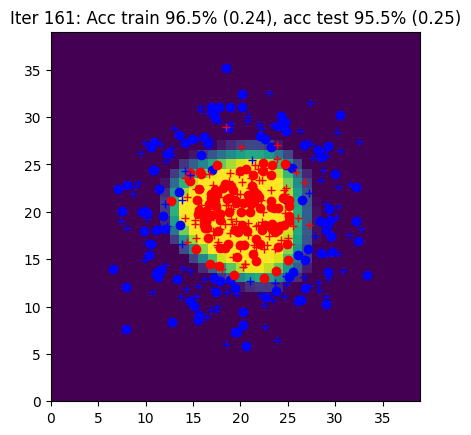

Iter 162: Acc train 97.0% (0.24), acc test 95.5% (0.25)


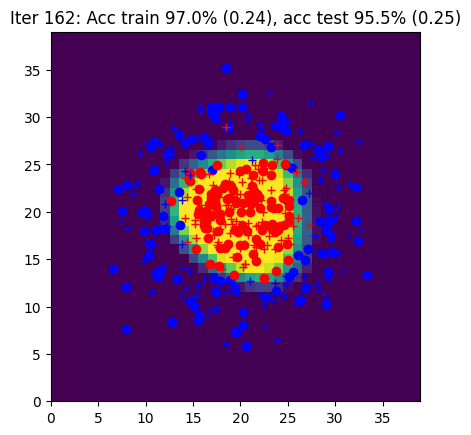

Iter 163: Acc train 96.5% (0.24), acc test 95.5% (0.25)


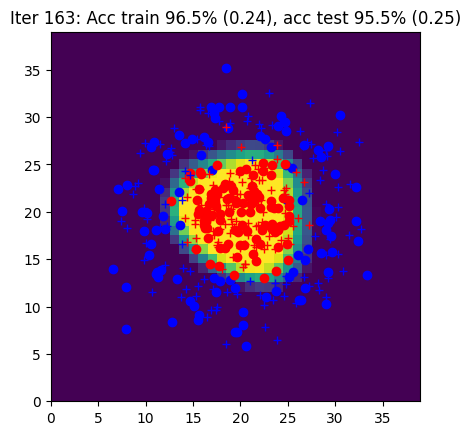

Iter 164: Acc train 96.5% (0.24), acc test 95.5% (0.24)


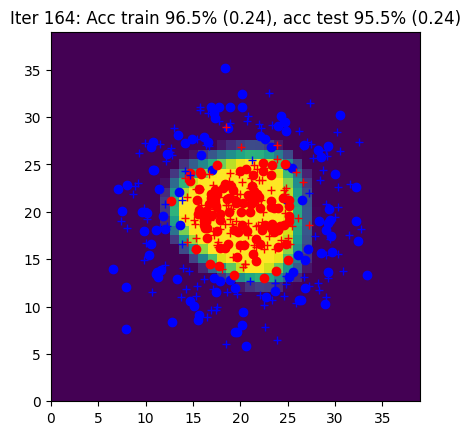

Iter 165: Acc train 97.0% (0.24), acc test 95.0% (0.24)


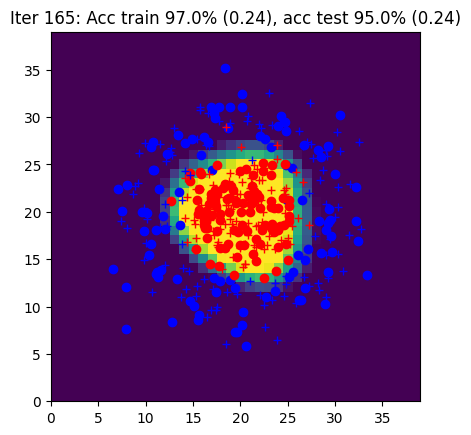

Iter 166: Acc train 97.0% (0.23), acc test 95.0% (0.24)


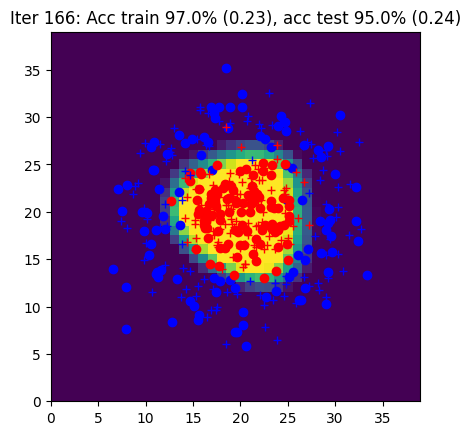

Iter 167: Acc train 97.0% (0.23), acc test 95.0% (0.24)


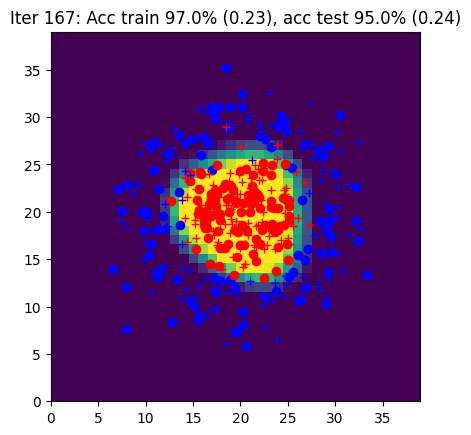

Iter 168: Acc train 96.5% (0.23), acc test 95.0% (0.24)


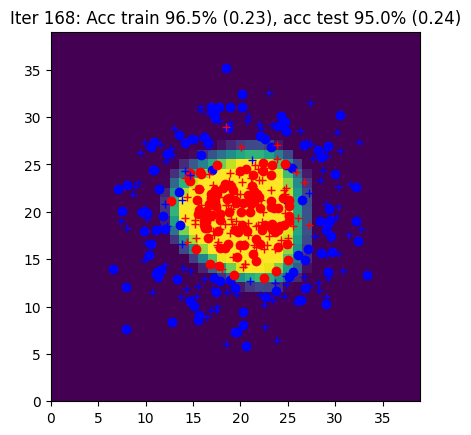

Iter 169: Acc train 96.5% (0.23), acc test 95.0% (0.24)


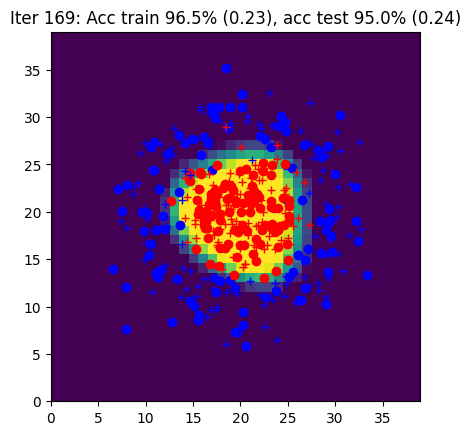

Iter 170: Acc train 96.5% (0.23), acc test 95.0% (0.23)


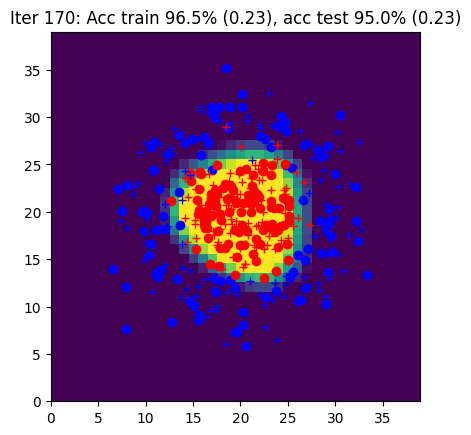

Iter 171: Acc train 97.0% (0.22), acc test 95.0% (0.23)


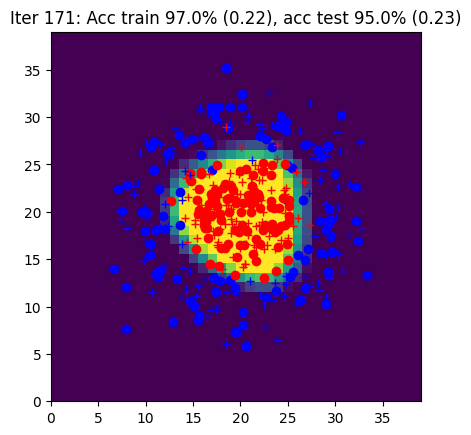

Iter 172: Acc train 97.0% (0.22), acc test 95.0% (0.23)


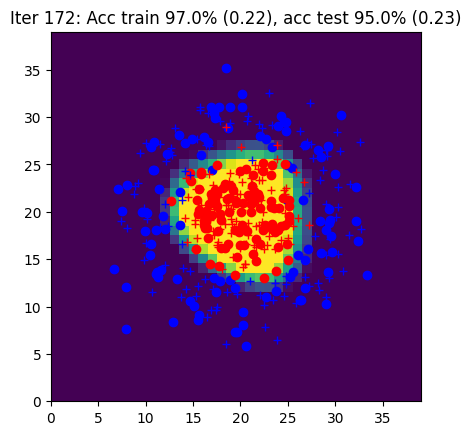

Iter 173: Acc train 97.0% (0.22), acc test 95.0% (0.23)


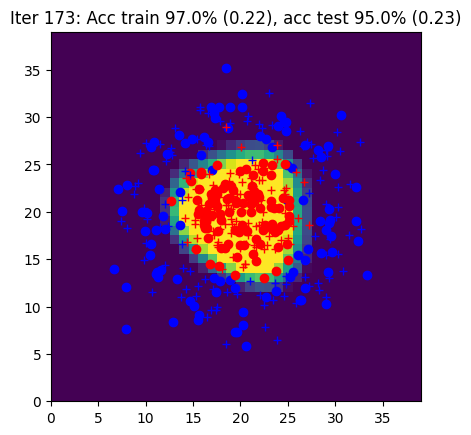

Iter 174: Acc train 97.0% (0.22), acc test 95.0% (0.23)


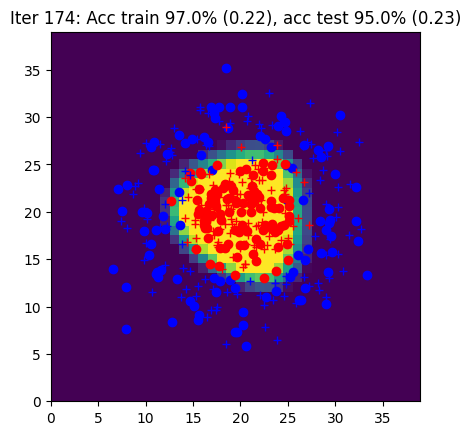

Iter 175: Acc train 97.0% (0.22), acc test 95.0% (0.23)


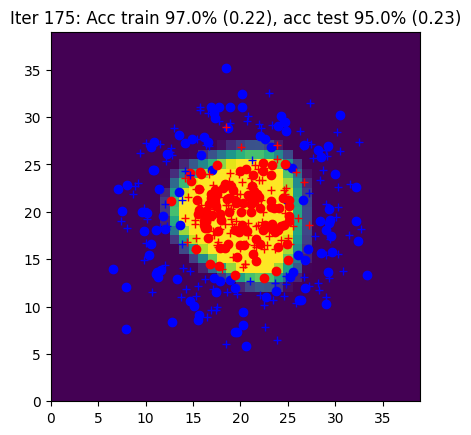

Iter 176: Acc train 97.0% (0.22), acc test 95.0% (0.22)


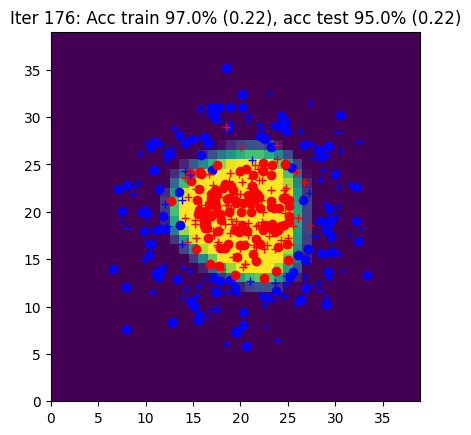

Iter 177: Acc train 96.0% (0.21), acc test 95.0% (0.22)


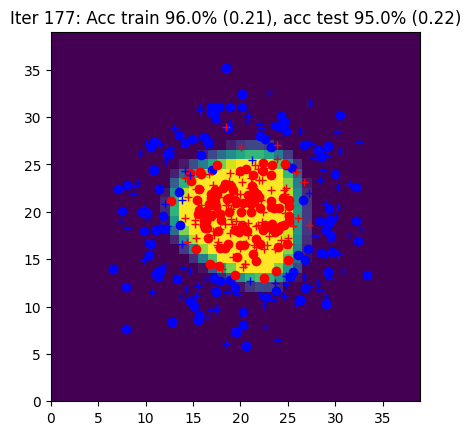

Iter 178: Acc train 96.0% (0.21), acc test 95.0% (0.22)


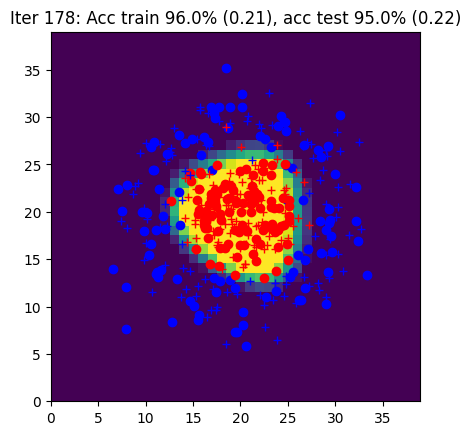

Iter 179: Acc train 95.5% (0.21), acc test 94.0% (0.22)


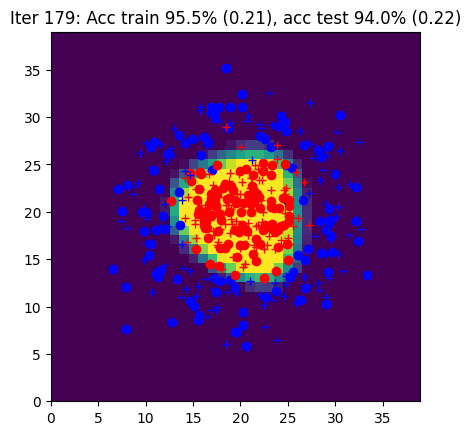

Iter 180: Acc train 96.0% (0.21), acc test 94.5% (0.22)


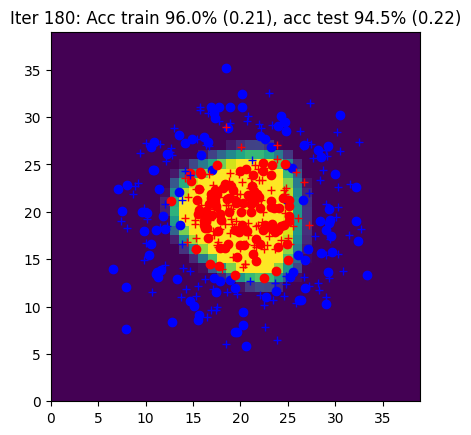

Iter 181: Acc train 96.0% (0.21), acc test 95.0% (0.22)


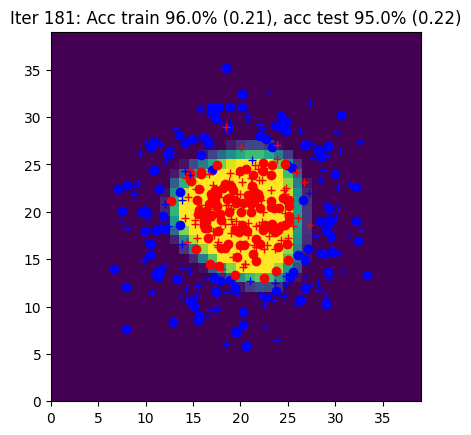

Iter 182: Acc train 96.0% (0.21), acc test 95.0% (0.22)


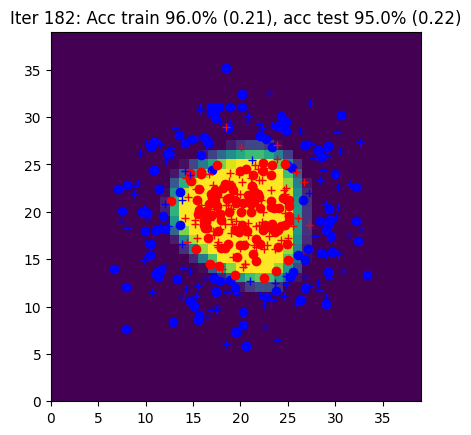

Iter 183: Acc train 96.0% (0.21), acc test 94.0% (0.22)


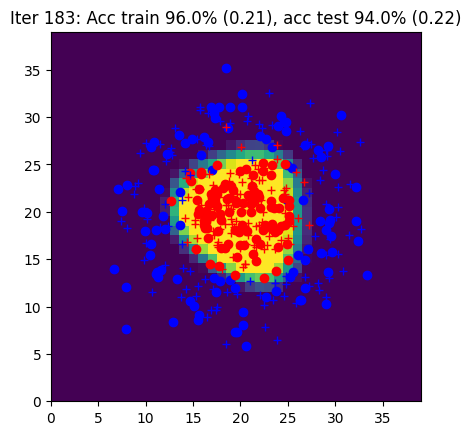

Iter 184: Acc train 97.0% (0.20), acc test 95.0% (0.21)


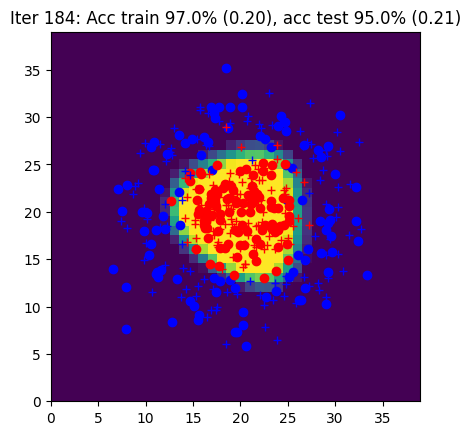

Iter 185: Acc train 96.0% (0.20), acc test 95.0% (0.21)


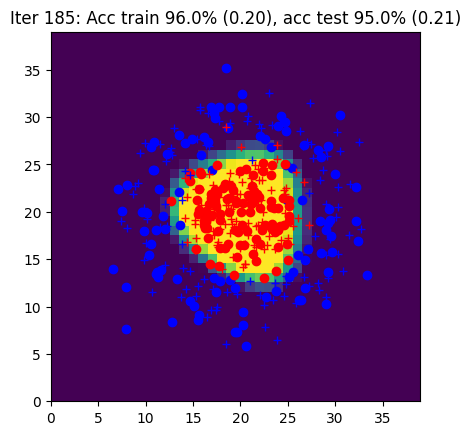

Iter 186: Acc train 96.0% (0.20), acc test 94.5% (0.21)


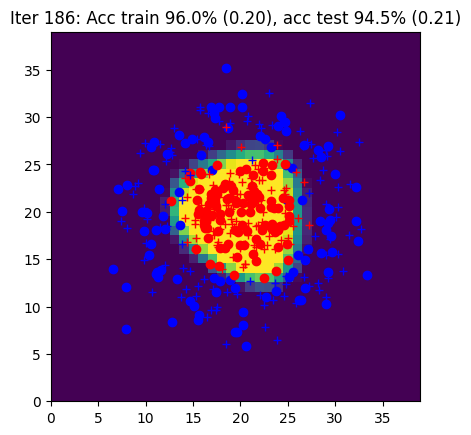

Iter 187: Acc train 96.0% (0.20), acc test 94.0% (0.21)


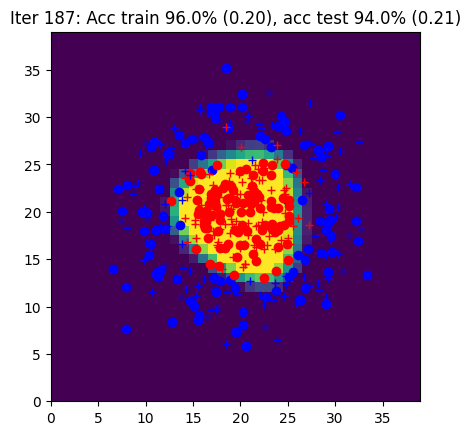

Iter 188: Acc train 96.0% (0.20), acc test 94.5% (0.21)


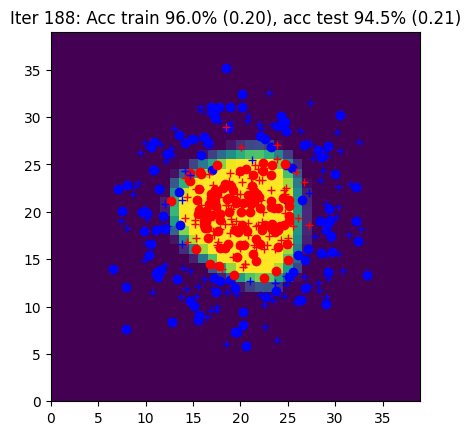

Iter 189: Acc train 97.0% (0.20), acc test 95.0% (0.21)


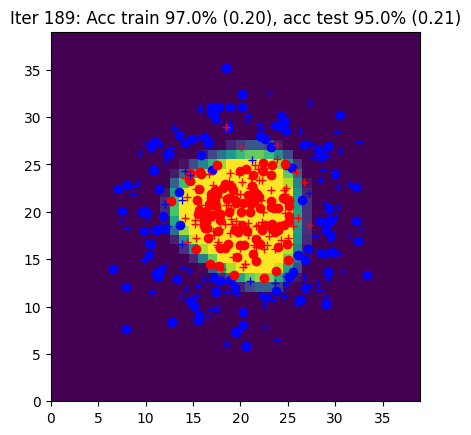

Iter 190: Acc train 96.0% (0.20), acc test 94.5% (0.21)


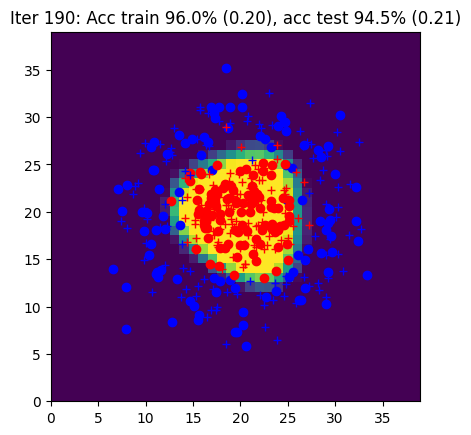

Iter 191: Acc train 96.0% (0.20), acc test 94.0% (0.21)


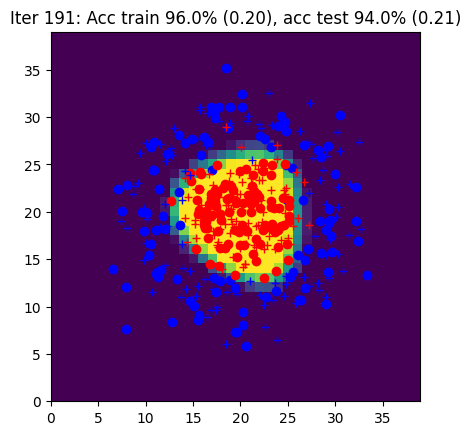

Iter 192: Acc train 96.0% (0.19), acc test 94.5% (0.21)


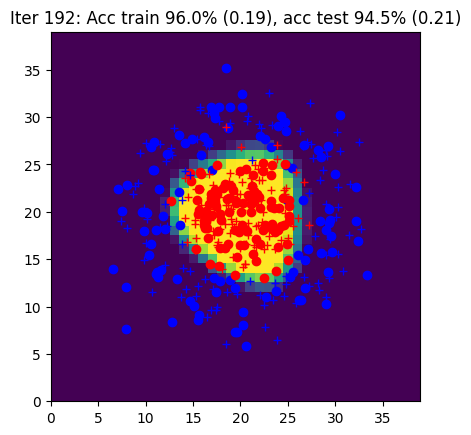

Iter 193: Acc train 96.5% (0.19), acc test 94.5% (0.20)


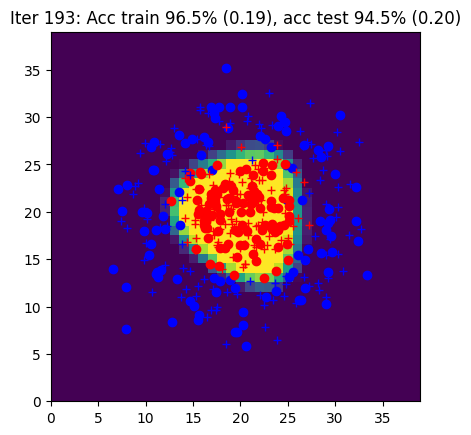

Iter 194: Acc train 96.0% (0.19), acc test 94.0% (0.20)


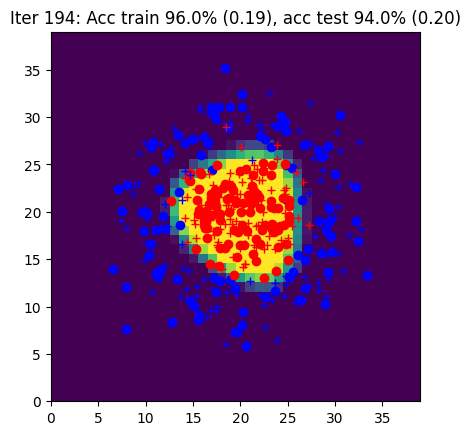

Iter 195: Acc train 96.5% (0.19), acc test 94.5% (0.20)


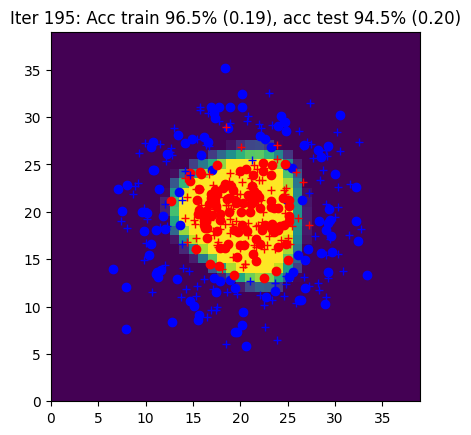

Iter 196: Acc train 96.0% (0.19), acc test 93.5% (0.20)


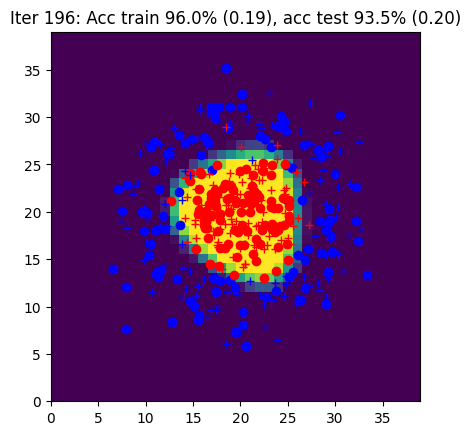

Iter 197: Acc train 96.0% (0.19), acc test 93.5% (0.20)


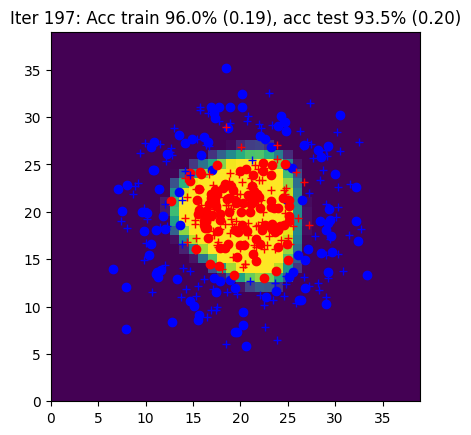

Iter 198: Acc train 96.0% (0.19), acc test 93.5% (0.20)


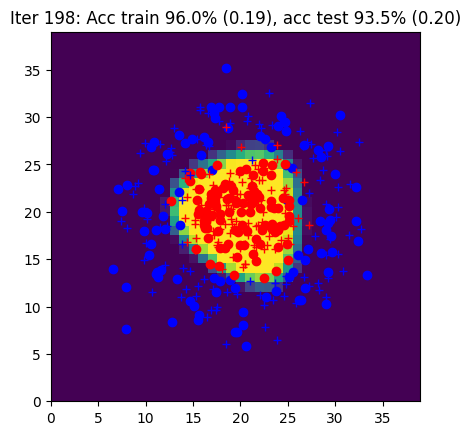

Iter 199: Acc train 96.0% (0.19), acc test 94.5% (0.20)


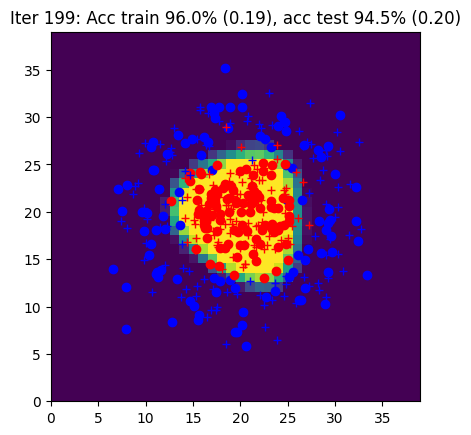

Iter 200: Acc train 96.0% (0.19), acc test 94.0% (0.20)


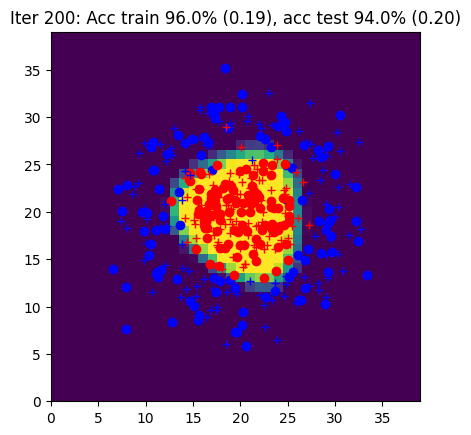

Iter 201: Acc train 96.0% (0.18), acc test 94.0% (0.20)


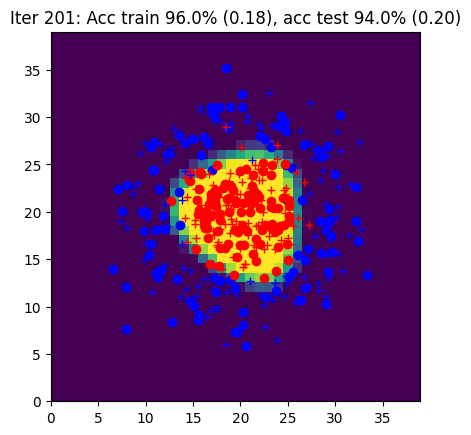

Iter 202: Acc train 96.0% (0.18), acc test 94.0% (0.20)


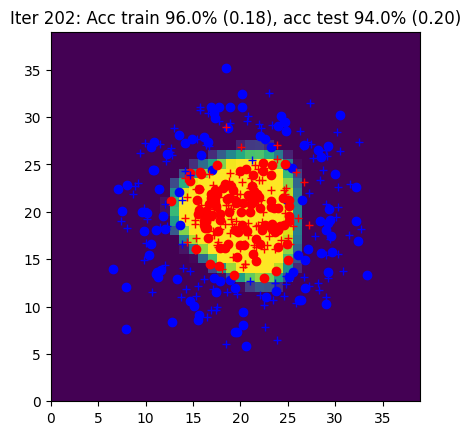

Iter 203: Acc train 96.0% (0.18), acc test 94.0% (0.20)


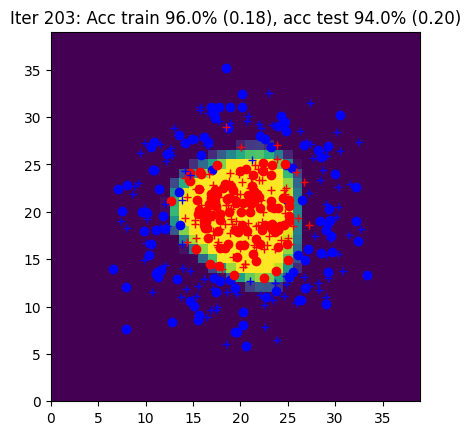

Iter 204: Acc train 96.5% (0.18), acc test 94.5% (0.20)


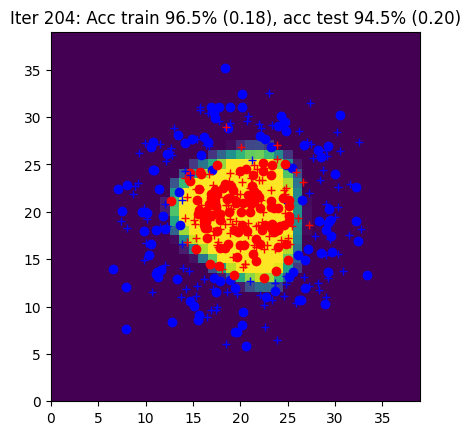

Iter 205: Acc train 96.5% (0.18), acc test 94.0% (0.19)


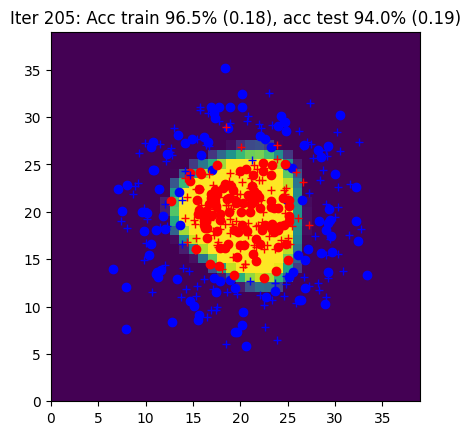

Iter 206: Acc train 96.0% (0.18), acc test 94.0% (0.19)


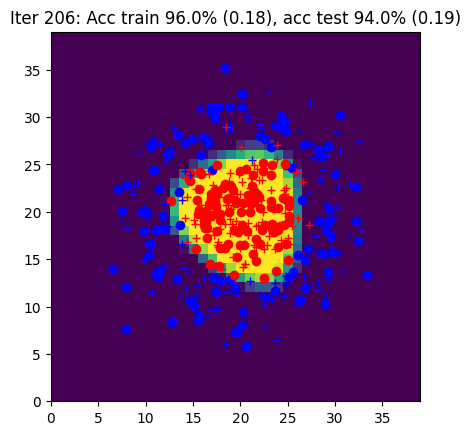

Iter 207: Acc train 96.0% (0.18), acc test 93.5% (0.19)


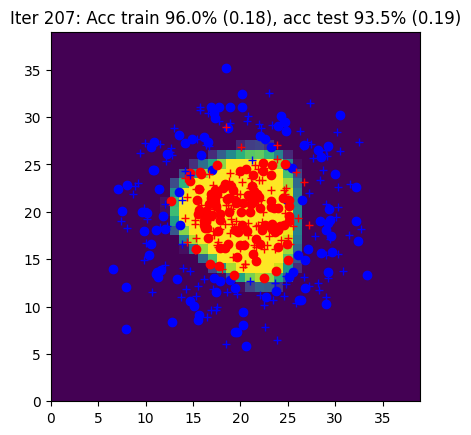

Iter 208: Acc train 96.0% (0.18), acc test 94.0% (0.19)


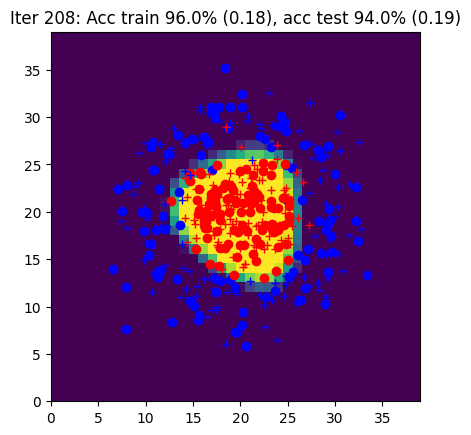

Iter 209: Acc train 96.5% (0.18), acc test 94.0% (0.19)


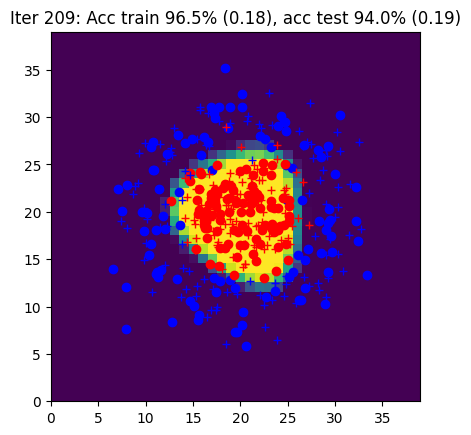

Iter 210: Acc train 96.5% (0.18), acc test 94.0% (0.19)


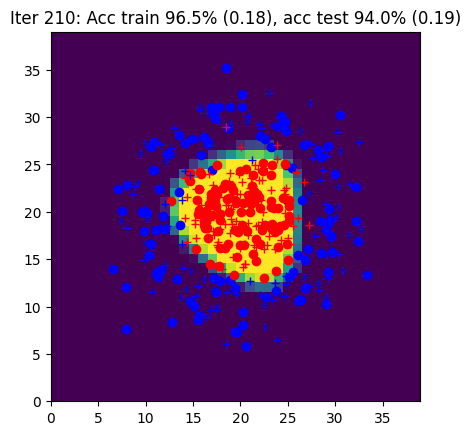

Iter 211: Acc train 96.0% (0.18), acc test 93.5% (0.19)


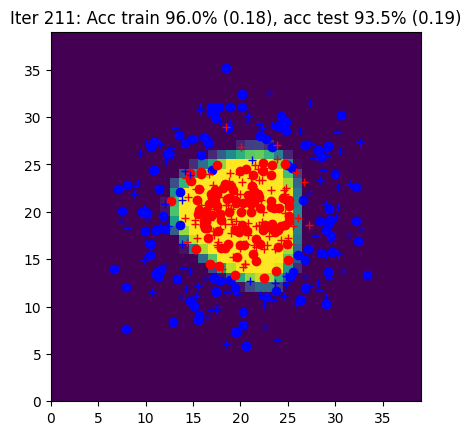

Iter 212: Acc train 96.0% (0.17), acc test 93.5% (0.19)


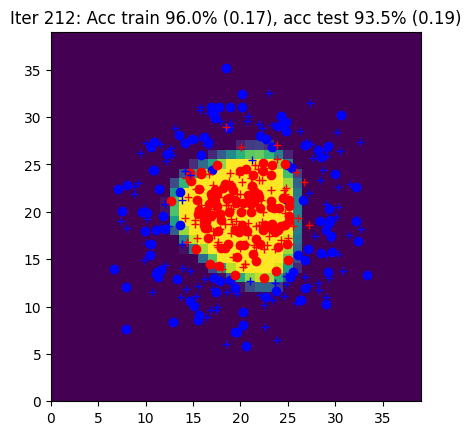

Iter 213: Acc train 96.0% (0.17), acc test 94.0% (0.19)


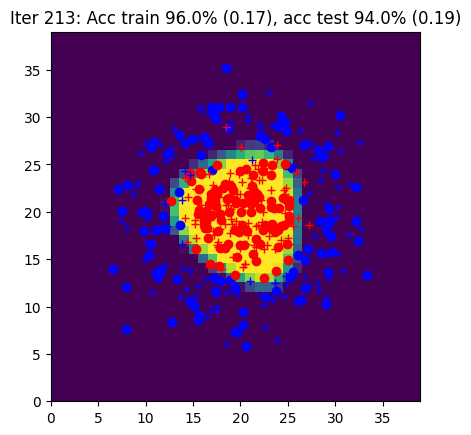

Iter 214: Acc train 96.5% (0.17), acc test 93.5% (0.19)


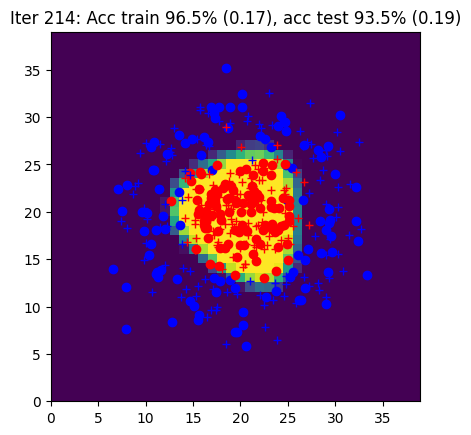

Iter 215: Acc train 96.0% (0.17), acc test 94.0% (0.19)


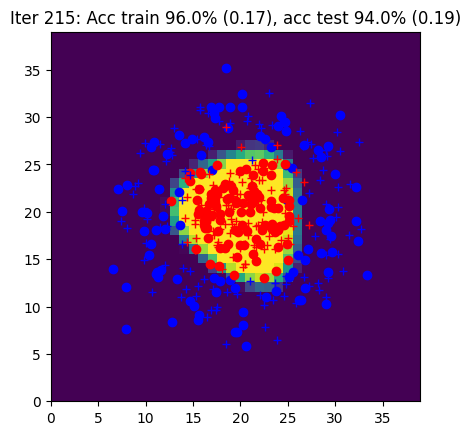

Iter 216: Acc train 96.5% (0.17), acc test 93.0% (0.19)


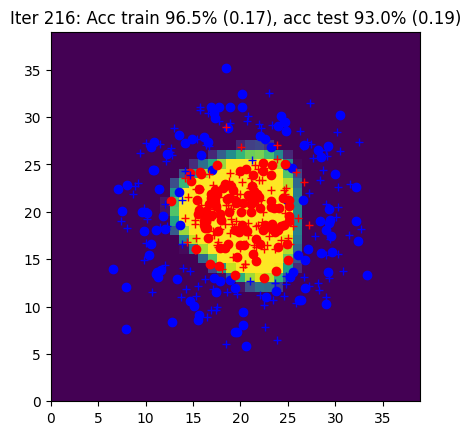

Iter 217: Acc train 96.0% (0.17), acc test 94.0% (0.19)


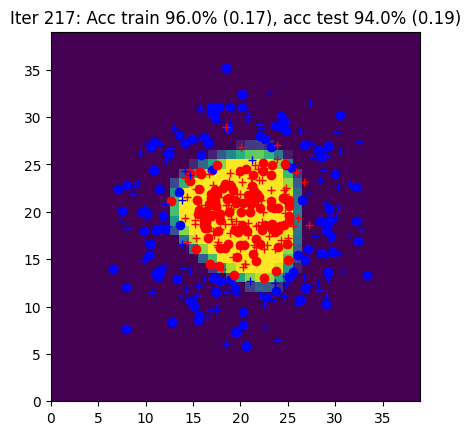

Iter 218: Acc train 96.5% (0.17), acc test 94.0% (0.19)


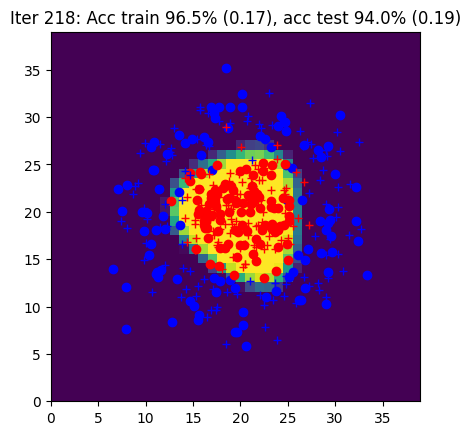

Iter 219: Acc train 96.0% (0.17), acc test 93.5% (0.19)


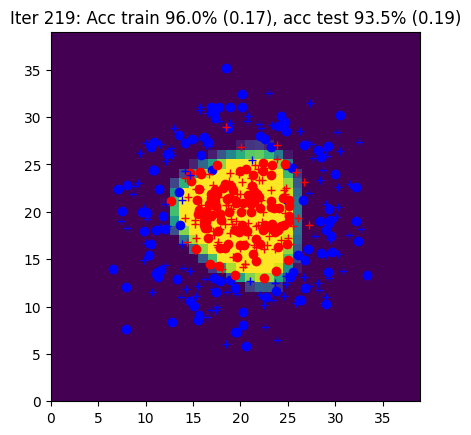

Iter 220: Acc train 96.0% (0.17), acc test 93.0% (0.19)


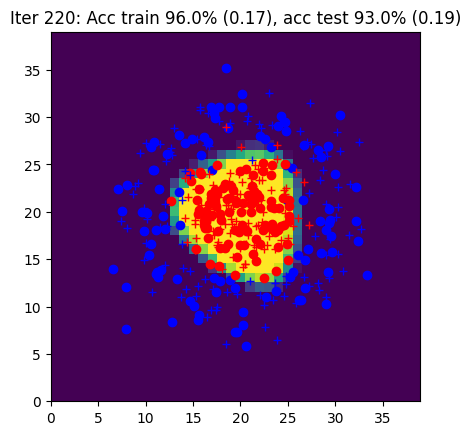

Iter 221: Acc train 96.0% (0.17), acc test 93.0% (0.19)


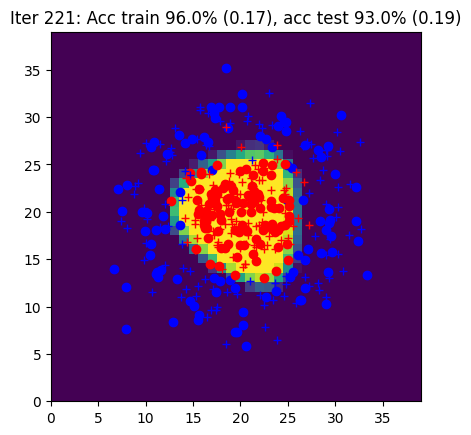

Iter 222: Acc train 96.5% (0.17), acc test 93.0% (0.19)


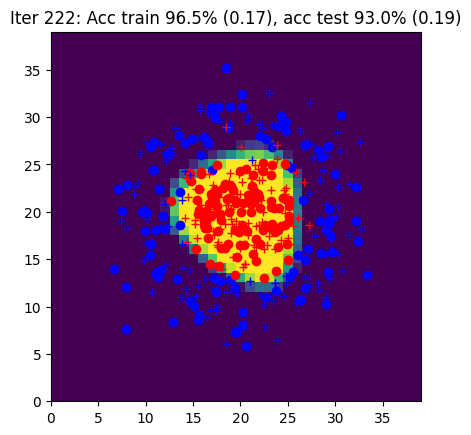

Iter 223: Acc train 96.5% (0.17), acc test 94.0% (0.19)


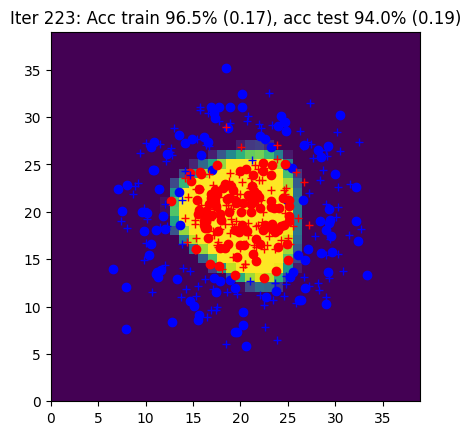

Iter 224: Acc train 96.5% (0.17), acc test 93.5% (0.18)


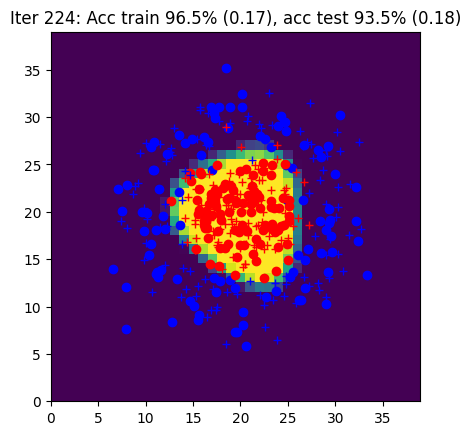

Iter 225: Acc train 96.0% (0.17), acc test 94.0% (0.18)


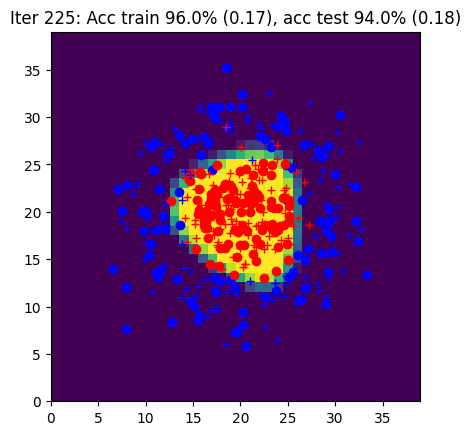

Iter 226: Acc train 96.5% (0.16), acc test 93.0% (0.18)


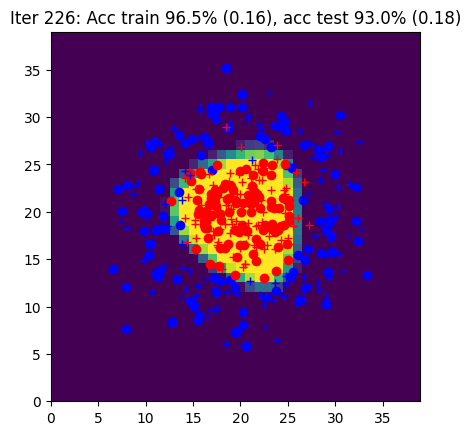

Iter 227: Acc train 96.5% (0.16), acc test 93.5% (0.18)


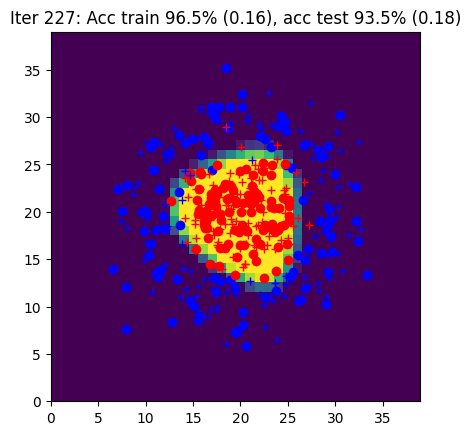

Iter 228: Acc train 96.5% (0.16), acc test 93.5% (0.18)


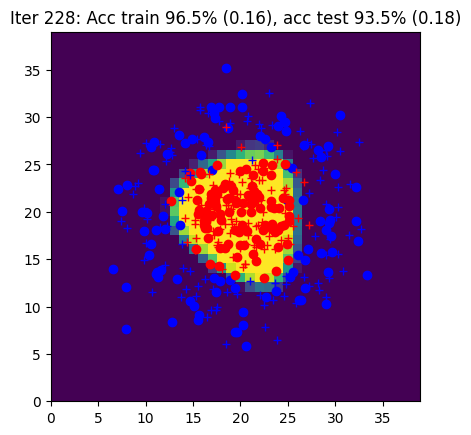

Iter 229: Acc train 96.5% (0.16), acc test 93.5% (0.18)


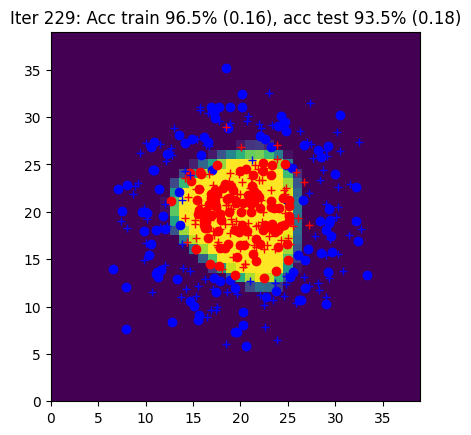

Iter 230: Acc train 96.5% (0.16), acc test 93.5% (0.18)


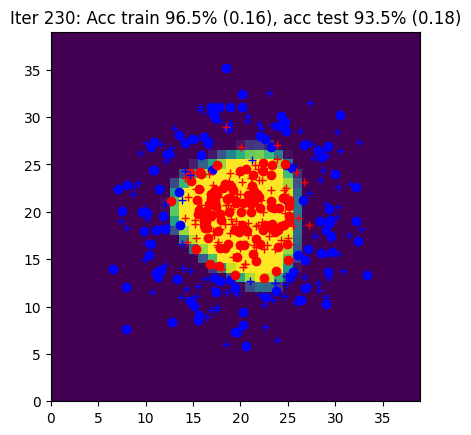

Iter 231: Acc train 96.5% (0.16), acc test 93.0% (0.18)


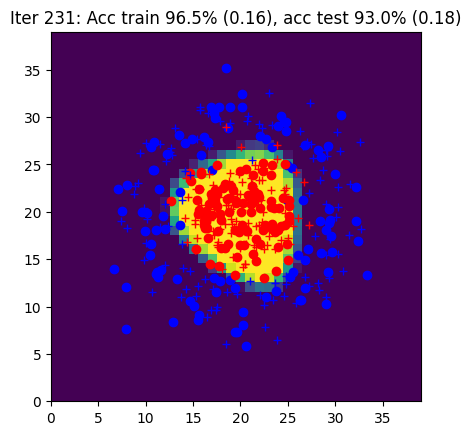

Iter 232: Acc train 96.5% (0.16), acc test 93.5% (0.18)


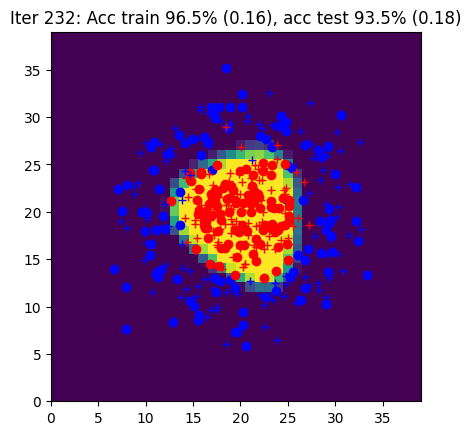

Iter 233: Acc train 96.5% (0.16), acc test 93.5% (0.18)


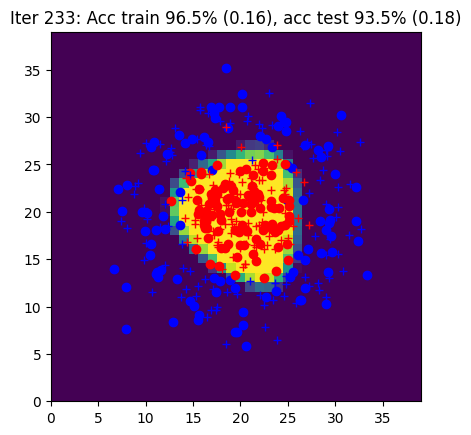

Iter 234: Acc train 96.5% (0.16), acc test 93.0% (0.18)


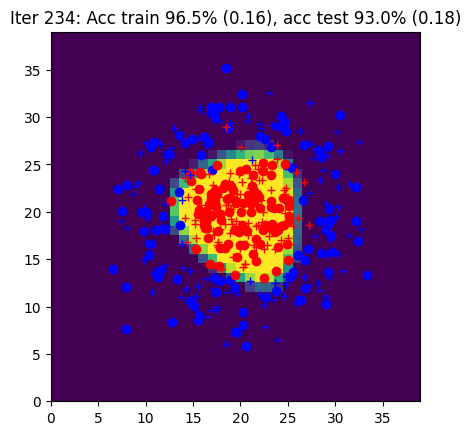

Iter 235: Acc train 96.5% (0.16), acc test 93.0% (0.18)


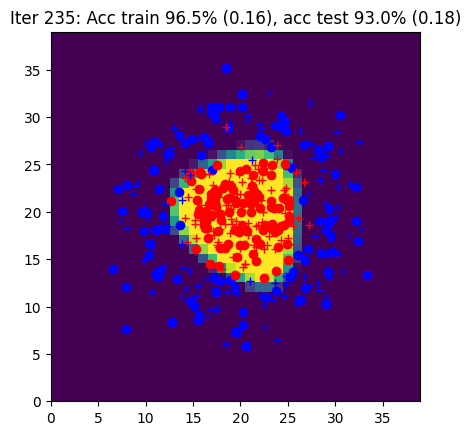

Iter 236: Acc train 96.5% (0.16), acc test 93.0% (0.18)


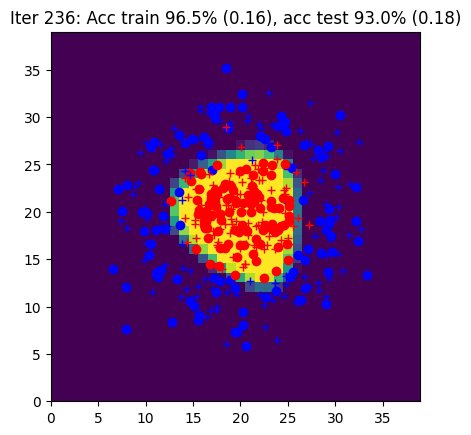

Iter 237: Acc train 96.5% (0.16), acc test 93.5% (0.18)


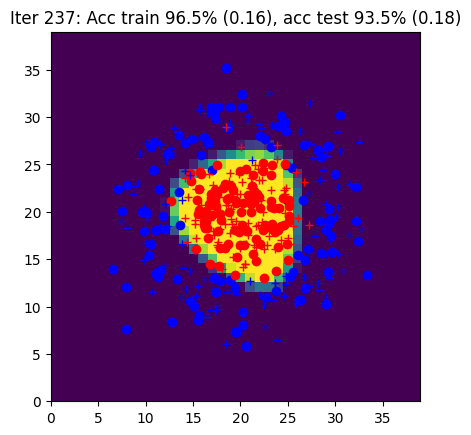

Iter 238: Acc train 96.5% (0.16), acc test 93.0% (0.18)


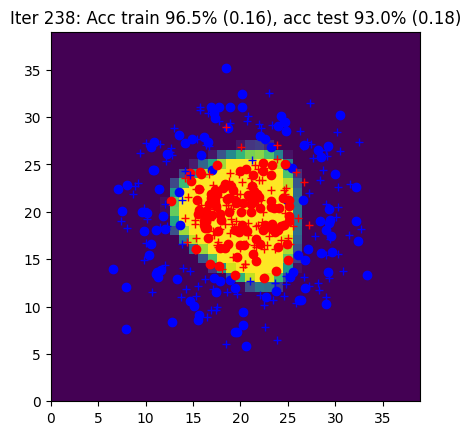

Iter 239: Acc train 96.5% (0.16), acc test 93.0% (0.18)


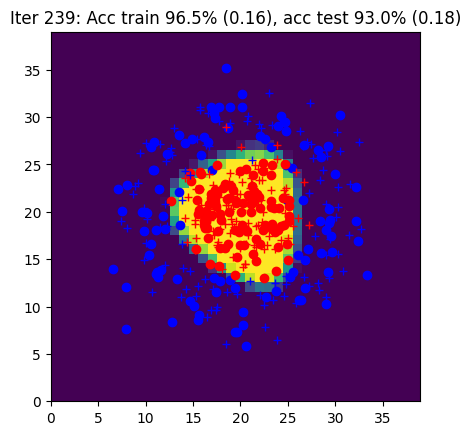

Iter 240: Acc train 96.5% (0.16), acc test 93.5% (0.18)


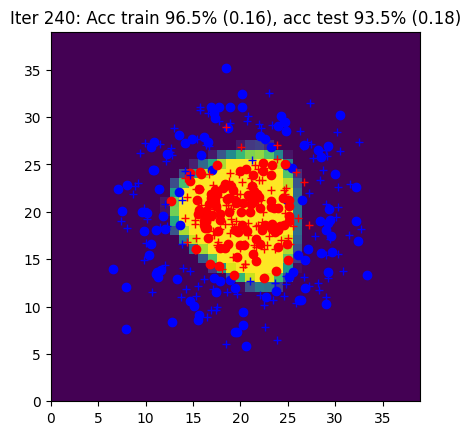

Iter 241: Acc train 96.5% (0.16), acc test 93.5% (0.18)


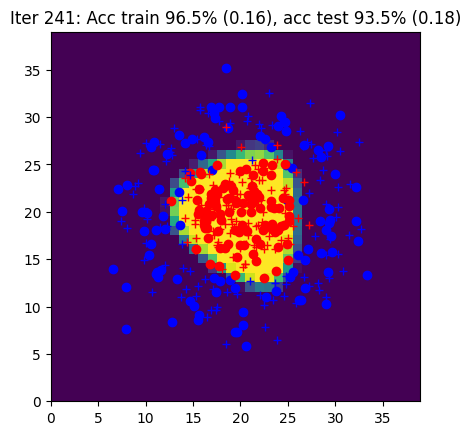

Iter 242: Acc train 96.5% (0.16), acc test 92.5% (0.18)


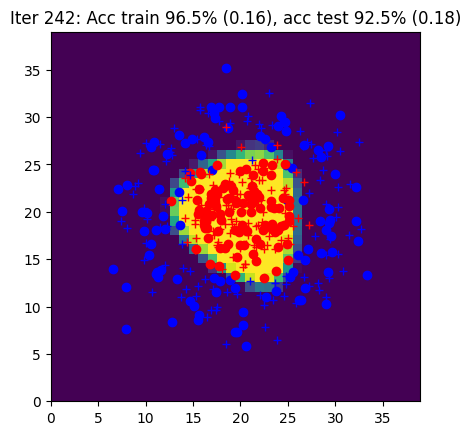

Iter 243: Acc train 96.5% (0.16), acc test 92.5% (0.18)


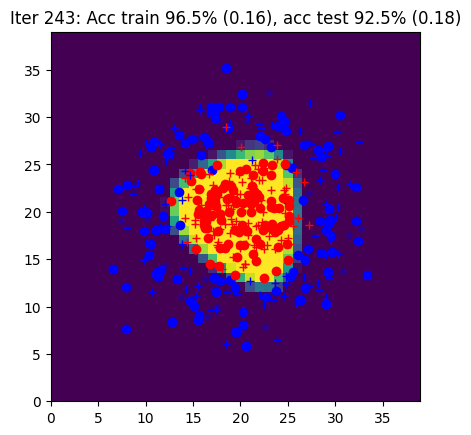

Iter 244: Acc train 96.5% (0.15), acc test 92.5% (0.18)


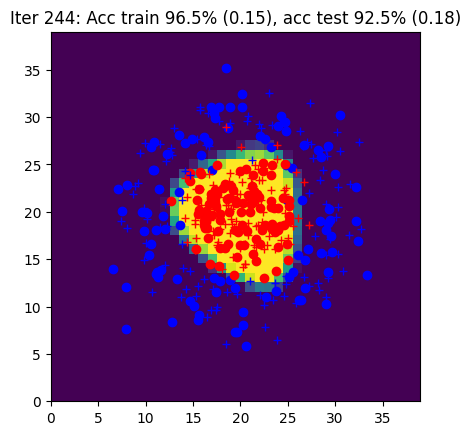

Iter 245: Acc train 96.5% (0.15), acc test 93.5% (0.18)


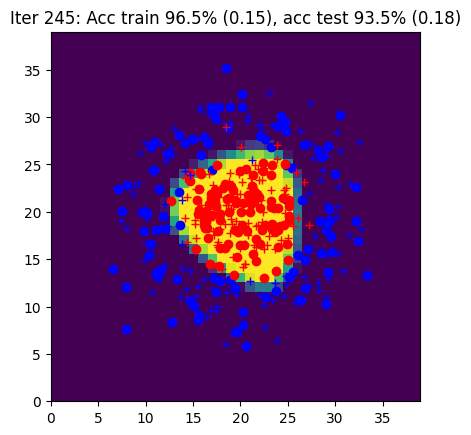

Iter 246: Acc train 96.5% (0.15), acc test 92.5% (0.18)


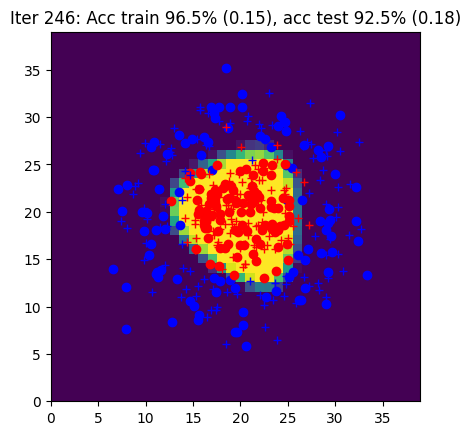

Iter 247: Acc train 96.5% (0.15), acc test 93.0% (0.18)


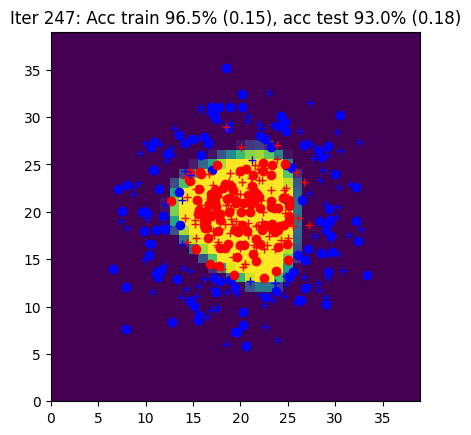

Iter 248: Acc train 96.5% (0.15), acc test 93.0% (0.18)


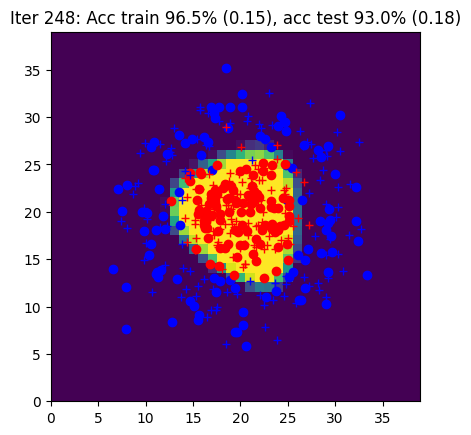

Iter 249: Acc train 96.5% (0.15), acc test 92.5% (0.18)


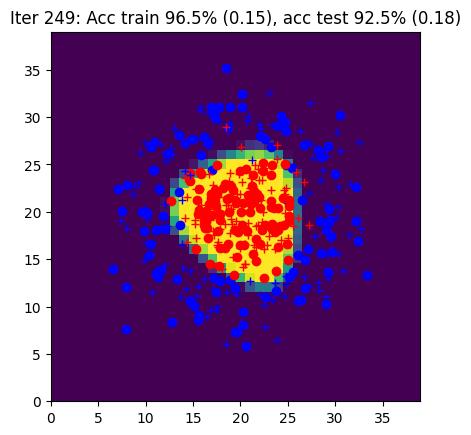

Iter 250: Acc train 96.5% (0.15), acc test 92.5% (0.18)


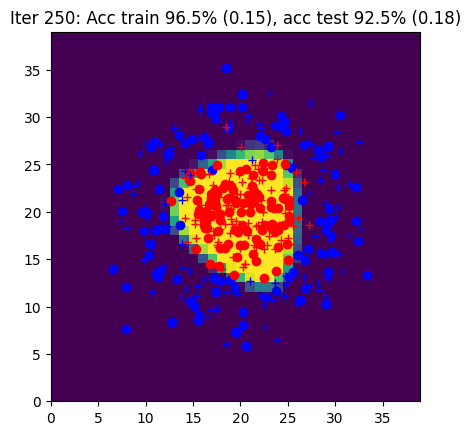

Iter 251: Acc train 96.5% (0.15), acc test 93.0% (0.18)


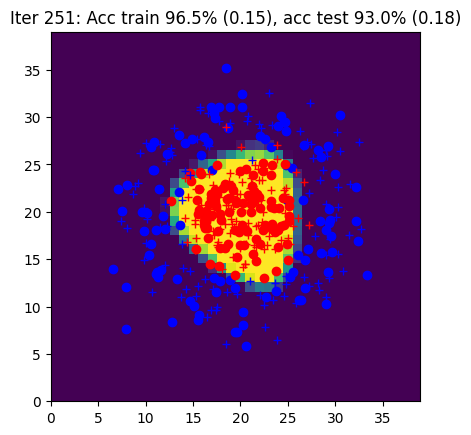

Iter 252: Acc train 96.5% (0.15), acc test 93.5% (0.18)


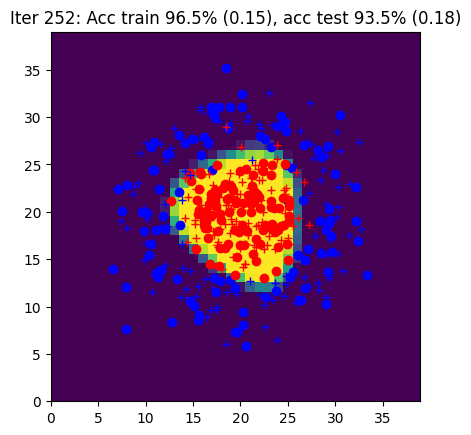

Iter 253: Acc train 96.5% (0.15), acc test 93.0% (0.18)


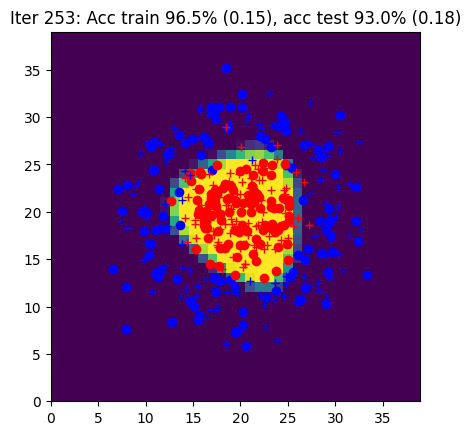

Iter 254: Acc train 96.5% (0.15), acc test 93.5% (0.18)


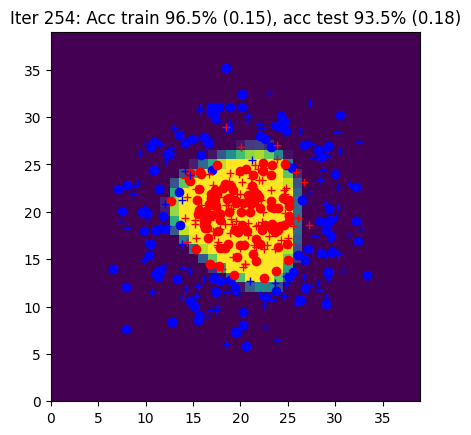

Iter 255: Acc train 96.5% (0.15), acc test 93.5% (0.17)


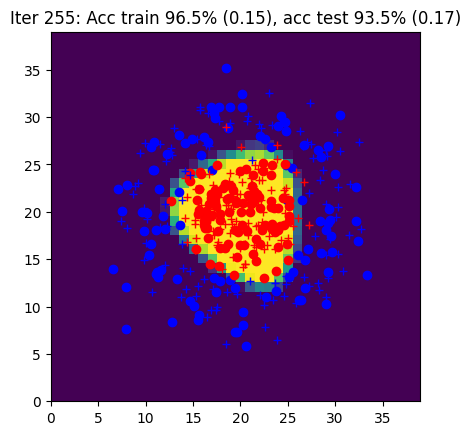

Iter 256: Acc train 96.5% (0.15), acc test 92.5% (0.18)


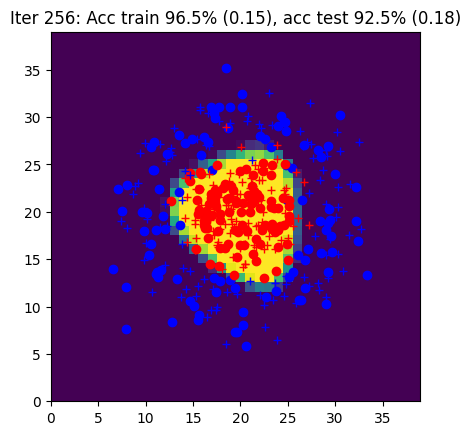

Iter 257: Acc train 96.5% (0.15), acc test 92.5% (0.18)


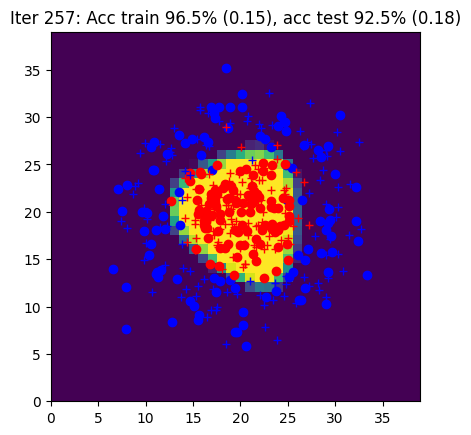

Iter 258: Acc train 96.5% (0.15), acc test 93.0% (0.17)


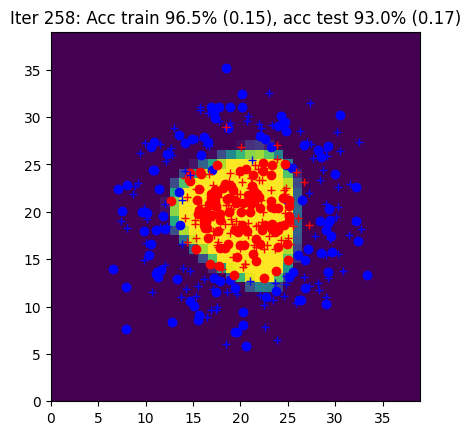

Iter 259: Acc train 96.5% (0.15), acc test 92.5% (0.18)


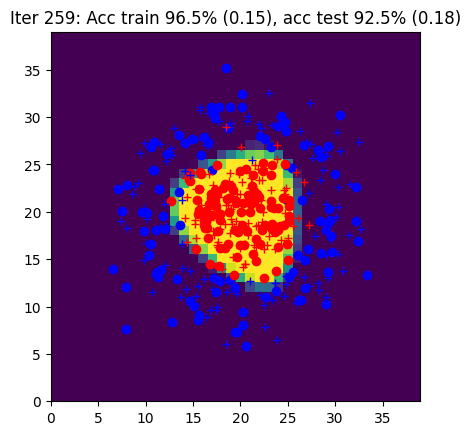

Iter 260: Acc train 96.5% (0.15), acc test 92.5% (0.17)


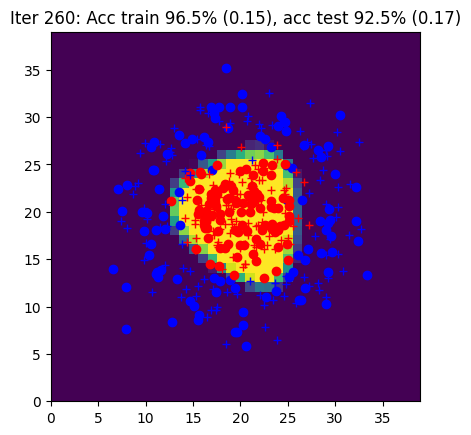

Iter 261: Acc train 96.5% (0.15), acc test 93.0% (0.17)


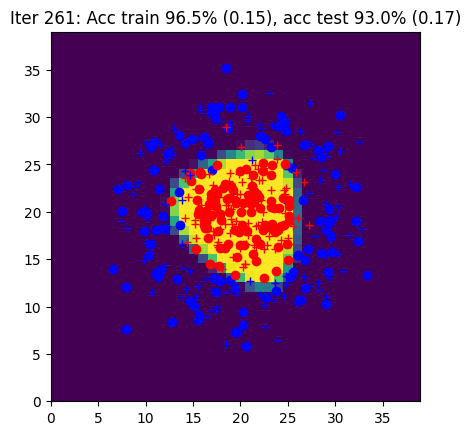

Iter 262: Acc train 96.5% (0.15), acc test 92.5% (0.17)


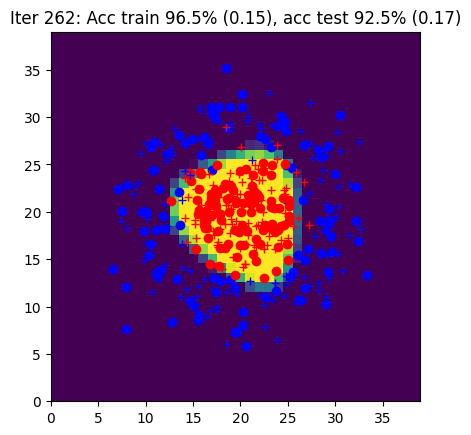

Iter 263: Acc train 96.5% (0.15), acc test 92.5% (0.17)


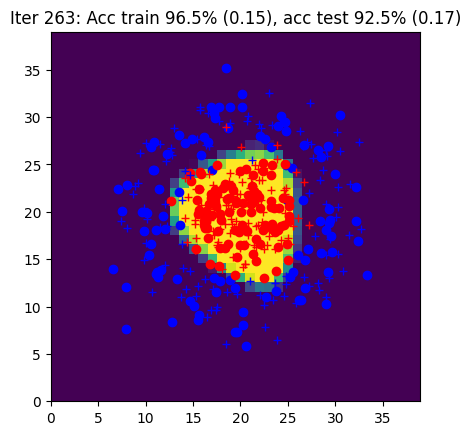

Iter 264: Acc train 96.5% (0.15), acc test 92.5% (0.17)


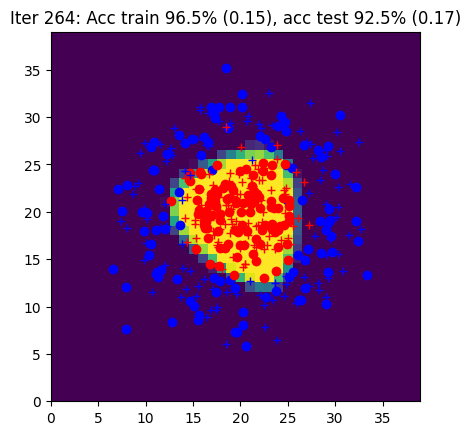

Iter 265: Acc train 96.5% (0.15), acc test 93.0% (0.17)


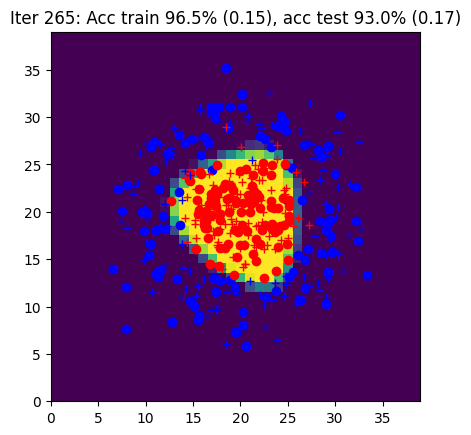

Iter 266: Acc train 96.5% (0.15), acc test 92.5% (0.17)


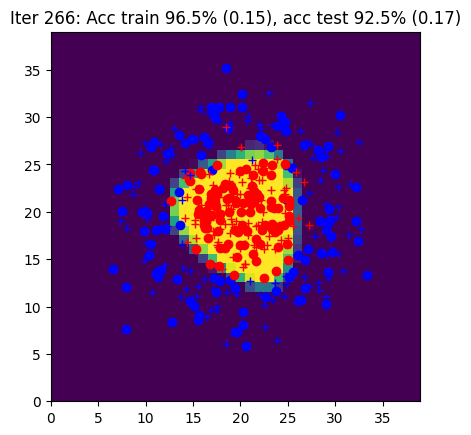

Iter 267: Acc train 96.5% (0.15), acc test 93.0% (0.17)


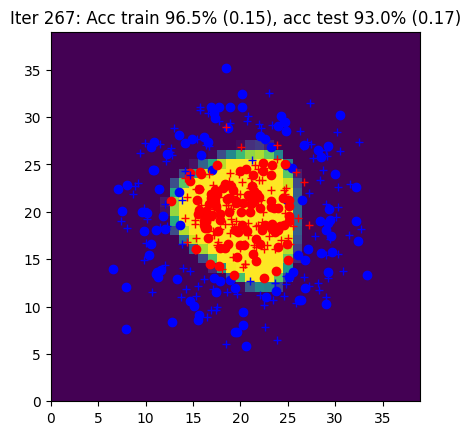

Iter 268: Acc train 96.5% (0.15), acc test 93.0% (0.17)


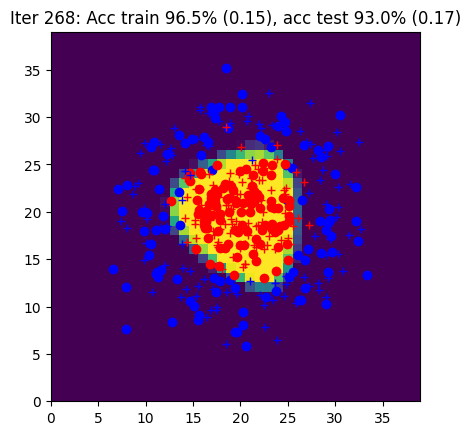

Iter 269: Acc train 96.5% (0.14), acc test 93.0% (0.17)


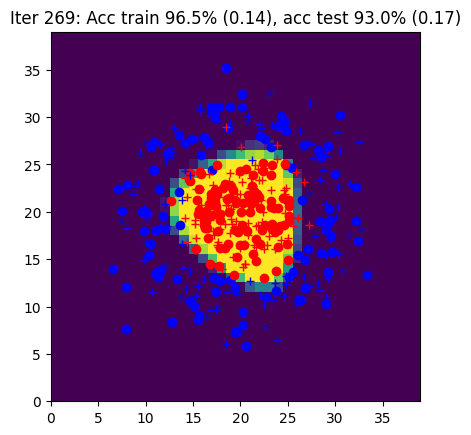

Iter 270: Acc train 96.5% (0.14), acc test 92.5% (0.17)


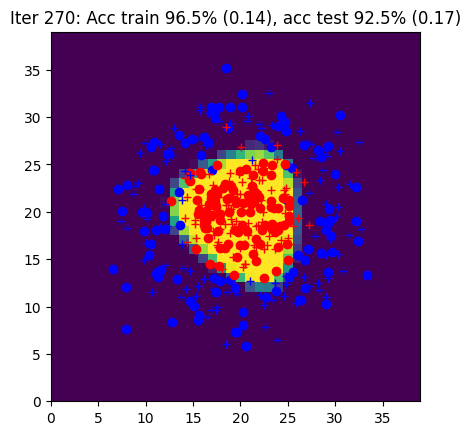

Iter 271: Acc train 96.5% (0.14), acc test 93.5% (0.17)


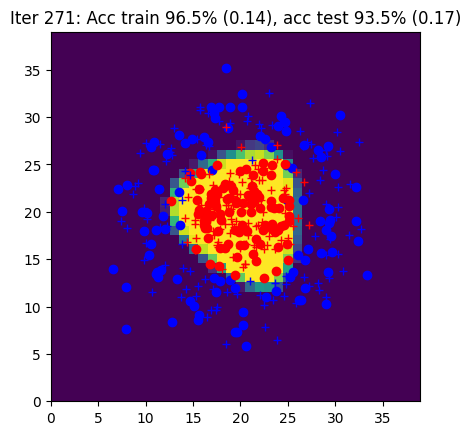

Iter 272: Acc train 96.5% (0.14), acc test 93.0% (0.17)


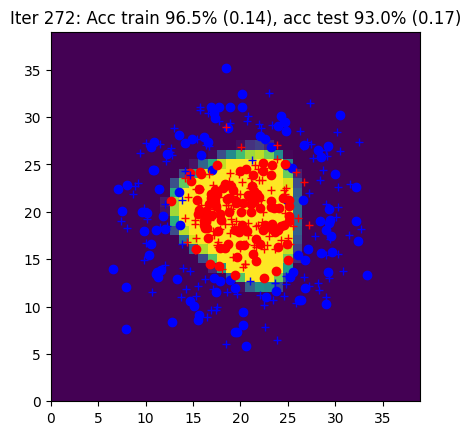

Iter 273: Acc train 96.5% (0.14), acc test 93.0% (0.17)


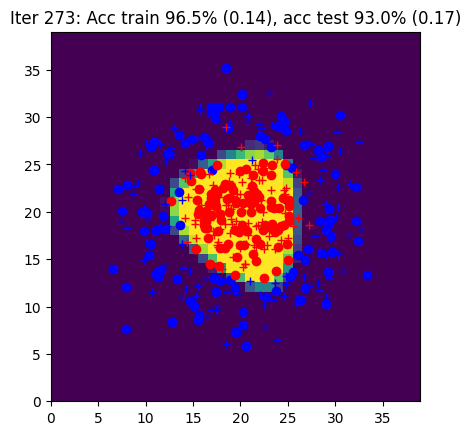

Iter 274: Acc train 96.5% (0.14), acc test 93.0% (0.17)


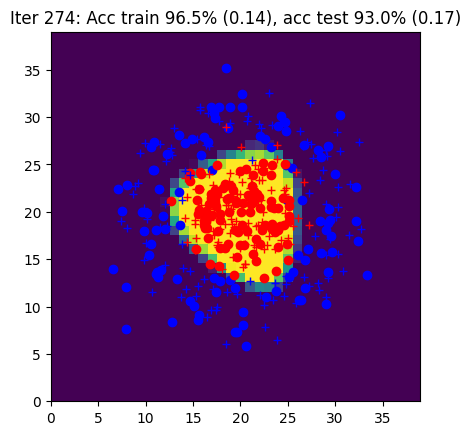

Iter 275: Acc train 96.5% (0.14), acc test 93.0% (0.17)


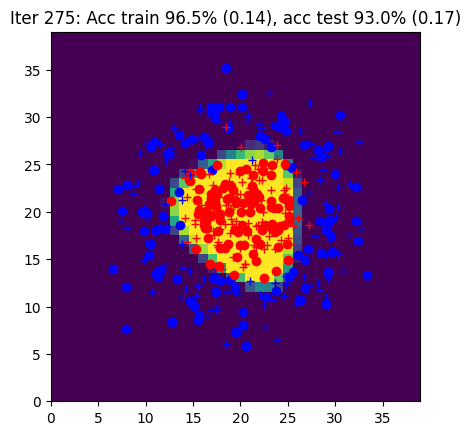

Iter 276: Acc train 96.5% (0.14), acc test 93.0% (0.17)


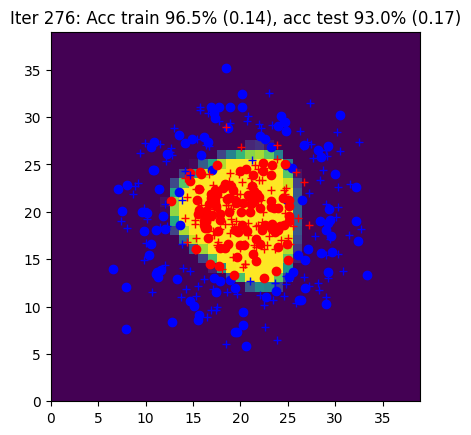

Iter 277: Acc train 96.5% (0.14), acc test 92.5% (0.17)


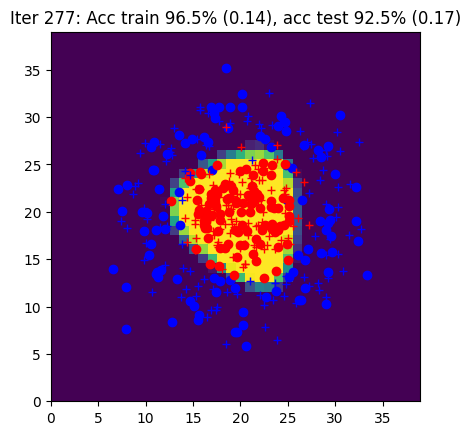

Iter 278: Acc train 96.5% (0.14), acc test 93.0% (0.17)


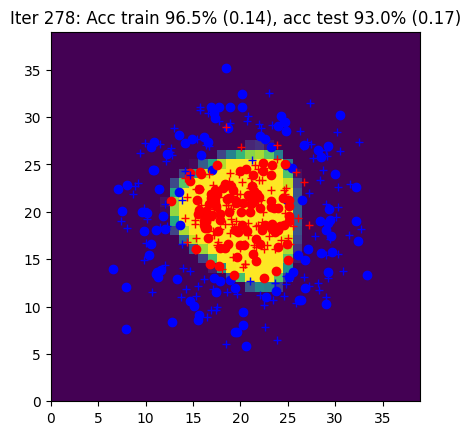

Iter 279: Acc train 96.5% (0.14), acc test 93.0% (0.17)


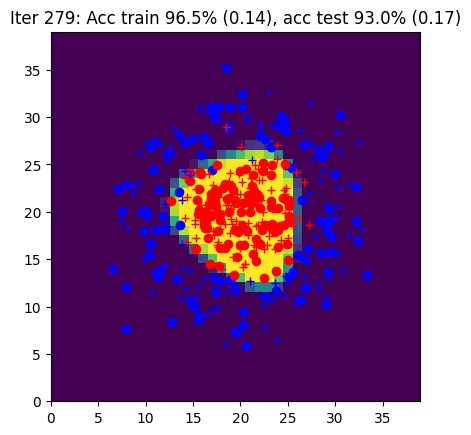

Iter 280: Acc train 96.5% (0.14), acc test 93.0% (0.17)


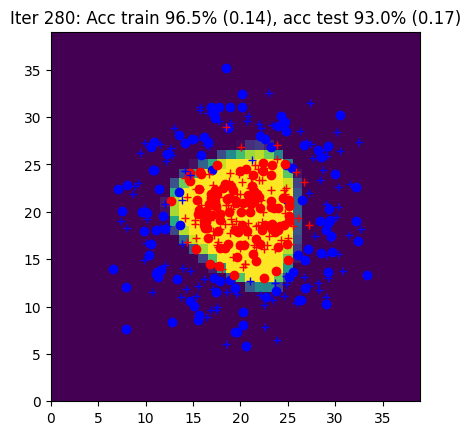

Iter 281: Acc train 96.5% (0.14), acc test 93.0% (0.17)


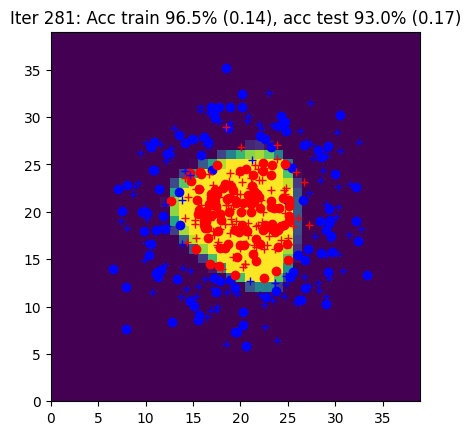

Iter 282: Acc train 96.5% (0.14), acc test 93.0% (0.17)


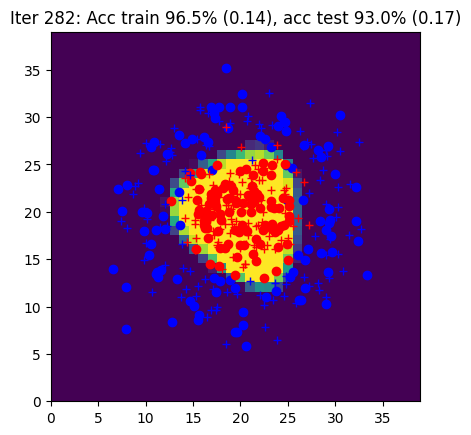

Iter 283: Acc train 96.5% (0.14), acc test 93.0% (0.17)


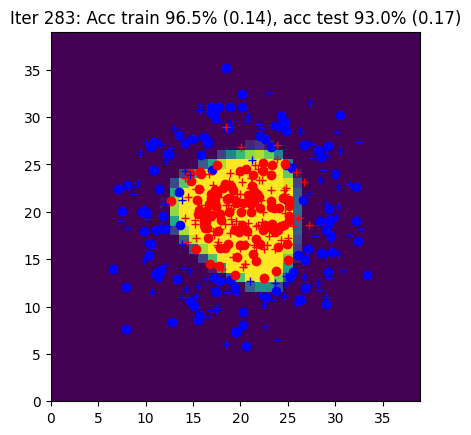

Iter 284: Acc train 96.5% (0.14), acc test 93.0% (0.17)


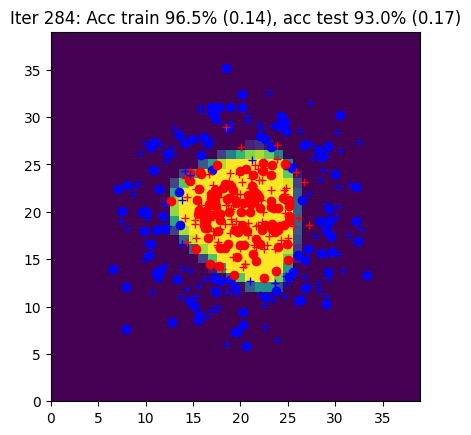

Iter 285: Acc train 96.5% (0.14), acc test 93.0% (0.17)


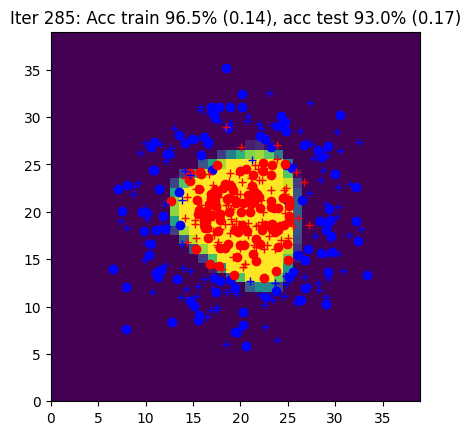

Iter 286: Acc train 96.5% (0.14), acc test 93.0% (0.17)


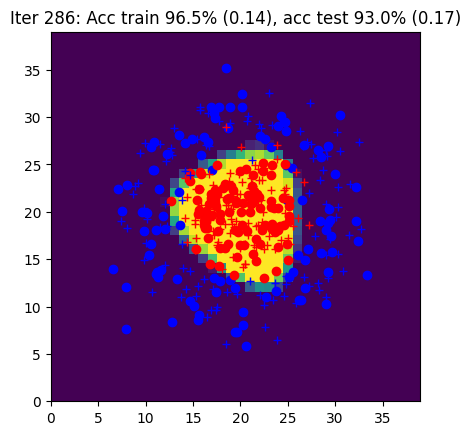

Iter 287: Acc train 96.5% (0.14), acc test 93.0% (0.17)


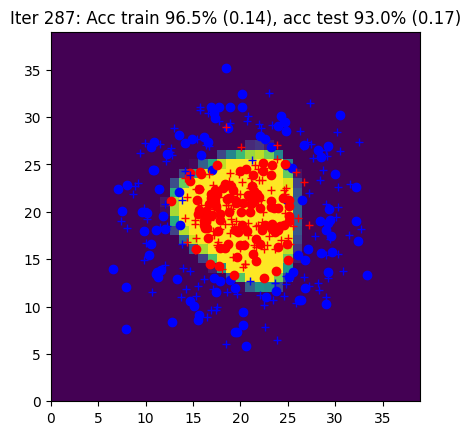

Iter 288: Acc train 96.5% (0.14), acc test 92.5% (0.17)


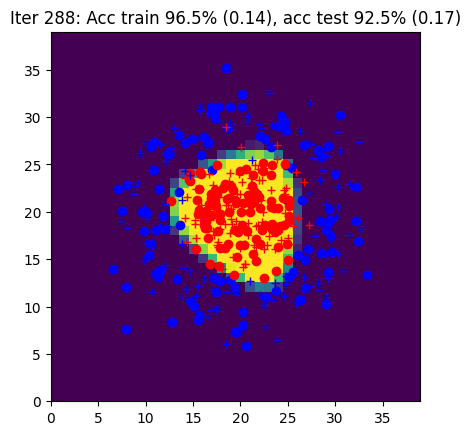

Iter 289: Acc train 96.5% (0.14), acc test 93.0% (0.17)


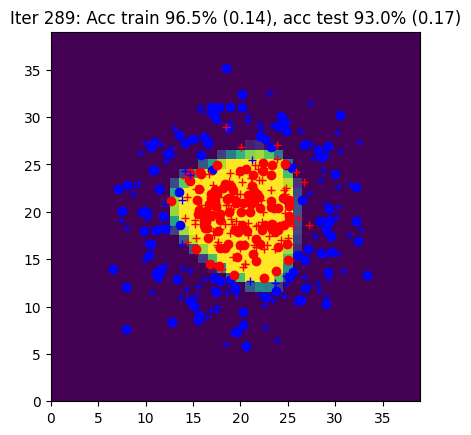

Iter 290: Acc train 96.5% (0.14), acc test 93.0% (0.17)


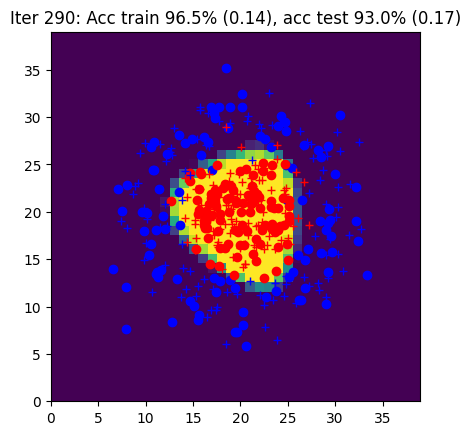

Iter 291: Acc train 96.0% (0.14), acc test 92.5% (0.17)


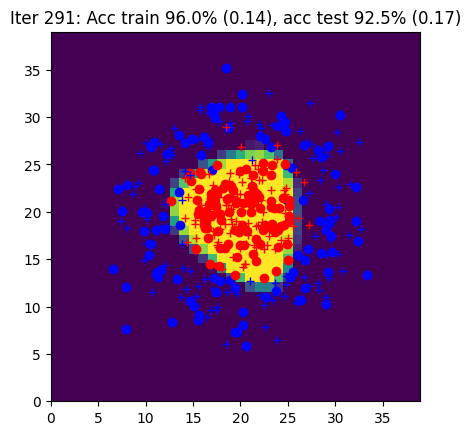

Iter 292: Acc train 96.5% (0.14), acc test 93.0% (0.17)


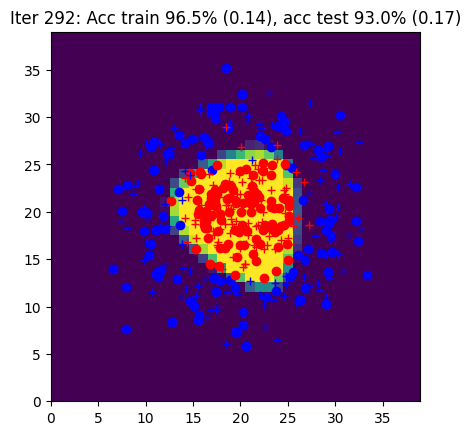

Iter 293: Acc train 96.5% (0.14), acc test 93.0% (0.17)


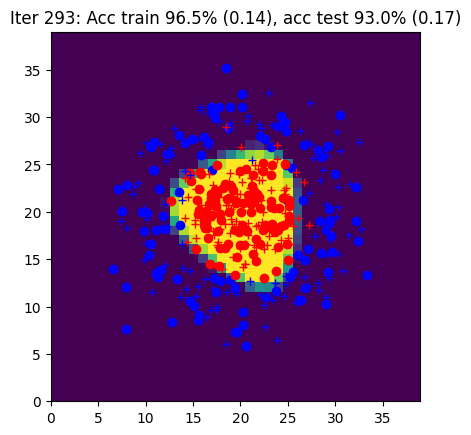

Iter 294: Acc train 96.5% (0.14), acc test 93.0% (0.17)


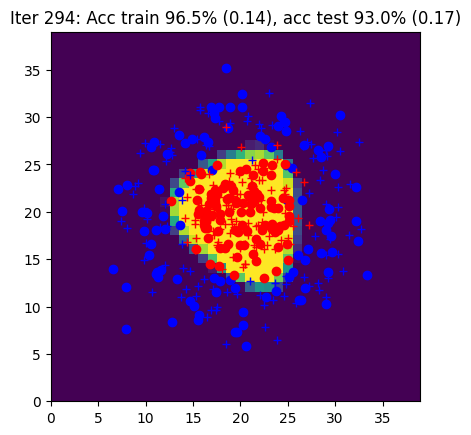

Iter 295: Acc train 96.5% (0.14), acc test 93.0% (0.17)


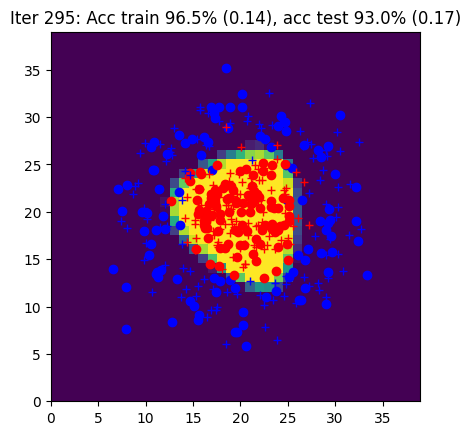

Iter 296: Acc train 96.5% (0.14), acc test 92.5% (0.17)


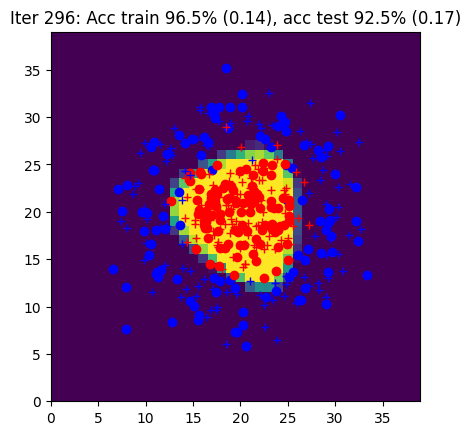

Iter 297: Acc train 96.0% (0.14), acc test 92.5% (0.17)


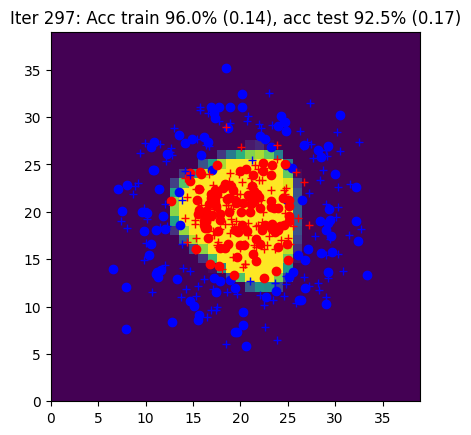

Iter 298: Acc train 96.0% (0.14), acc test 92.5% (0.17)


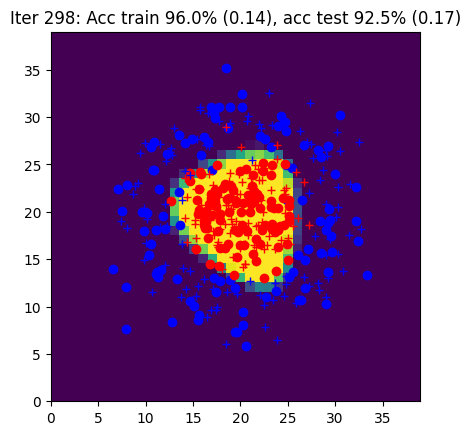

Iter 299: Acc train 95.0% (0.14), acc test 92.5% (0.17)


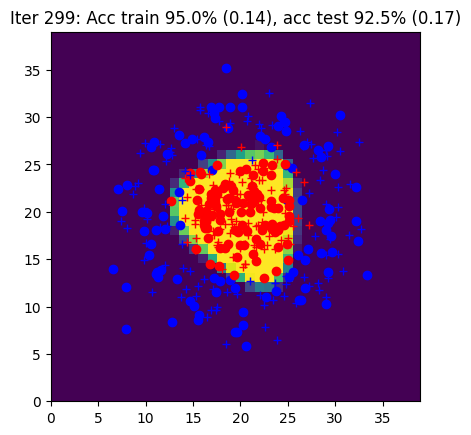

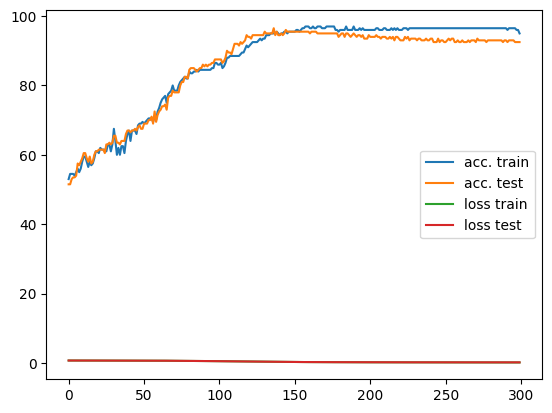

In [ ]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

params = init_params(nx, nh, ny)

curves = [[],[], [], []]

# epoch
for iteration in range(300):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Votre code ici  ##
    #####################
    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]

        Y_hat, outputs = forward(params, X)
        loss, accuracy = loss_accuracy(Y_hat, Y)
        grads = backward(params, outputs, Y)
        params = sgd(params, grads, eta)

        # écrire l'algorithme d'apprentissage sur le batch (X,Y)
        # en utilisant les fonctions forward, loss_accuracy, backward, sgd


    ####################
    ##      FIN        #
    ####################


    Yhat_train, _ = forward(params, data.Xtrain)
    Yhat_test, _ = forward(params, data.Xtest)
    Ltrain, acctrain = loss_accuracy(Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(Yhat_test, data.Ytest)
    Ygrid, _ = forward(params, data.Xgrid)

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title)
    data.plot_data_with_grid(Ygrid, title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()